In [183]:
import torch
import math
from SC_IPFP.torch.utils import NN, log_kde_pdf_per_point, silvermans_rule
from SC_IPFP.torch.sde_solvers_time import solve_sde_RK


from tqdm.notebook import tqdm



import itertools
from functools import partial
# np = jax.numpy
import matplotlib.pyplot as plt

In [328]:
def solve_sde_RK(alfa=None, beta=None, X0=None, dt=1.0, N=100, t0=0.0,
                theta=None, noise=False, forwards=True):
    """
            Euler Mayurama method
    Syntax:
    ----------
    solve_sde(alfa=None, beta=None, X0=None, dt=None, N=100, t0=0, DW=None)
    Parameters:
    ----------
        alfa  : a  function with two arguments, the X state and the time
                defines the differential equation.
        beta  : a  function with two arguments, the X state and the time
                defines the stochastic part of the SDE.
        X0    : Initial conditions of the SDE. Mandatory for SDEs
                with variables > 1 (default: gaussian np.random)
        dt    : The timestep of the solution
                (default: 1)
        N     : The number of timesteps (defines the length of the timeseries)
                (default: 100)
        t0    : The initial time of the solution
                (default: 0)
    
    """
    
#     print(X0)
       
    if alfa is None or beta is None:
        raise ValueError("Error: SDE not defined.")

    n, d, *_ = X0.shape
    
    T = torch.tensor(dt * N).cuda()
    
    DWs  = torch.empty((n, N-1, d)).normal_(mean=0, std=1).cuda() * math.sqrt(dt)
    
    
    Y, ti = torch.zeros((n, N, d + 1)).double().cuda(), torch.arange(N).double().cuda()*dt + t0
    t0rep =  (
        t0 * torch.ones((X0.shape[0], 1)).double().cuda() if forwards
        else (T-t0) * torch.ones((X0.shape[0], 1)).double().cuda()
    )
#     Y[:, 0, :] =  torch.cat((X0, t0rep), axis=1 )
    ixs = torch.arange(3, dtype=torch.int64)
    Y = torch.cat((X0, t0rep), axis=1 )[:, None, :]

    N = int(N)
    
    T = dt * N
        
    for n in range(N-1):
        t = ti[n]
        a, DW_n = alfa(Y[:,n, :]),  DWs[:,n,:]
        newY = (  
            Y[:,n, :-1] + a * dt + beta * DW_n
        )
        
        trep = (
            t.repeat(newY.shape[0]).reshape(-1,1) if forwards
            else T - t.repeat(newY.shape[0]).reshape(-1,1)
        )
        
        tocat = torch.cat((newY, trep), dim=1)[:, None, :]
        Y = torch.cat((Y,tocat) , dim=1)
    if torch.isnan(Y).any() or torch.isinf(Y).any(): import pdb; pdb.set_trace()
#     import pdb; pdb.set_trace()
    return ti, Y

In [338]:
def divergence(outputs, inputs):
    grads_ = torch.autograd.grad(
            outputs, inputs, torch.ones_like(outputs),
            retain_graph=True, create_graph=True
     )[0]
    return grads_[:,:,:-1].sum(dim=2)

In [365]:
class cIPFP(object):
    
    def __init__(self, X_0, X_1, weights=[100], batch_size=None,  rng = None, rng_b = None, 
                nrng = None, number_time_steps=16, sde_solver=solve_sde_RK, sigma_sq=1, 
                step_size = 0.001, num_epochs = 10, momentum_mass = 0.9, create_network=None,
                log_prob=log_kde_pdf_per_point, optimizer=torch.optim.SGD):
        
        self.sde_solver = sde_solver
        
        self.number_time_steps = number_time_steps
        self.dt = 1.0 / number_time_steps
        
        
        self.batch_size_f = X_0.shape[0] if batch_size is None else batch_size
        self.batch_size_b = X_1.shape[0] if batch_size is None else batch_size
        with torch.cuda.device(0):
        
            self.X_0 = X_0.requires_grad_()
            self.X_1 = X_1.requires_grad_()

            self.H_0 = silvermans_rule(X_0)
            self.H_1 = silvermans_rule(X_1)

            _, self.dim = self.X_0.shape

            weights = weights + [self.dim]


            self.b_forward = NN(self.dim + 1, weights).double().cuda()
            self.b_backward = NN(self.dim + 1, weights).double().cuda()

            self.theta_f = list(self.b_forward.parameters())
            self.theta_b = list(self.b_backward.parameters())

            self.sigma = sigma_sq

            self.optimizer_f = optimizer(
                self.theta_f, lr=step_size
            )

            self.optimizer_b = optimizer(
                self.theta_b, lr=step_size
            )

            num_complete_batches_f, leftover_f = divmod(self.X_0.shape[0], self.batch_size_f)
            self.num_batches_f = num_complete_batches_f + bool(leftover_f)

            num_complete_batches_b, leftover_b = divmod(self.X_1.shape[0], self.batch_size_b)
            self.num_batches_b = num_complete_batches_b + bool(leftover_b)

            self.first_iter_fac = 0.0

            self.log_prob = log_prob

            self.burn_in = False
    
    def data_stream(self, forward=True):
        X = self.X_0 if forward else self.X_1
        
        batch_size = self.batch_size_f if forward else self.batch_size_b
        num_batches = self.num_batches_f if forward else self.num_batches_b
        
        num_train = self.X_0.shape[0] if forward else self.X_1.shape[0]
        while True:
            perm = torch.randperm(X.size()[0])
            for i in range(num_batches):
                batch_idx = perm[i * batch_size:(i + 1) * batch_size]
                yield X[batch_idx] 
        
    def loss_for_trajectory(self, Xt, forwards):
        n_, *_ = Xt.shape
        
        if not forwards :
            Xt = Xt.flip(1)
        
        if forwards:
            b_minus  = self.b_backward.forward( Xt)
            b_plus = self.b_forward.forward(Xt)
            div = divergence(b_minus, Xt)
        else:
            b_minus  = self.b_backward.forward(Xt)
            b_plus = self.b_forward.forward(Xt) * self.first_iter_fac 
            div = -divergence(b_plus, Xt) * self.first_iter_fac 

            
        sign = 1.0 if forwards else -1.0
        
        time_integral = (sign *  (b_plus - b_minus))**2 * self.dt 
        out =  0.5 * time_integral.sum(axis=(1,2))  - (div.sum(axis=(1)) *  self.dt )
        
        return out


    def inner_loss_jit(self, batch,  
                       batch_terminal_empirical,
                       forwards):
        
        b = (
            self.b_forward.forward
            if forwards else (lambda X: -self.b_backward.forward(X))
        )
        
        t, Xt, *W = self.sde_solver(
            b, self.sigma, batch, self.dt, 
            self.number_time_steps, 0,
            None, False, forwards
        )
        Ht = silvermans_rule(Xt[:,-1,:-1])
        H = silvermans_rule(batch_terminal_empirical)
        
        main_term = self.loss_for_trajectory(Xt, forwards)

        if not self.burn_in:
            xx = torch.linspace(-30, 30 , 1000).reshape(-1,1).double().cuda()
            yy = self.log_prob( xx, batch_terminal_empirical, H)  
            plt.plot(
                xx.detach().cpu().numpy(),
                np.exp(yy.detach().cpu().numpy())
            )
            plt.show()
            cross_entropy = -self.log_prob( Xt[:,-1,:-1], batch_terminal_empirical, H)             
        else:
            cross_entropy = -self.log_prob(batch_terminal_empirical, Xt[:,-1,:-1], Ht)

        J = torch.mean(main_term +  cross_entropy )
        J = torch.squeeze(J)
        return J
    
    def inner_loss(self, batch, forwards=True):
        
        if self. burn_in:
            self.batch_terminal_empirical_burn = next(self.data_stream(forward=forwards))
            self.H_burn = self.H_0 if forwards else self.H_1
#         else:
        batch_terminal_empirical = next(self.data_stream(forward=not(forwards)))
        H = self.H_1 if forwards else self.H_0

        return self.inner_loss_jit(
            batch, batch_terminal_empirical,
            forwards
        )

    def closure(self, X, forwards=True):
        """
        Close method required for pytorches CG and LBFGS optimizers
        :params X[torch.tensor]: nxdim  torch tensor representing dataset
        """
        
        opt = self.optimizer_f if forwards else self.optimizer_b
        
        opt.zero_grad()
        loss = self.inner_loss(X, forwards)
        loss.backward()
        return loss
    
    
    def fit(self, IPFP_iterations=10, sub_iterations=10, plot=False, burn_iterations=7):     
        
        name = str(self.optimizer_f).lower()
        bfgs_cg_flag  = "bfgs" in name or "cg" in name
        close_f, close_b =  [], []

        
        
        if plot: self.plot_trajectories()
        
        self.first_iter_fac = 0.0
        if burn_iterations > 0 : self.burn_in = True
            
        
        batches_f = self.data_stream(forward=True)
        batches_b = self.data_stream(forward=False)
        
        loss_b, loss_f = [], []
        for i in tqdm(range(IPFP_iterations + burn_iterations)):
            
            if i == burn_iterations:
                self.burn_in = False
                self.first_iter_fac = 0.0
            
            
            for k in range(sub_iterations):
                for _ in range(self.num_batches_b):
                    batch_b =  next(batches_b)
                    
                    if bfgs_cg_flag:
                        close_b = [lambda : self.closure(batch_b, False)]
                    lossb = self.inner_loss(
                        batch_b, False
                    )
                    lossb.backward()
                    self.optimizer_b.step(*close_b)
                print(f"loss b {lossb}")
            loss_b.append(lossb)

            self.first_iter_fac = 1.0
       
            for k in range(sub_iterations):
                for _ in range(self.num_batches_f):
                    batch_f =  next(batches_f)
                    if bfgs_cg_flag:
                        close_f = [lambda : self.closure(batch_f, True)]
                    lossf = self.inner_loss(
                        batch_f, True
                    )
                    
                    lossf.backward()
                    self.optimizer_f.step(*close_f)
  
                print(f"loss f {lossf}")
            loss_f.append(lossf)


            self.loss_f = loss_f
            self.loss_b = loss_b
            if plot: self.plot_trajectories()

        
        plt.plot(range(IPFP_iterations), loss_f, "g")
        plt.show()
        plt.plot(range(IPFP_iterations), loss_b, "b")
        plt.show()
        
    def plot_trajectories(self):
        bb = lambda X: -self.b_backward(X)

        t, Xts = c.sde_solver(
            self.b_forward.forward, self.sigma,
            self.X_0, self.dt,  self.number_time_steps, 0.0,
            self.theta_f, False, True
        )
        t_, Xts_ = c.sde_solver(
            bb, self.sigma, 
            self.X_1, self.dt, self.number_time_steps, 0.0, 
            self.theta_b, False, False
        )
        
        fn = 14
        fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
        axs[1].set_xlabel("$t$", fontsize=fn)
        axs[1].set_ylabel("$x(t)$", fontsize=fn)
        axs[0].set_ylabel("$x(t)$", fontsize=fn)

        tt = axs[1].get_xticks()
        axs[1].set_xticks(tt.flatten() )
        axs[1].set_xticklabels(list(map (lambda x: '{0:.2f}'.format((x)), tt))[::-1])

        for i in range(n):
            label = "$\mathbb{Q}$: Forward process" if i == 0 else None
            axs[0].plot(t.cpu().flatten(), Xts[i,:,:-1].detach().cpu().numpy().flatten(), 'b', alpha=0.03,  label=label)


        for i in range(n):
            label = "$\mathbb{P}$: Reverse process" if i == 0 else None
            axs[1].plot(t_.cpu().flatten(), Xts_[i,:, :-1].detach().cpu().numpy().flatten(), 'r', alpha=0.03, label=label)

        axs[1].legend(fontsize=fn)
        axs[0].legend(fontsize=fn)

        plt.show()    
    
    #     @partial(jit, static_argnums=(0,2))
    def transport_batch(self, batch_x, forwards):
        theta = self.theta_f if forwards else self.theta_b    
        b = self.b_forward if forwards else  lambda X, theta: -self.b_backward(X, theta)

        t, Xt = self.sde_solver(
            alfa=b, beta=self.sigma, dt=self.dt, 
            X0=batch_x.reshape(-1,self.dim), N=self.number_time_steps, theta=theta
        )

        return Xt[:,-1,:]
            

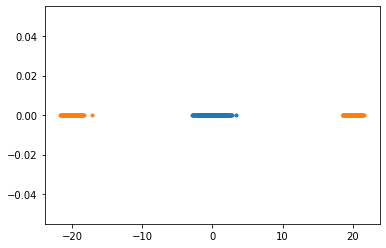

In [371]:
import numpy.random as npr
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

n = 900
n_2 = int(n * 1.0 / 3)
n_2 = int(n * 1.0 / 2.0)


X1 = npr.randn(n).reshape(-1,1) - 0
X21 = 0.6 * npr.randn(n_2).reshape(-1,1) + 20
X22 =  0.6 * npr.randn(n_2).reshape(-1,1) -20
# X23 =  0.6 * npr.randn(n_2).reshape(-1,1) + 20

X2 = np.concatenate((X21, X22), axis=0)
X1, X2 = X2, X1

plt.plot(X2.flatten(), [0] * n, '.')
plt.plot(X1.flatten(), [0] * n, '.')

with torch.cuda.device(0):

    X1 = torch.tensor(X1).cuda()
    X2 = torch.tensor(X2).cuda()

In [372]:
c = cIPFP(
    X1, X2,  number_time_steps=100, batch_size=900 ,
    step_size =1e-6, weights=[20,20,20], rng = None,
    optimizer=torch.optim.SGD
)

/auto/homes/fav25/SC-IPFP/SC_IPFP/torch/utils.py:73: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(self.layers[i].weight)


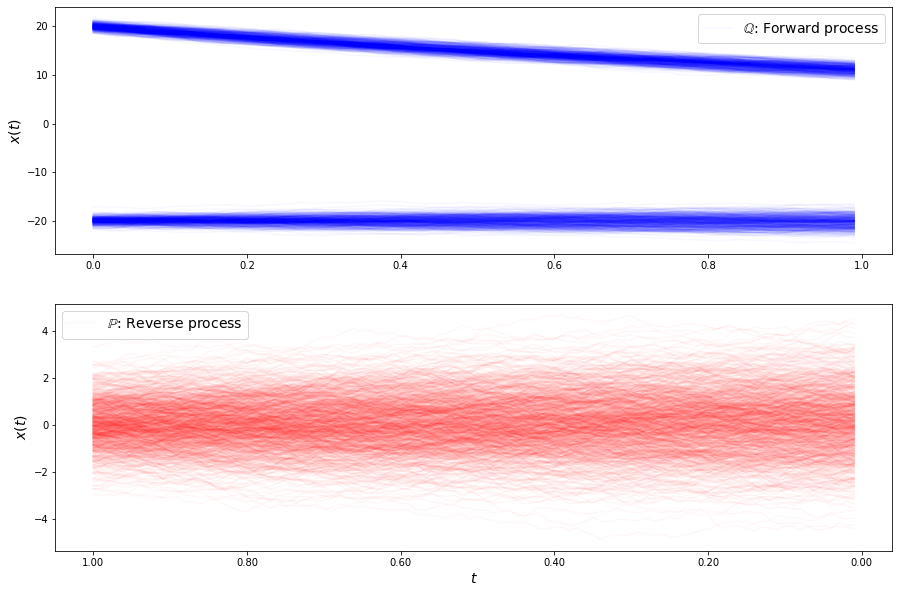

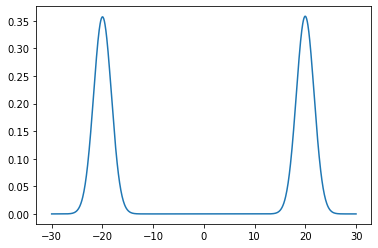

loss b 57.60030503793824


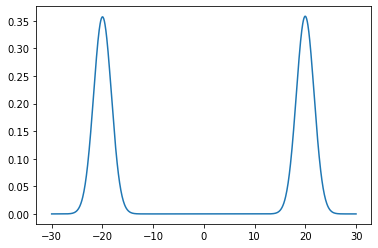

loss b 57.42674583759891


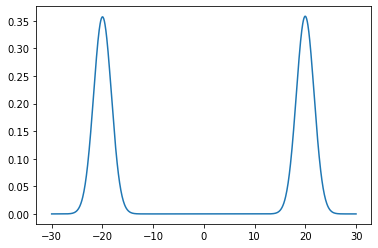

loss b 57.446402258709334


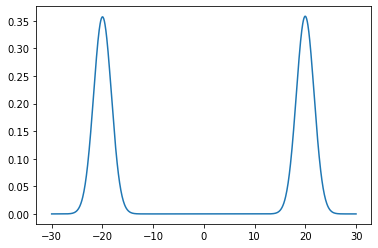

loss b 57.086070761355025


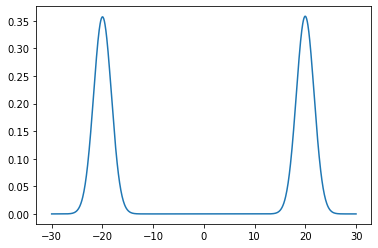

loss b 57.278179847097036


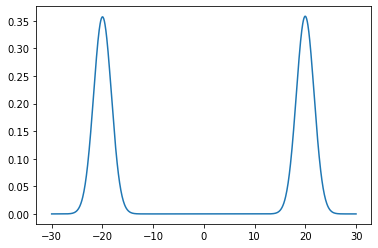

loss b 57.4523334616127


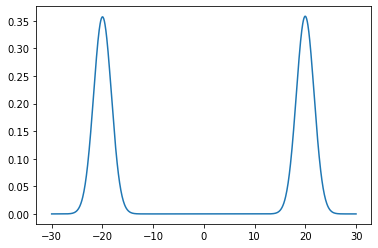

loss b 57.20008965531916


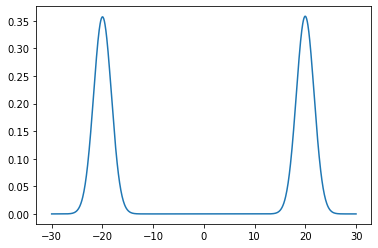

loss b 57.17193432353211


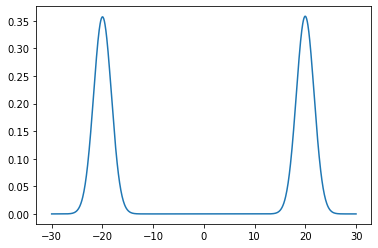

loss b 57.29702498371782


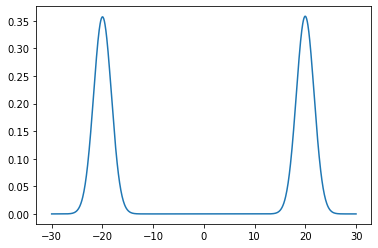

loss b 57.31496679713487


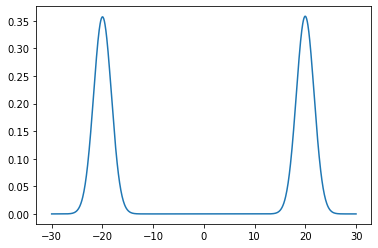

loss b 57.26553203511536


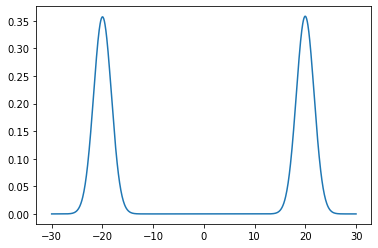

loss b 56.890651887856734


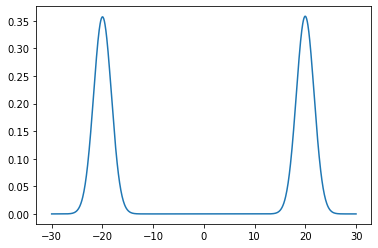

loss b 57.299682955121746


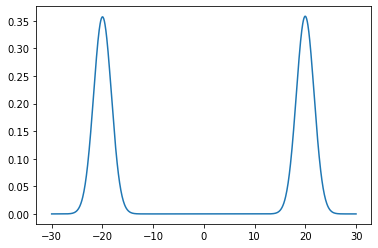

loss b 57.290939163506565


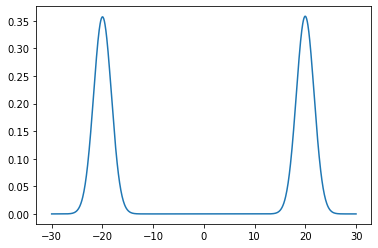

loss b 57.45450791845983


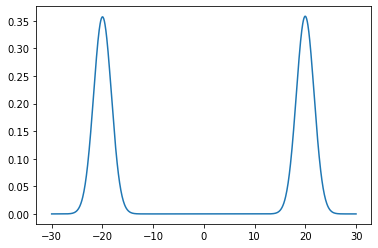

loss b 57.16412507589211


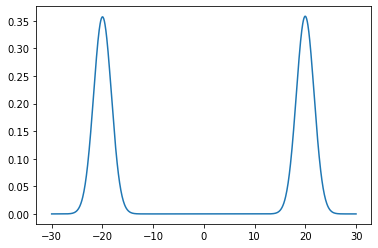

loss b 57.4085621559147


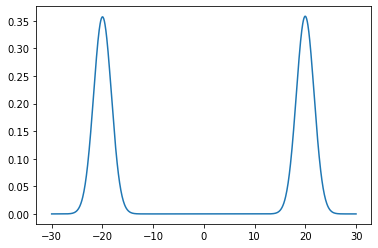

loss b 57.327591077025026


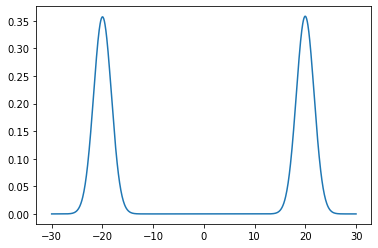

loss b 57.135251478217825


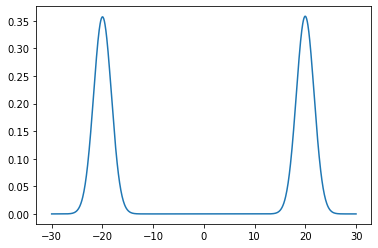

loss b 57.18213347196039


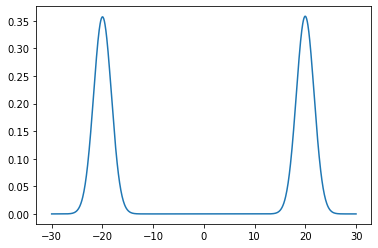

loss b 57.35771442802398


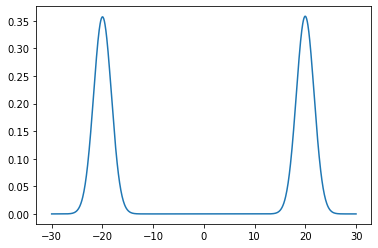

loss b 57.241147362075246


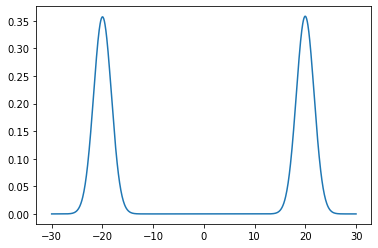

loss b 57.27067352833436


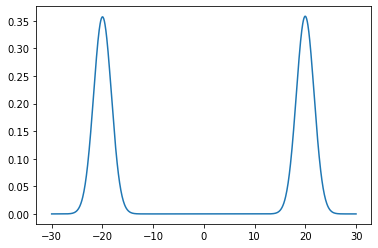

loss b 57.49488273950054


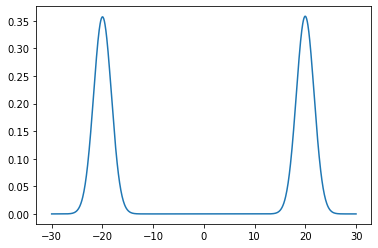

loss b 57.25964123707589


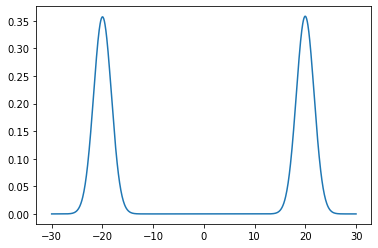

loss b 57.25847620706151


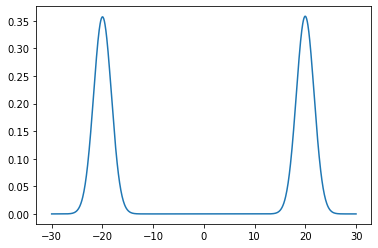

loss b 57.207005567662165


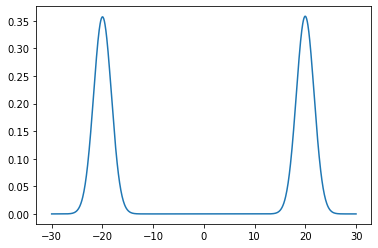

loss b 57.35145955272008


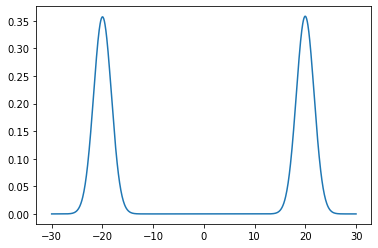

loss b 57.36115105553958


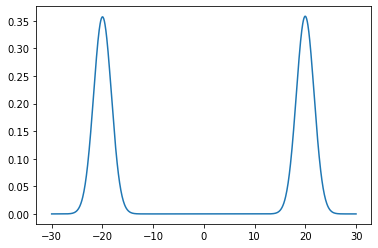

loss b 57.081799629646234


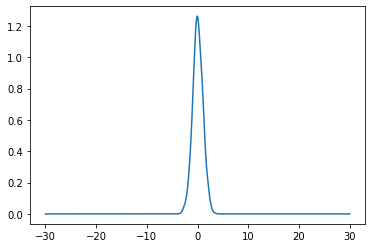

loss f 714.7381411125734


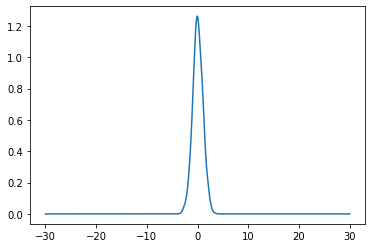

loss f 706.9844972258803


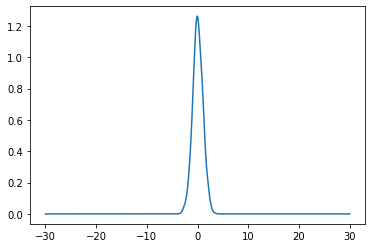

loss f 697.6926655909134


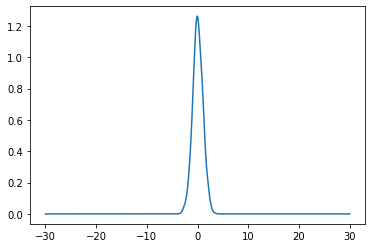

loss f 686.2182058575781


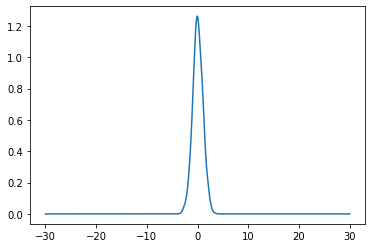

loss f 673.2386072932873


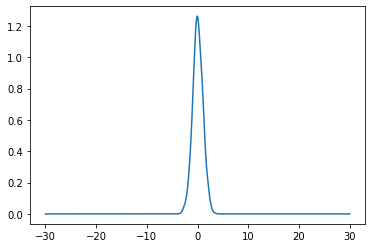

loss f 656.5575224766955


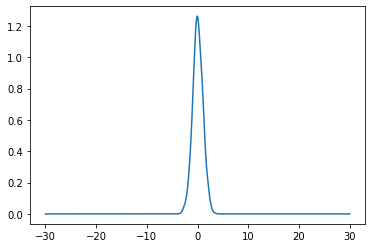

loss f 637.1928448434867


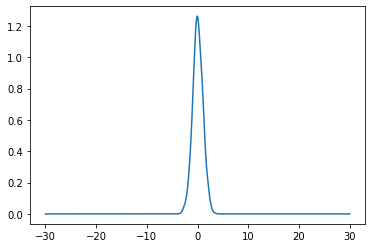

loss f 624.4227407873329


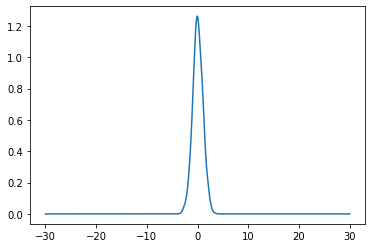

loss f 617.2383375763106


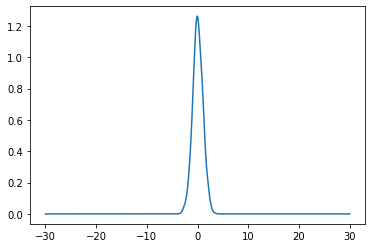

loss f 597.1949600044095


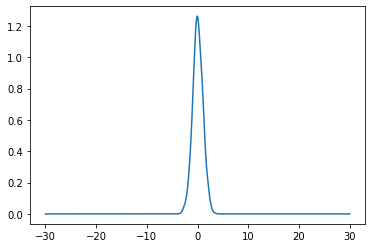

loss f 584.7272224990954


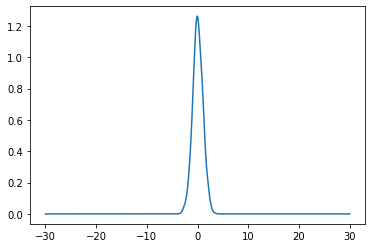

loss f 578.9560392634532


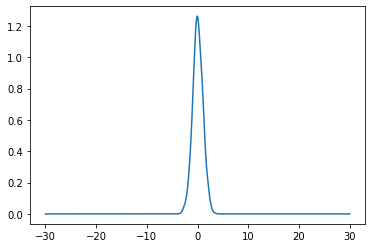

loss f 566.2981169486246


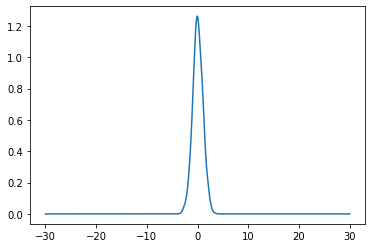

loss f 556.0734520943492


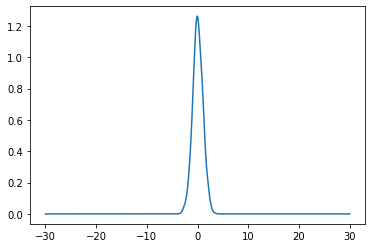

loss f 544.8948980961575


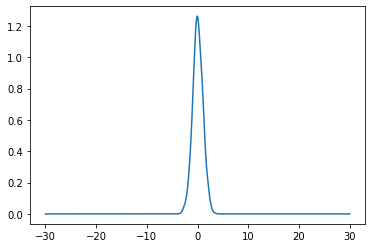

loss f 531.9108752585626


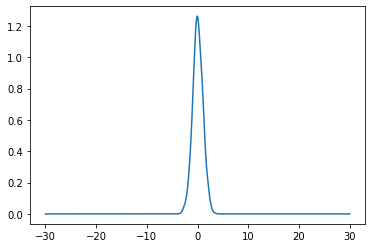

loss f 527.1257050129435


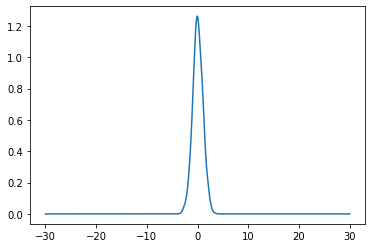

loss f 513.9348218396491


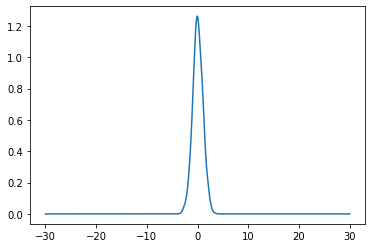

loss f 504.3408474241838


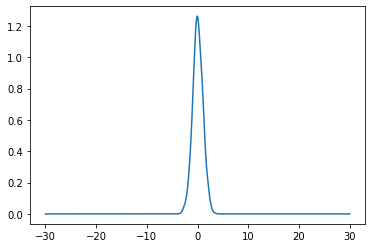

loss f 495.63185831714674


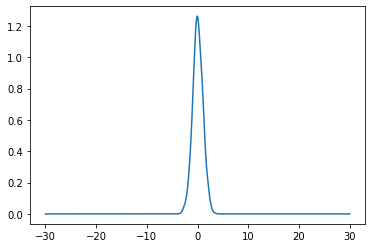

loss f 479.47594230018973


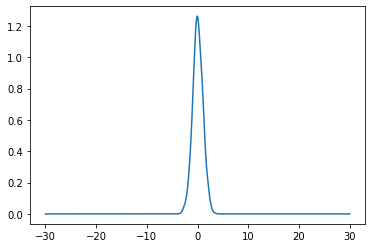

loss f 471.0355538805898


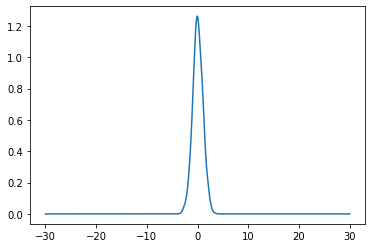

loss f 453.3512842289522


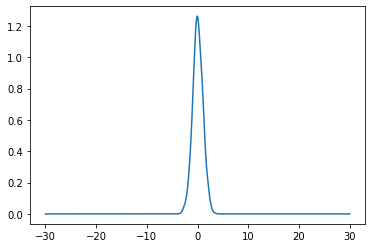

loss f 445.66920851052504


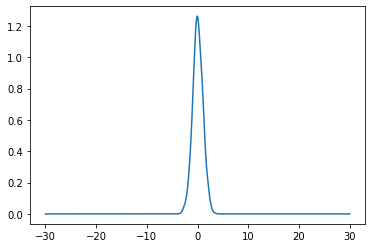

loss f 429.9437756132872


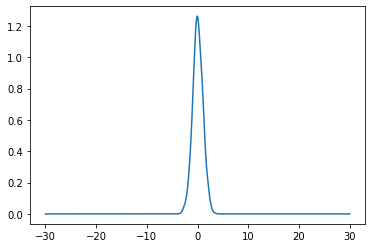

loss f 419.60209838234255


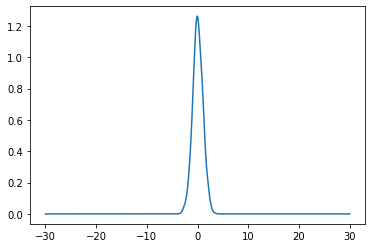

loss f 404.2339913339196


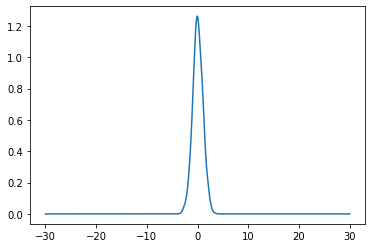

loss f 392.5883718607345


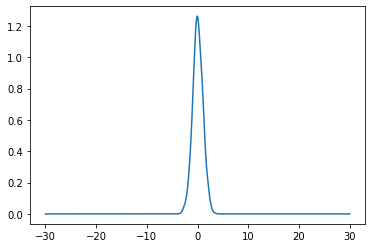

loss f 382.4971141836163


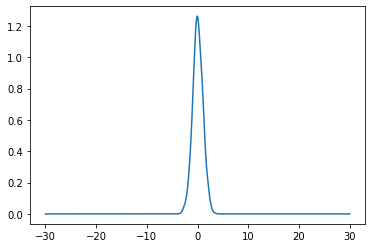

loss f 369.7442486612211


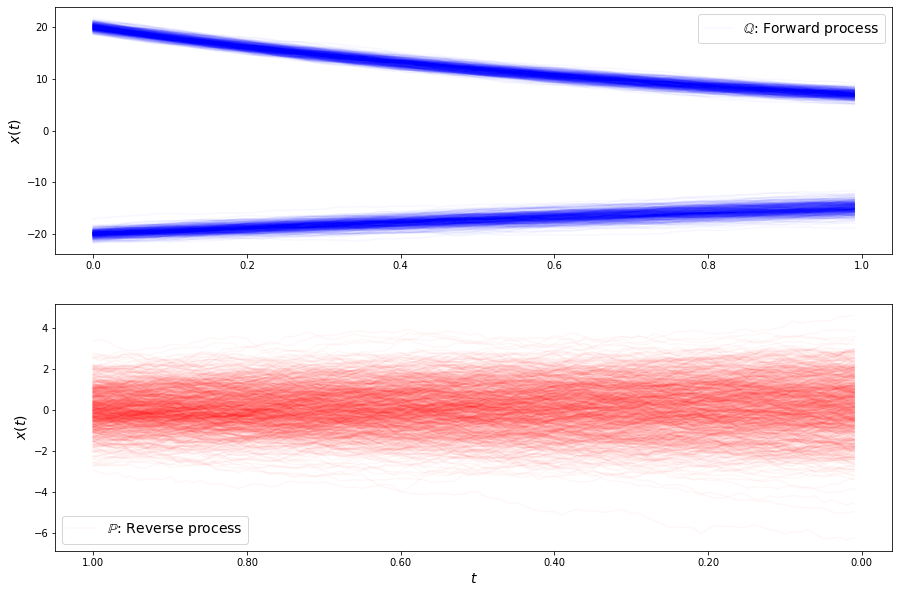

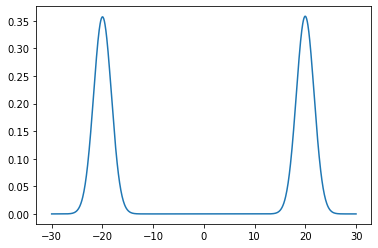

loss b 57.06128840790017


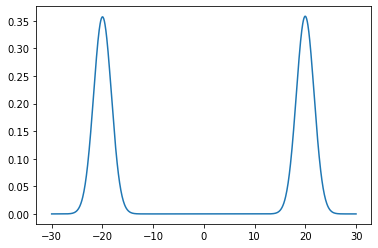

loss b 57.052052922383645


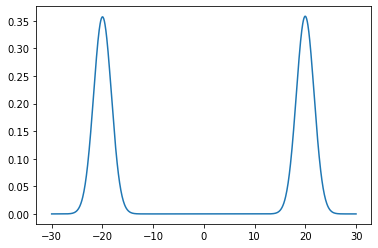

loss b 56.83418949790297


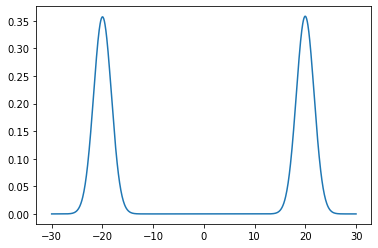

loss b 57.00930112900561


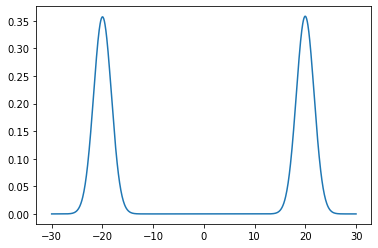

loss b 56.99957056949469


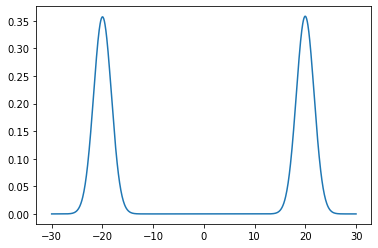

loss b 56.912167119838536


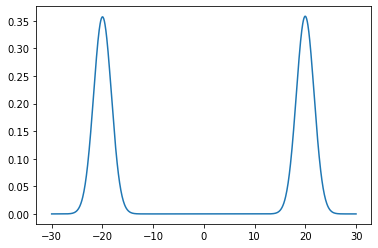

loss b 56.870213888499556


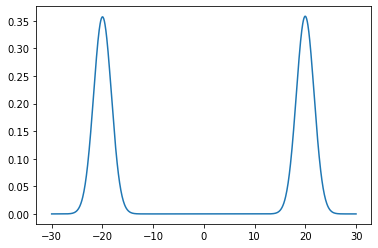

loss b 57.11190304989711


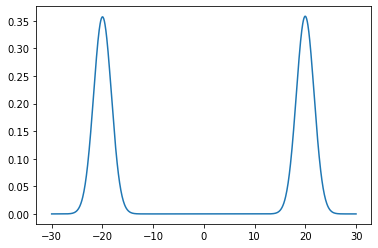

loss b 56.96404187545727


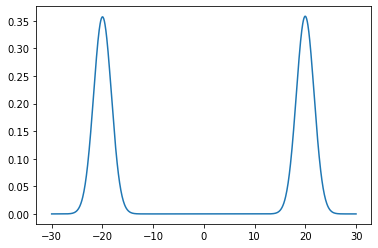

loss b 56.76215566192798


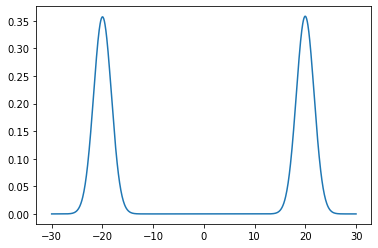

loss b 57.05523869536352


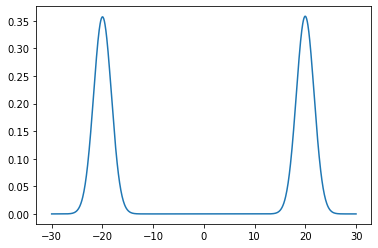

loss b 56.964281882361135


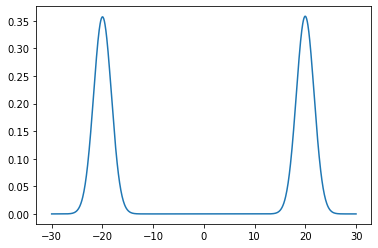

loss b 56.71767158092206


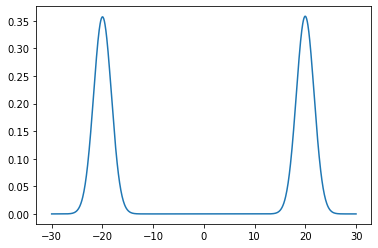

loss b 56.8834363900554


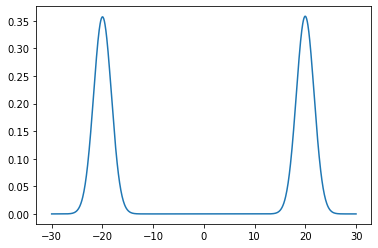

loss b 56.90078420135751


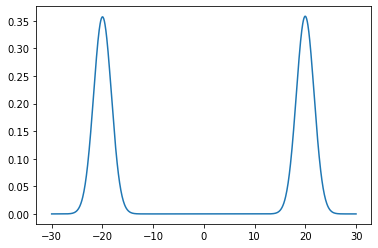

loss b 56.92925405275065


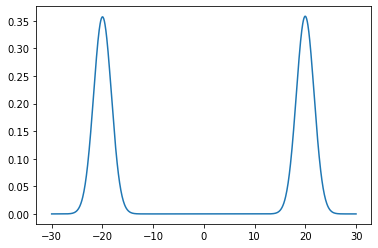

loss b 56.60980817641467


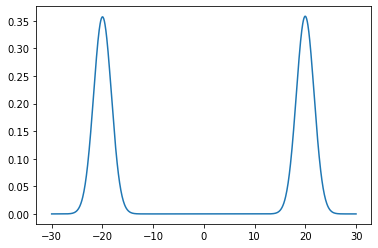

loss b 56.861695333441745


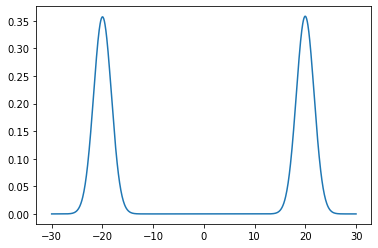

loss b 56.967234789153345


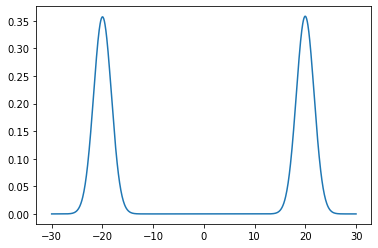

loss b 56.86470483669153


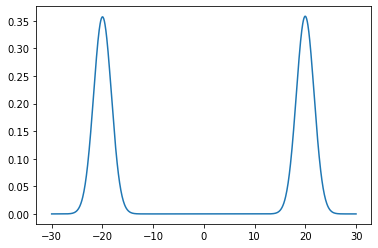

loss b 56.890286076330206


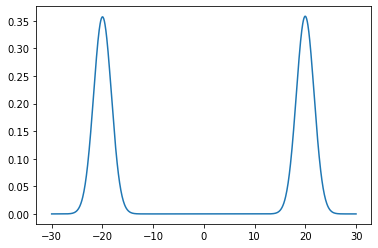

loss b 56.95891124763837


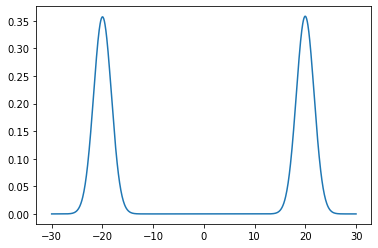

loss b 57.0103433897791


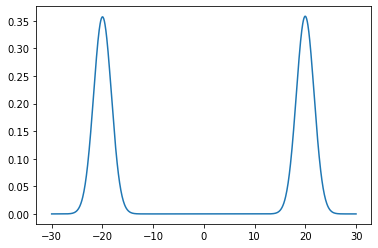

loss b 57.05276777975568


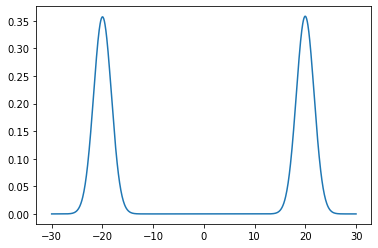

loss b 56.966449239821735


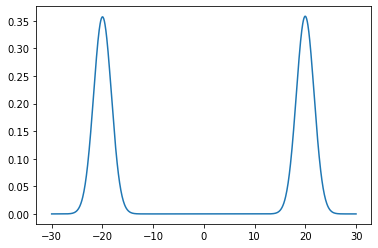

loss b 56.956961673242986


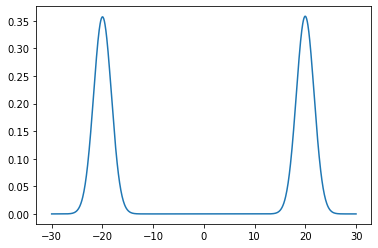

loss b 56.926213784468395


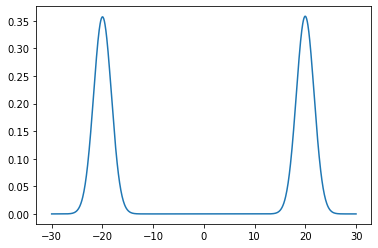

loss b 57.175695869807484


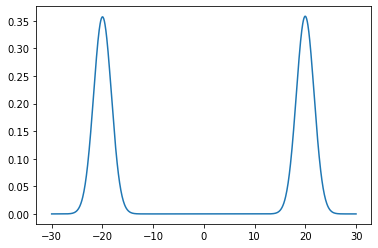

loss b 56.90577970099549


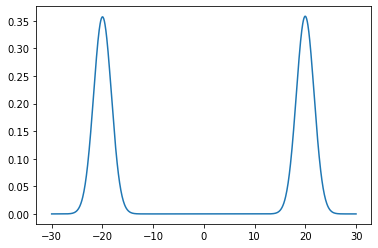

loss b 56.67766305578638


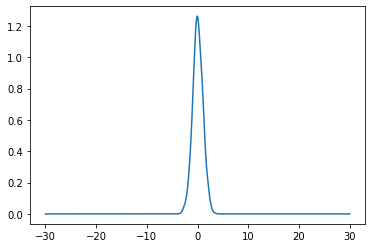

loss f 353.3681893119407


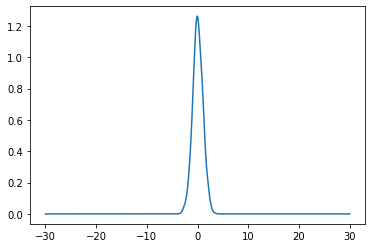

loss f 341.3834373697614


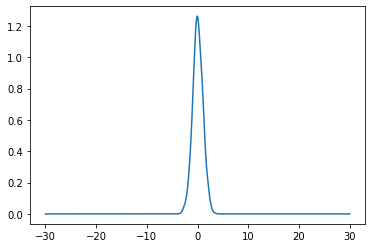

loss f 334.3378722198287


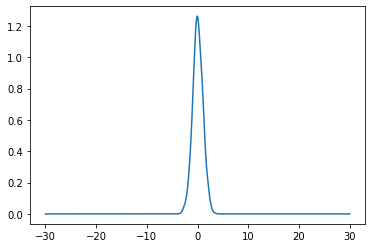

loss f 316.30761195382496


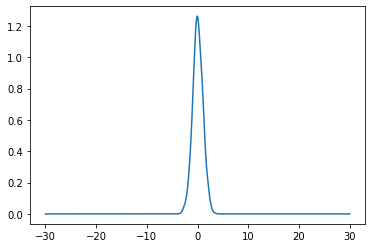

loss f 306.98822952845603


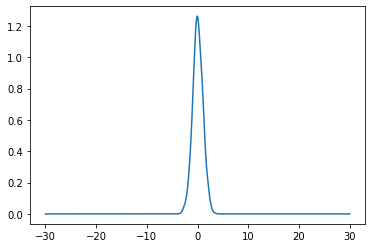

loss f 293.2335155856525


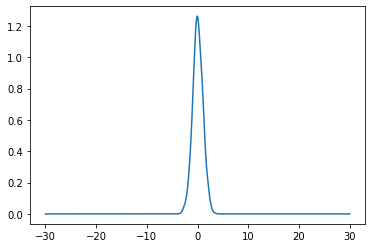

loss f 281.84416945921186


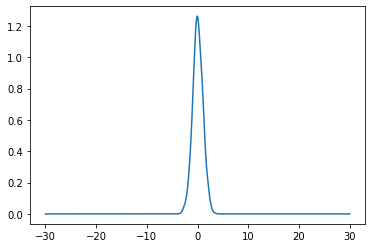

loss f 270.78047003222


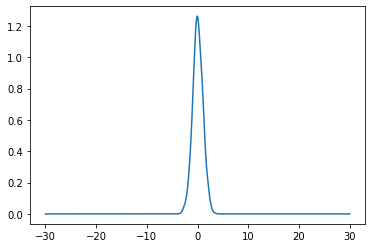

loss f 257.65181311218777


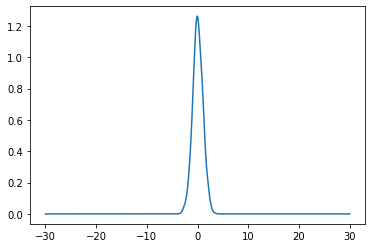

loss f 248.40784500116635


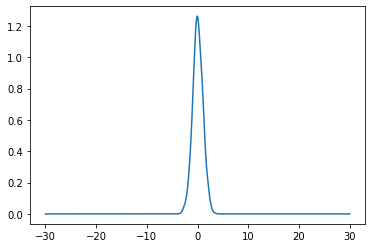

loss f 236.15921201329354


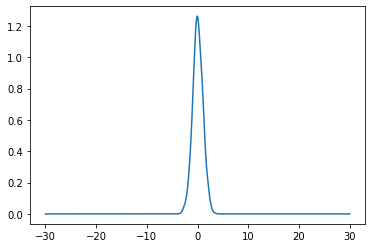

loss f 227.02466392235436


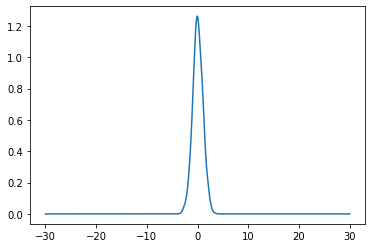

loss f 215.7913865750384


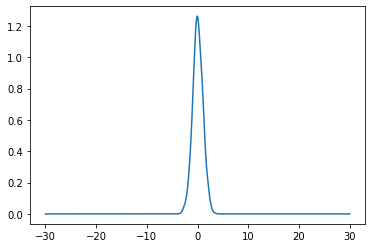

loss f 206.6430342743511


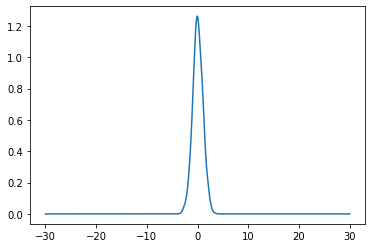

loss f 197.7121215622213


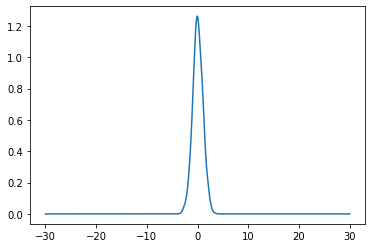

loss f 191.85202929391798


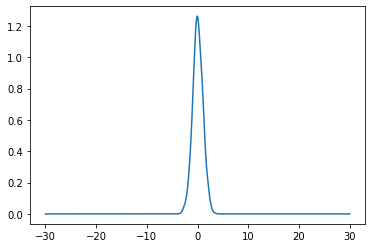

loss f 185.27372209787794


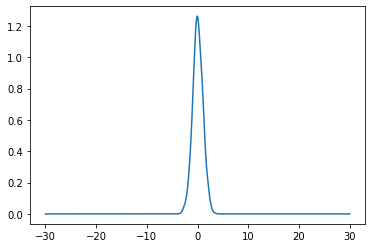

loss f 177.59512143238638


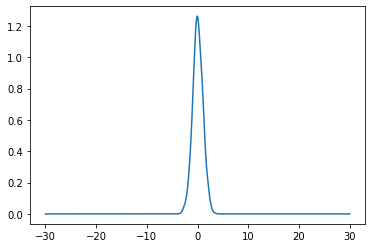

loss f 174.15851785435473


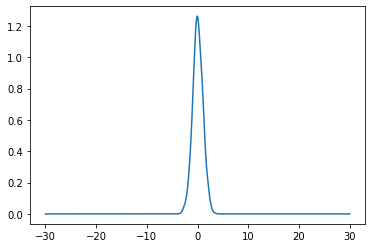

loss f 169.4892910204641


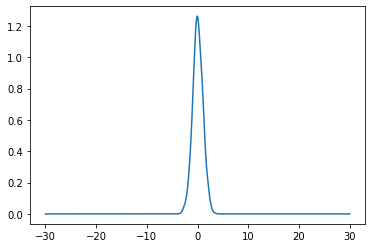

loss f 165.60746228353548


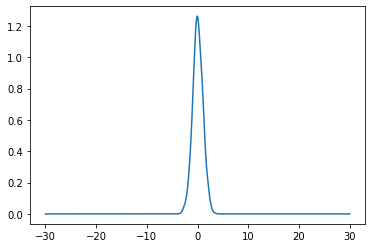

loss f 162.60167812609288


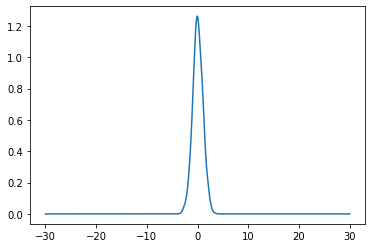

loss f 161.53667657920226


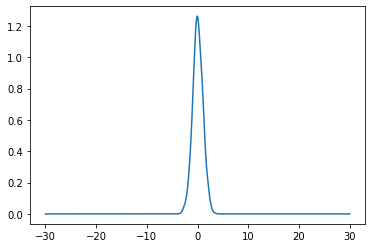

loss f 160.18472424404231


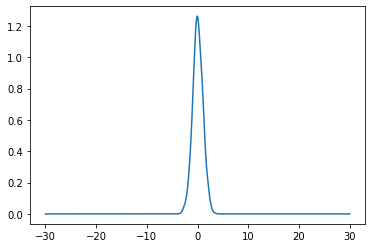

loss f 161.67969509117157


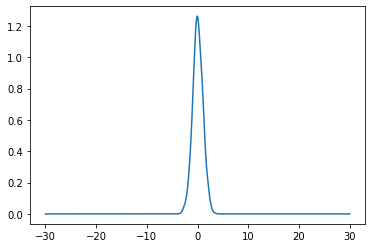

loss f 161.82009212658792


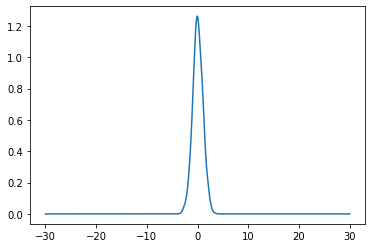

loss f 162.94862358870418


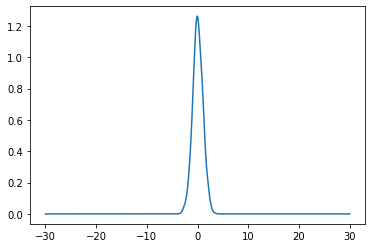

loss f 165.10914225497908


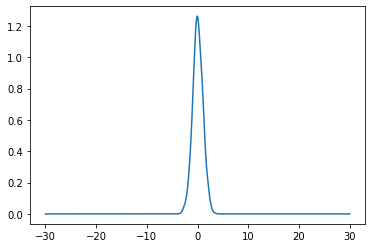

loss f 168.8870713415482


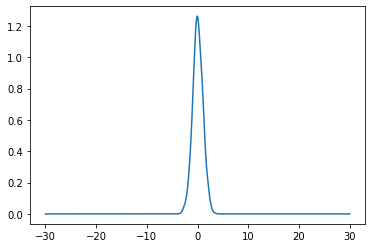

loss f 171.15583607940047


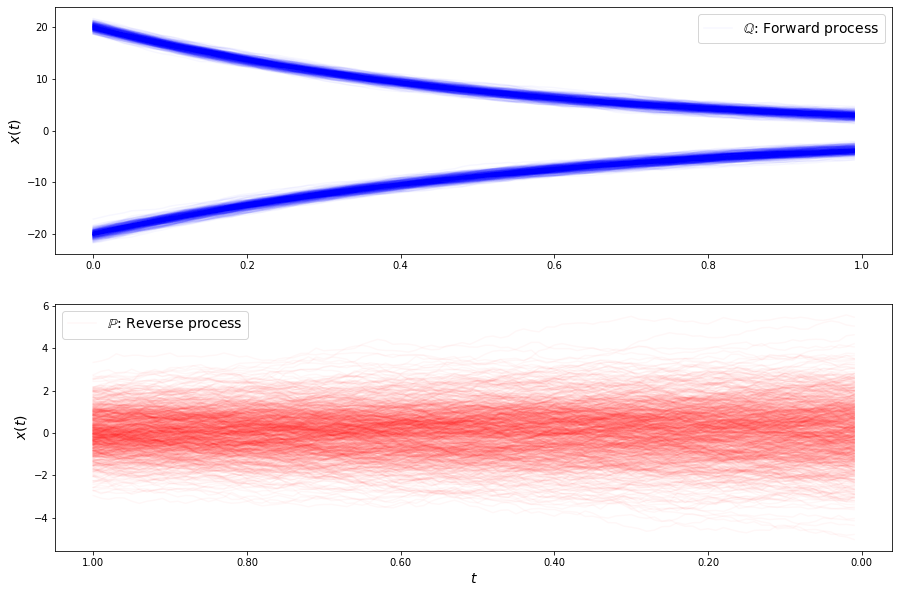

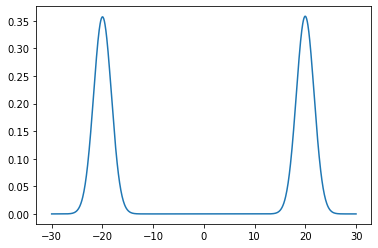

loss b 58.117656743764556


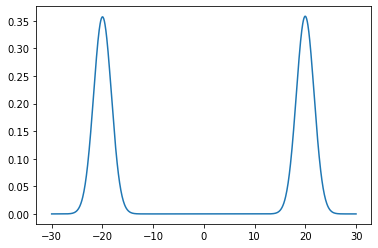

loss b 58.24987240652137


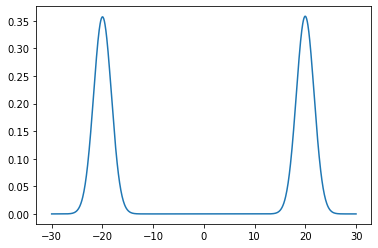

loss b 58.200319106576416


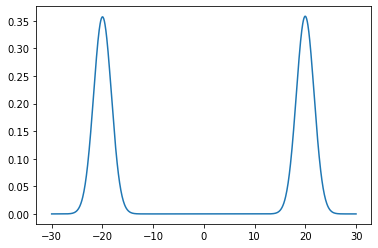

loss b 58.154954032516656


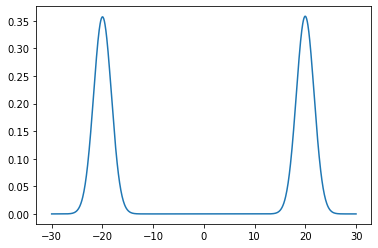

loss b 57.96373405781243


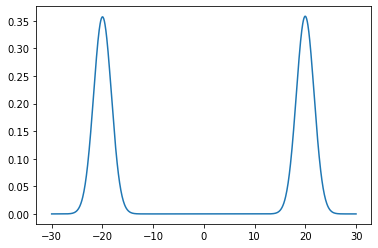

loss b 57.91416778778026


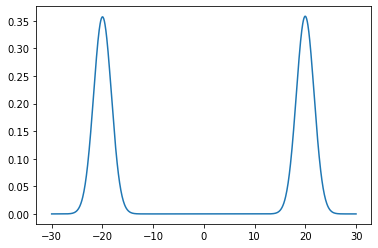

loss b 58.04689095702312


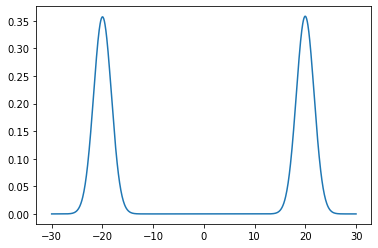

loss b 58.090202615290565


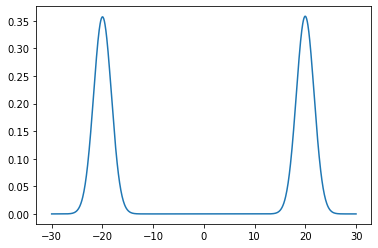

loss b 57.87378189672696


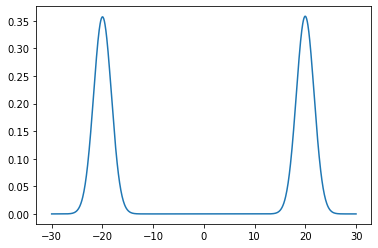

loss b 58.12811003672815


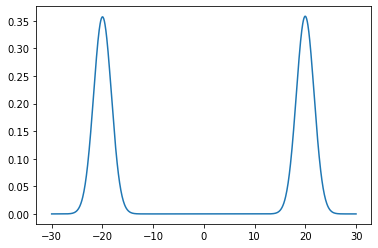

loss b 58.042280826433704


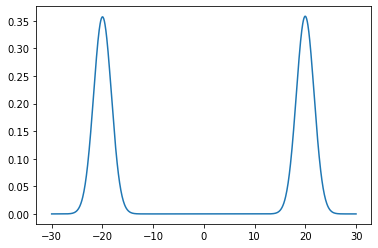

loss b 57.94057796457557


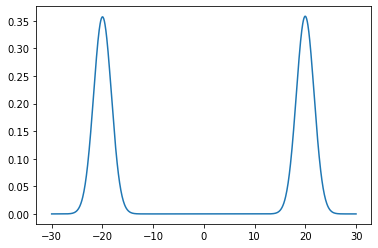

loss b 57.91785497166883


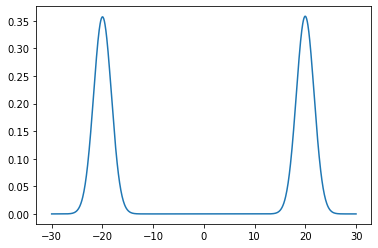

loss b 57.968500090793405


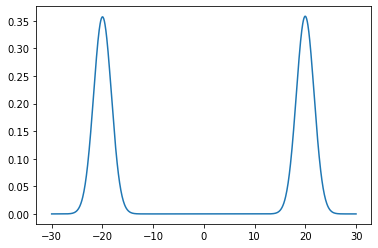

loss b 58.0670016088401


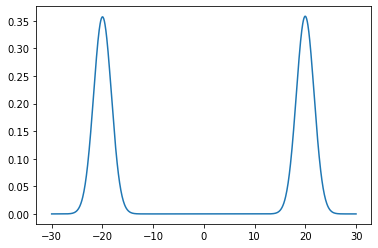

loss b 58.140902257978


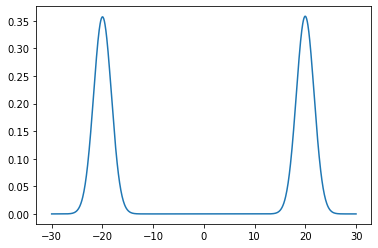

loss b 58.000270449642485


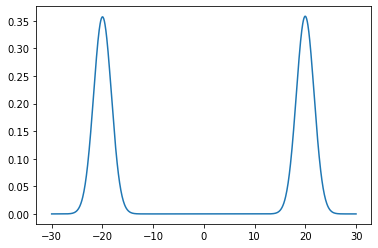

loss b 58.089933576925354


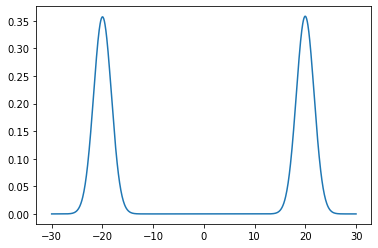

loss b 57.91836057209201


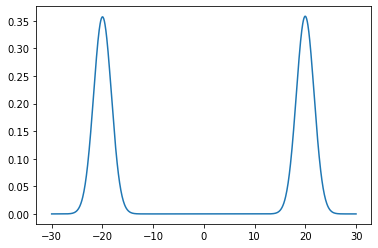

loss b 58.06327391145049


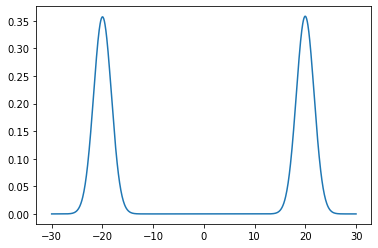

loss b 58.02239118258087


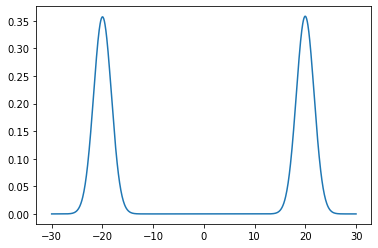

loss b 57.95018820589177


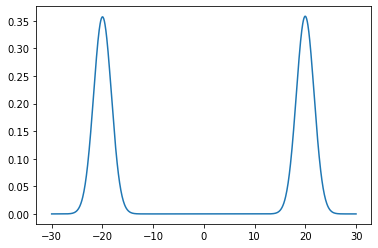

loss b 58.07110497883451


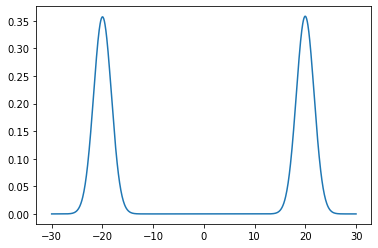

loss b 57.68425373472451


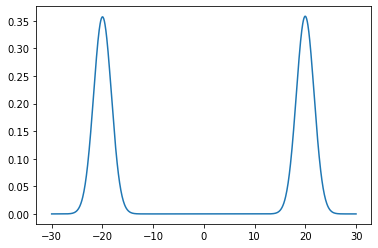

loss b 57.9546985742487


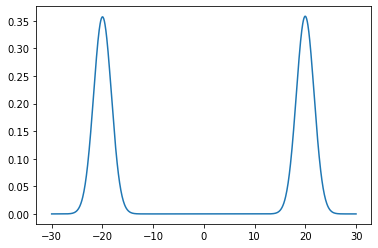

loss b 57.94735977741433


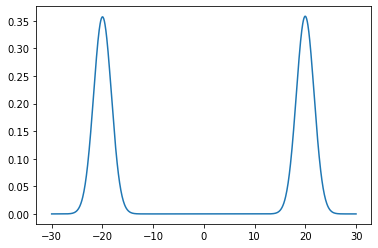

loss b 57.98251795292699


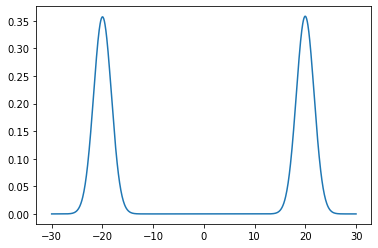

loss b 57.85627795430007


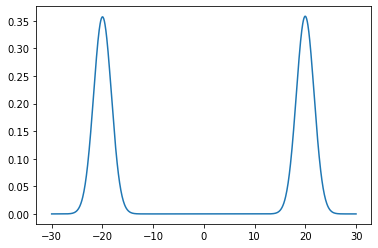

loss b 57.79554940246328


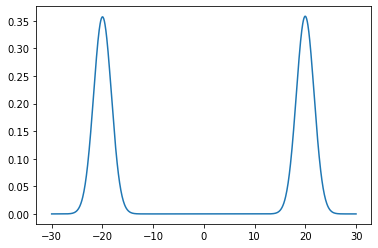

loss b 57.99454603500872


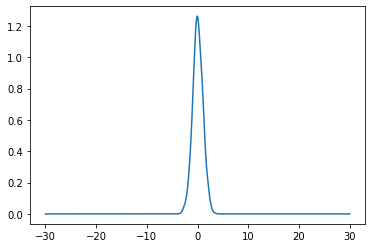

loss f 163.01272491955456


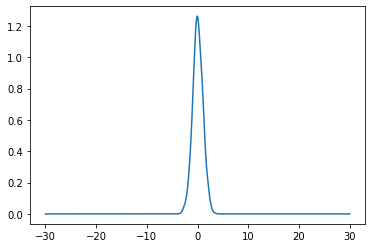

loss f 167.3127661081956


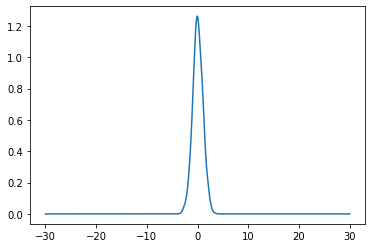

loss f 171.84869846918784


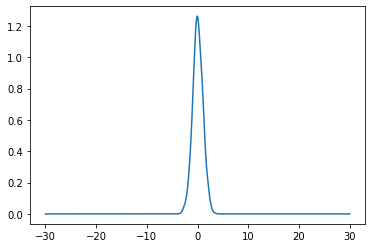

loss f 176.566610646406


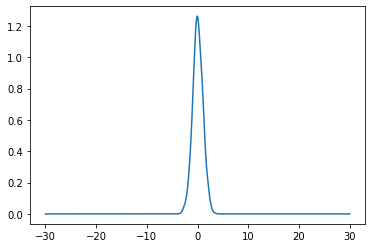

loss f 181.70629277417032


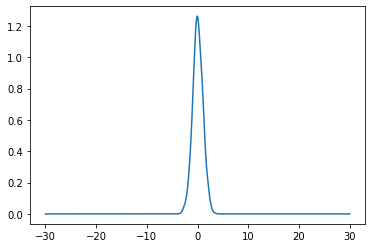

loss f 187.1894777240247


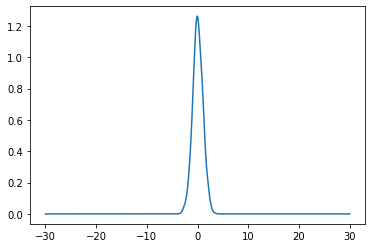

loss f 192.3296558810849


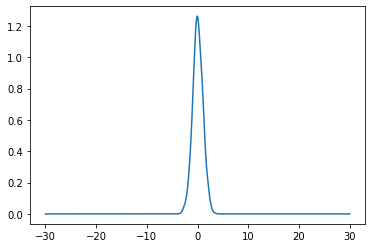

loss f 197.64963232516877


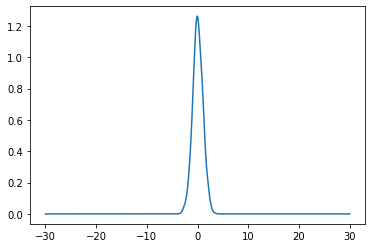

loss f 203.37474503637756


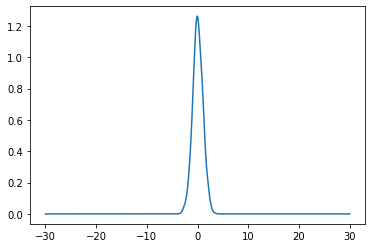

loss f 207.9223042614801


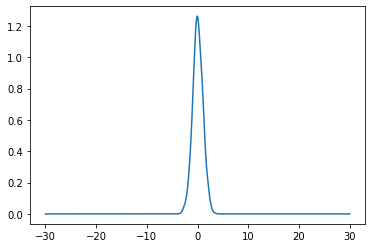

loss f 213.16350397763276


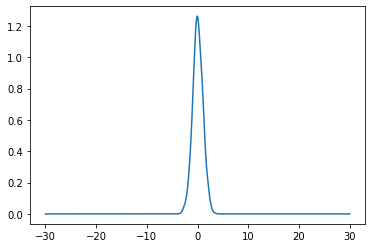

loss f 219.43367469448415


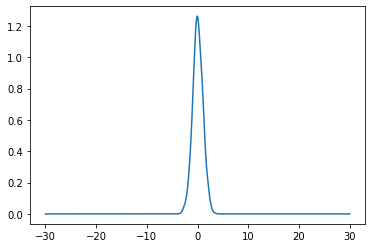

loss f 224.90540873192688


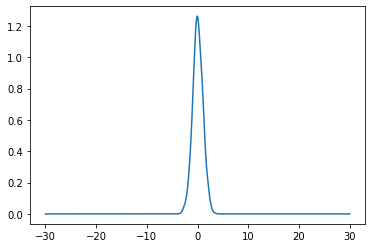

loss f 229.6434947944443


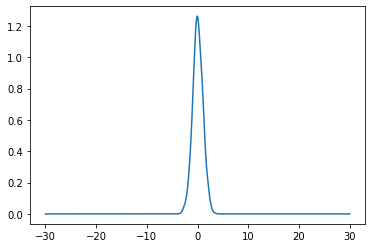

loss f 235.60577032645864


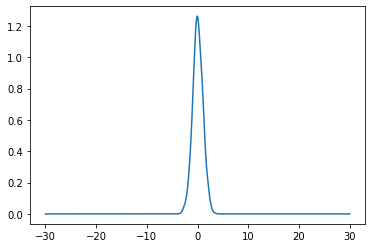

loss f 240.62083298248712


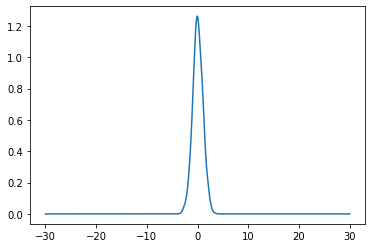

loss f 246.03202053528688


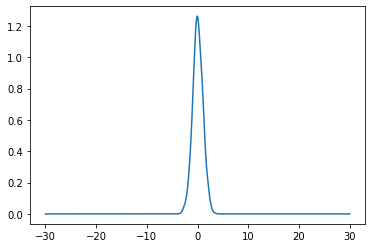

loss f 252.22987588457175


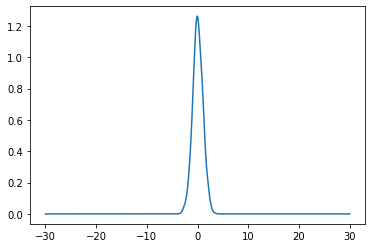

loss f 257.26749096789877


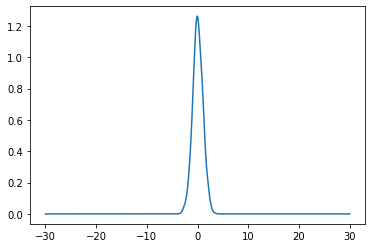

loss f 263.1212402515206


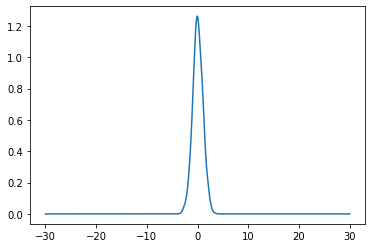

loss f 268.8497933455422


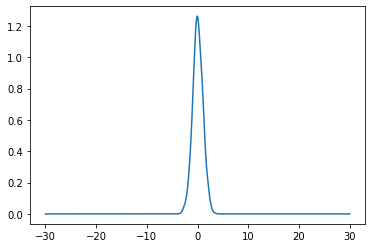

loss f 274.01441363747466


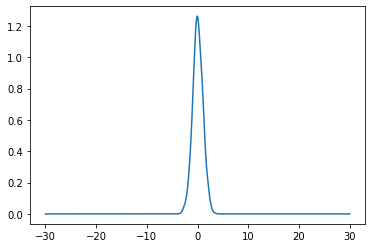

loss f 279.56112836626556


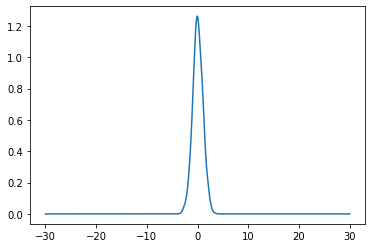

loss f 284.9363346621925


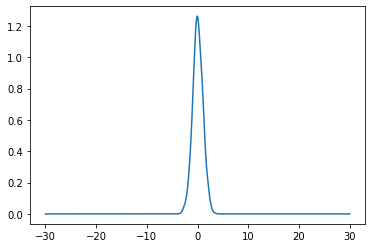

loss f 290.2283886881574


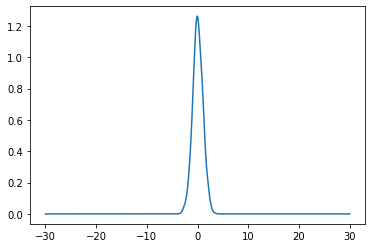

loss f 295.4139732871039


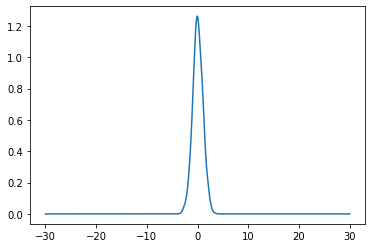

loss f 300.06333008613746


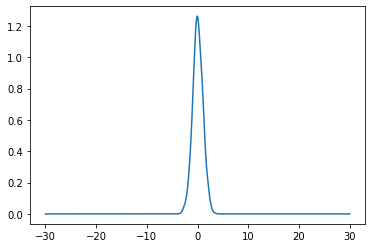

loss f 305.365764659939


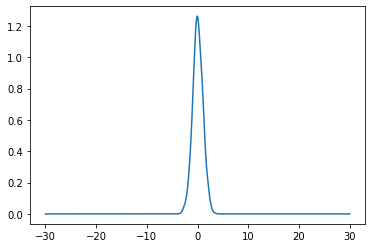

loss f 310.3197813693062


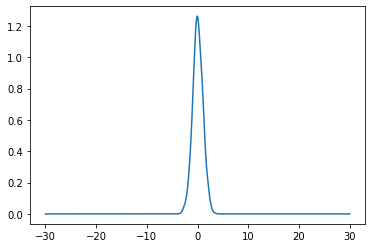

loss f 315.33285087670157


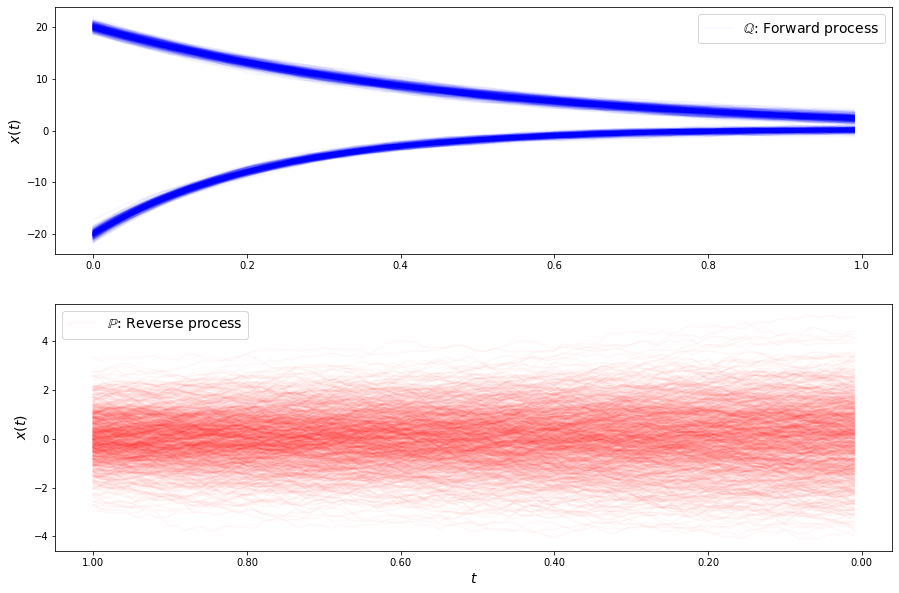

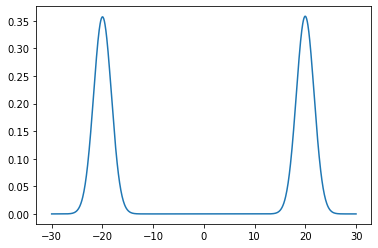

loss b 65.83290214874386


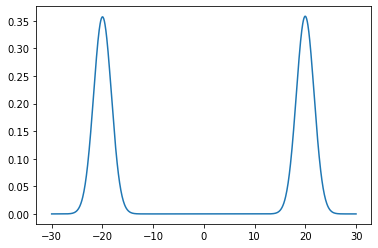

loss b 65.93188949516818


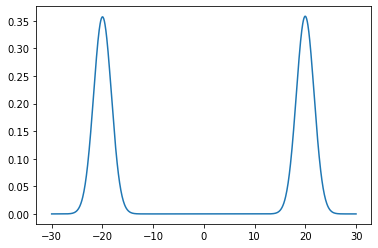

loss b 65.76717727600854


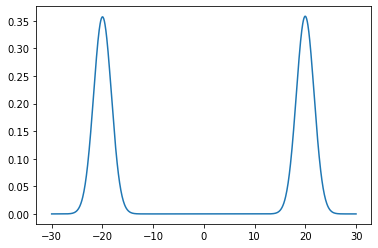

loss b 66.03277269309015


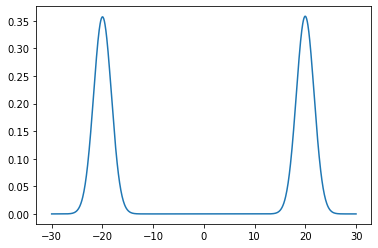

loss b 65.9477029761931


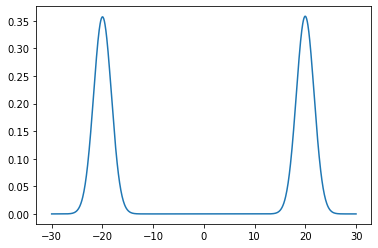

loss b 65.76988369263837


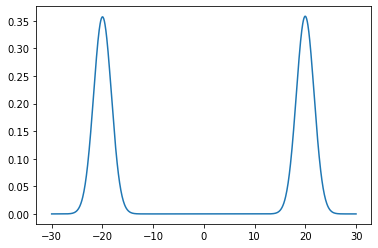

loss b 66.06988157259508


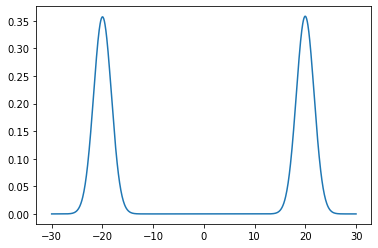

loss b 65.53064972621712


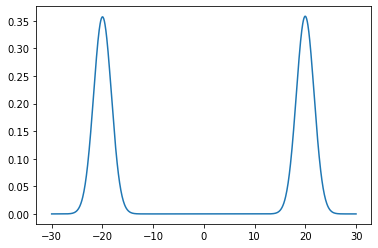

loss b 65.77729326651243


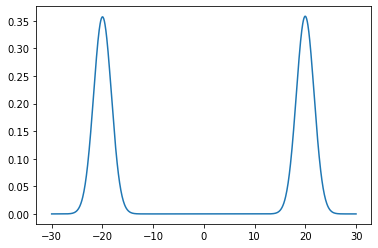

loss b 66.10250611677505


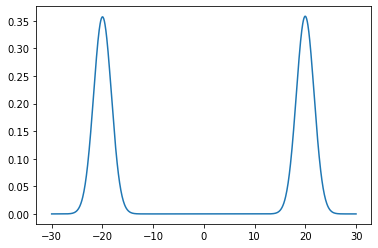

loss b 66.07304079807685


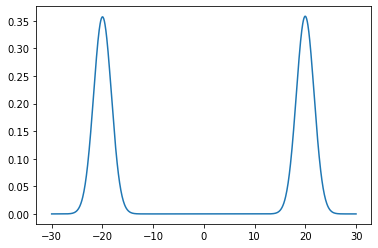

loss b 65.51198430460212


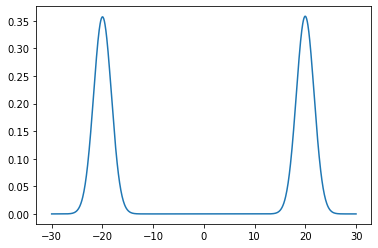

loss b 65.9722328100898


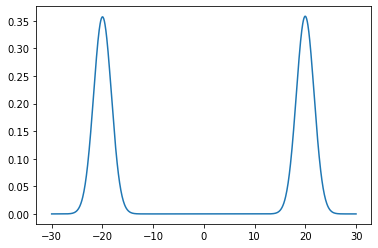

loss b 65.7127537096716


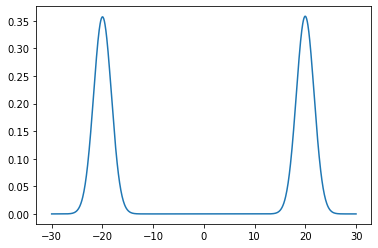

loss b 65.948192850182


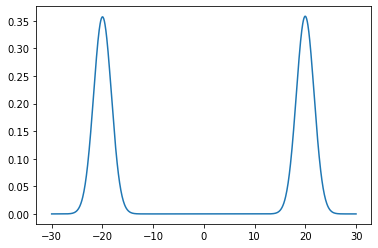

loss b 66.3873841457671


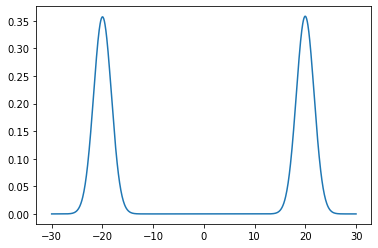

loss b 66.07949061548337


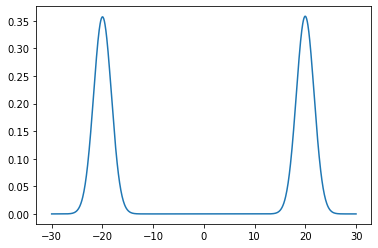

loss b 66.02985157955486


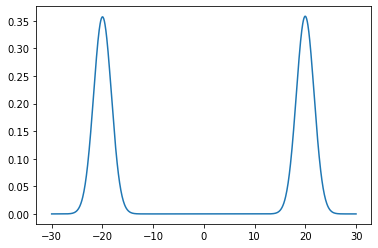

loss b 66.28626361027399


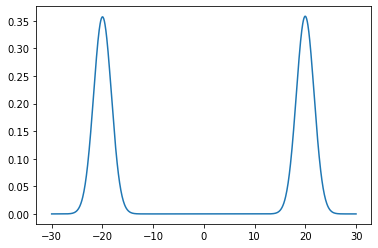

loss b 65.69562269252054


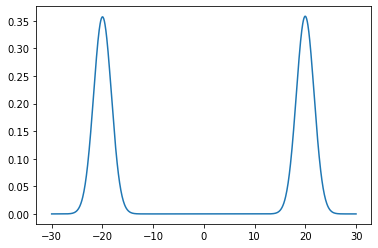

loss b 66.30946200029906


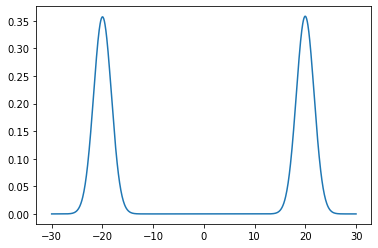

loss b 65.85070682216043


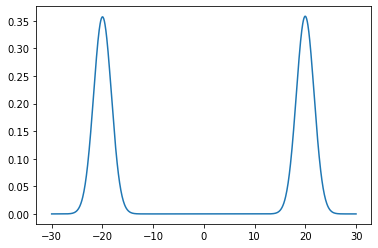

loss b 65.86413361214134


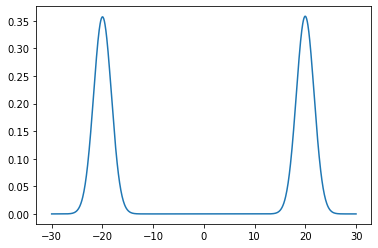

loss b 65.7294295422635


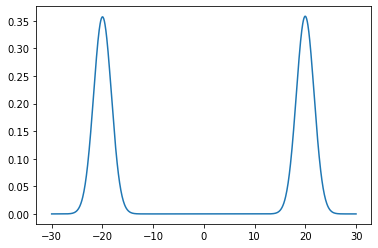

loss b 65.71112307140137


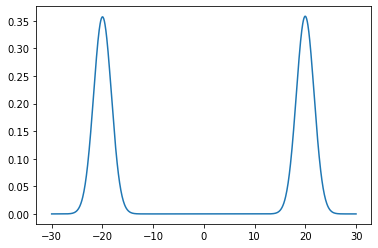

loss b 66.53033188445268


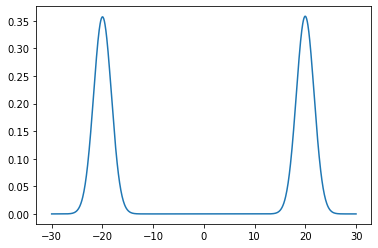

loss b 66.18054356177319


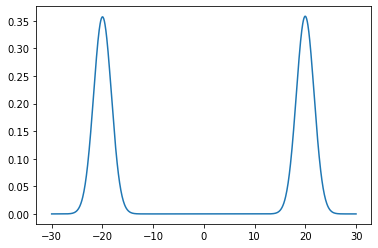

loss b 65.8656114275265


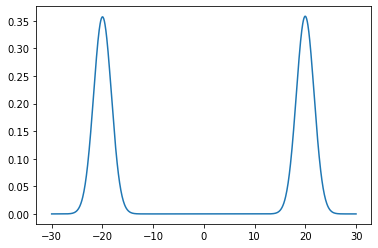

loss b 65.88511478545527


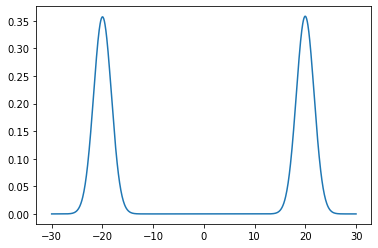

loss b 65.85815092828881


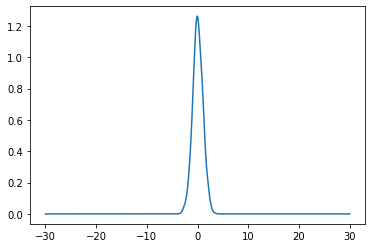

loss f 301.93996807093896


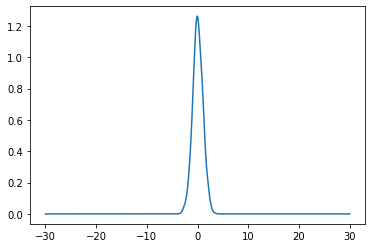

loss f 306.8229726980687


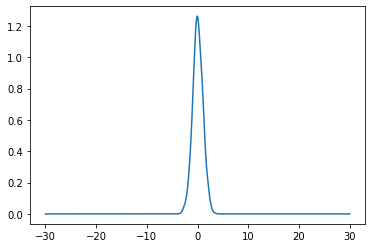

loss f 310.760550112141


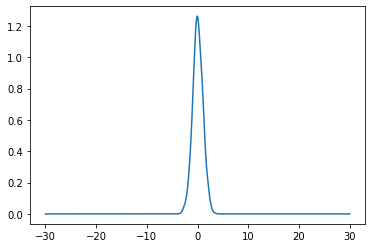

loss f 315.6696022395692


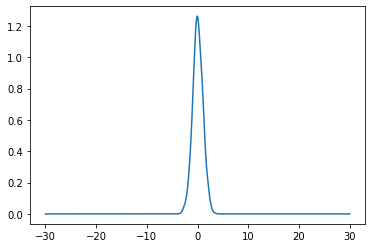

loss f 319.99642129744046


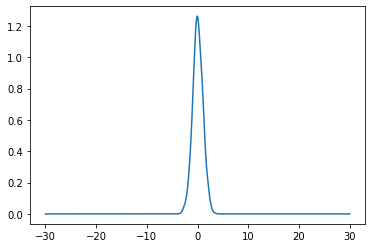

loss f 323.519322806199


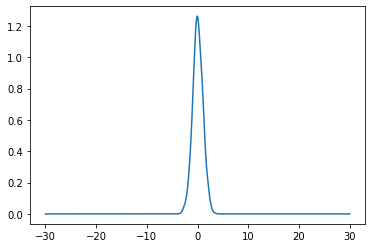

loss f 326.88795238786537


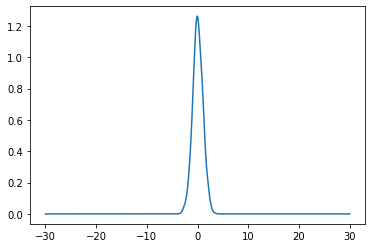

loss f 331.22744747442914


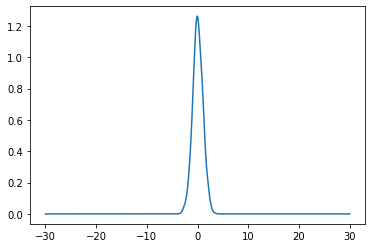

loss f 334.30066843365586


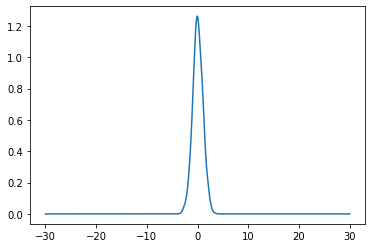

loss f 337.91503408904896


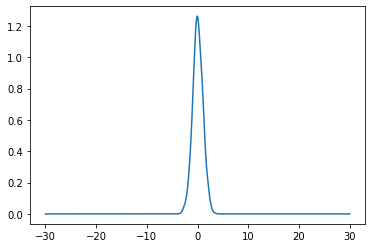

loss f 340.7281904489707


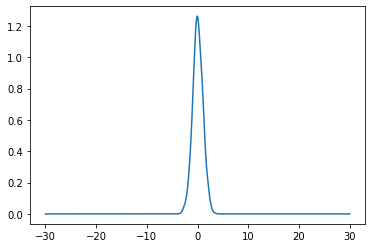

loss f 344.19537755291793


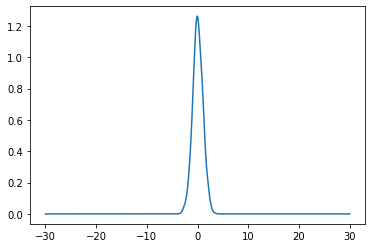

loss f 346.6781778831337


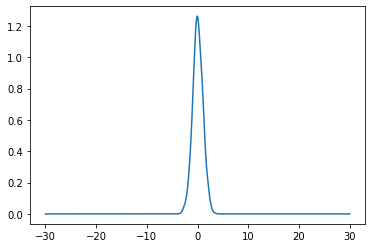

loss f 349.5110669402606


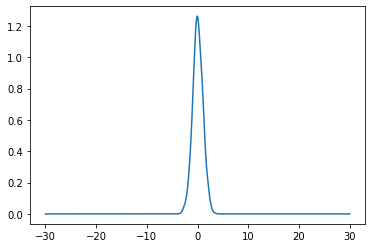

loss f 352.1254596454402


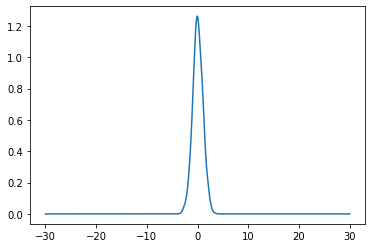

loss f 354.5864943348018


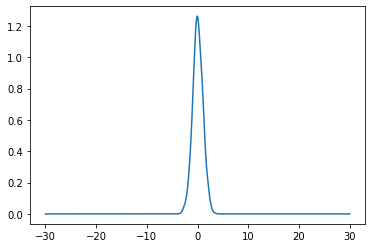

loss f 356.8567025092115


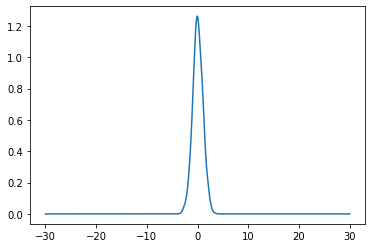

loss f 357.97917105600663


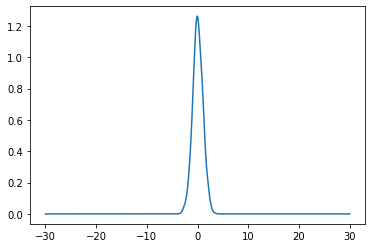

loss f 360.43504253949845


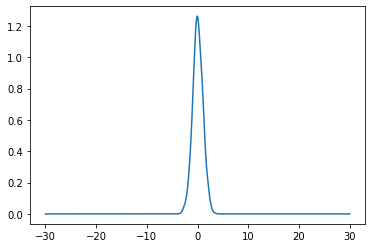

loss f 361.92058945905256


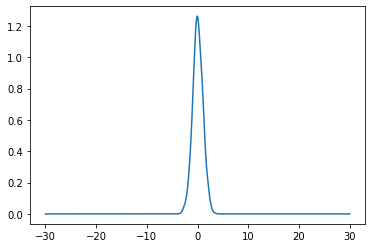

loss f 364.7136991515292


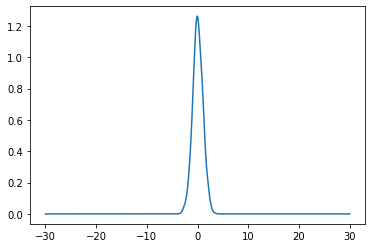

loss f 365.28150267500723


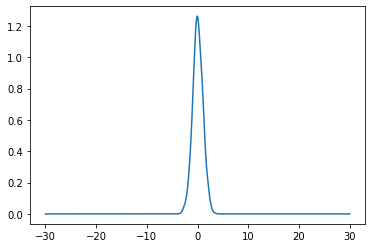

loss f 366.1796588751262


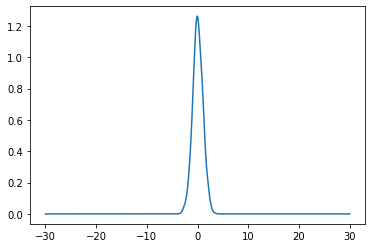

loss f 367.57187667418316


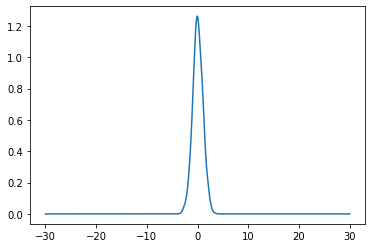

loss f 367.8321976485167


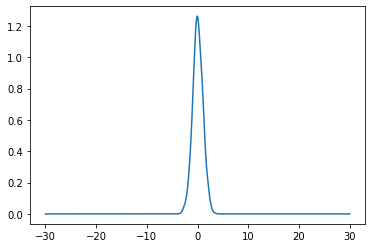

loss f 369.7729184615335


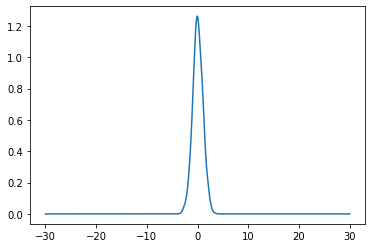

loss f 370.61886389620844


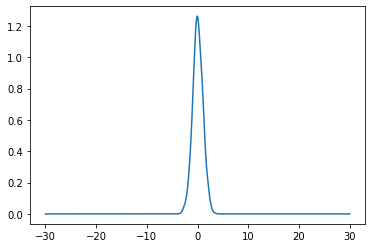

loss f 372.7450750362506


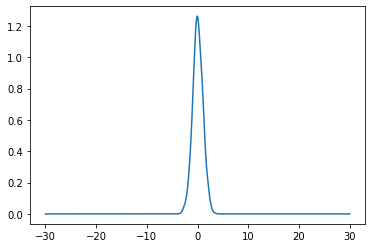

loss f 372.75383427067925


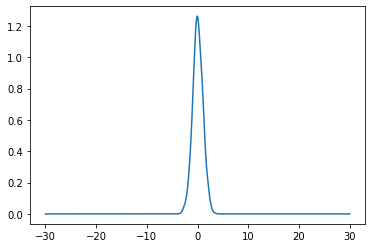

loss f 374.9019288060538


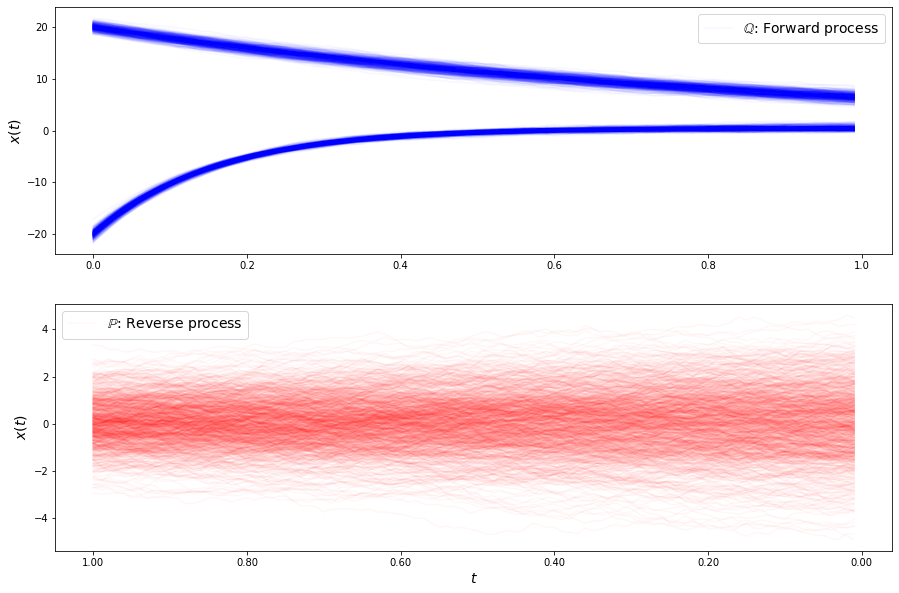

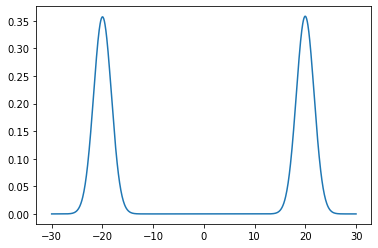

loss b 76.7908996256909


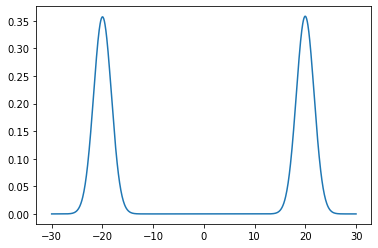

loss b 77.33149672494491


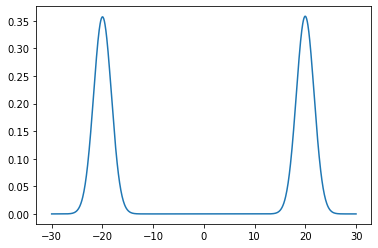

loss b 76.2928731593771


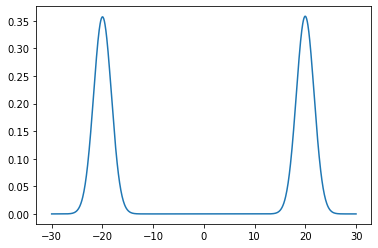

loss b 76.21555968972727


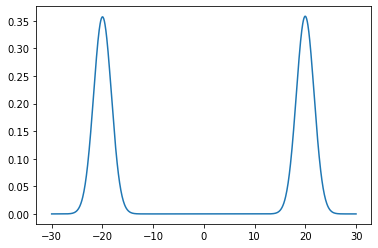

loss b 77.29954874706155


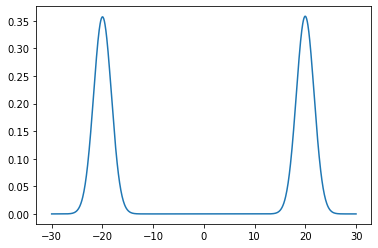

loss b 76.95639554361249


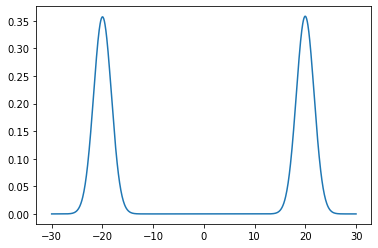

loss b 76.85016375736552


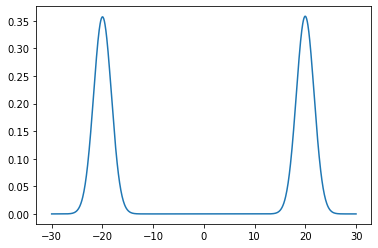

loss b 77.00811085903679


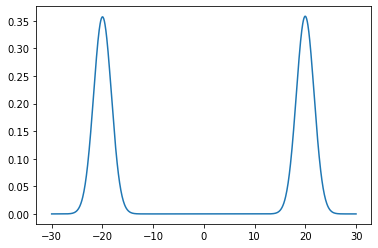

loss b 76.30181555912672


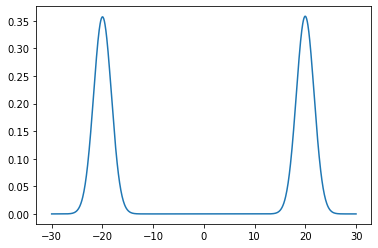

loss b 76.8098653193232


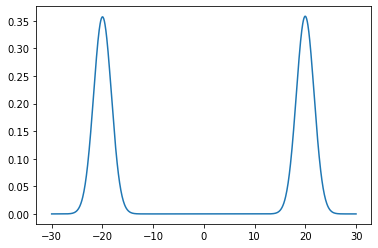

loss b 78.57881668089345


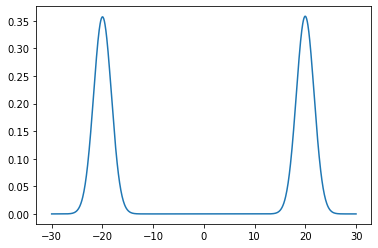

loss b 77.69175323502304


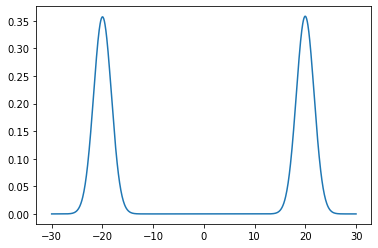

loss b 77.61676836128417


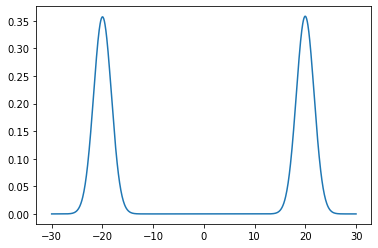

loss b 76.50755500533556


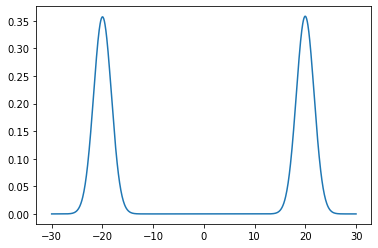

loss b 76.7350104188395


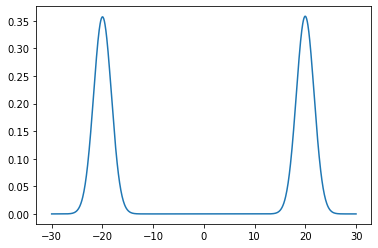

loss b 76.27355139556843


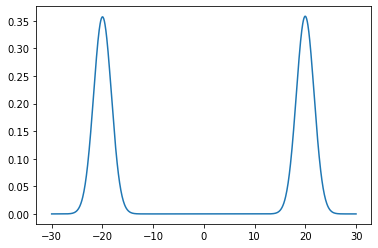

loss b 77.49281110504096


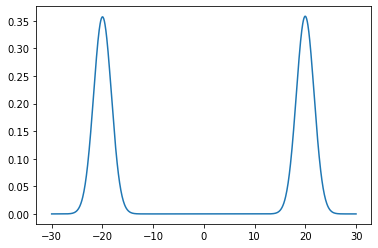

loss b 76.68518334699799


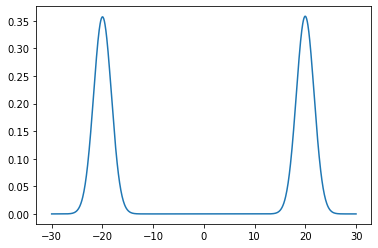

loss b 76.97261922120745


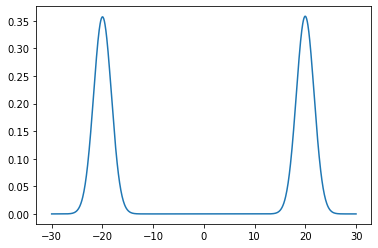

loss b 77.71050331785021


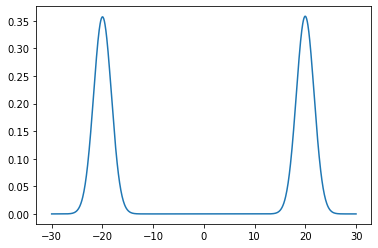

loss b 76.35243003187284


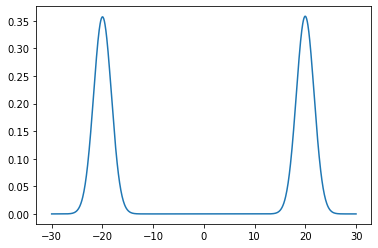

loss b 76.27085925675517


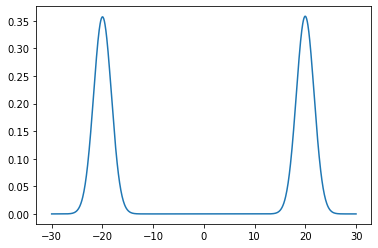

loss b 76.73996813003254


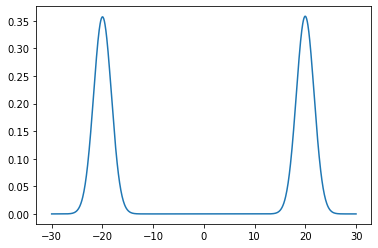

loss b 76.36871424791535


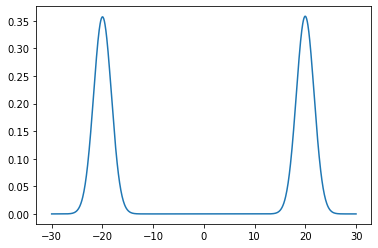

loss b 77.05760464354807


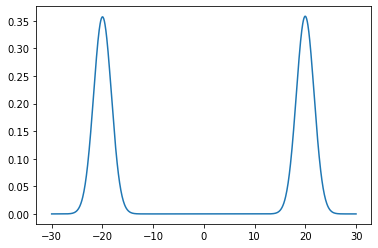

loss b 77.04127564961536


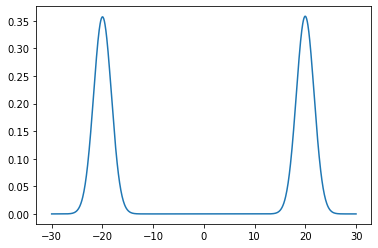

loss b 77.86892375260749


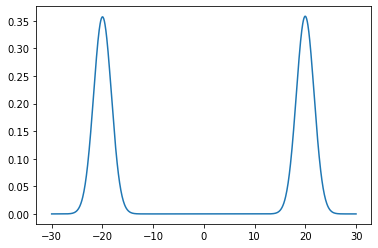

loss b 77.2415567629563


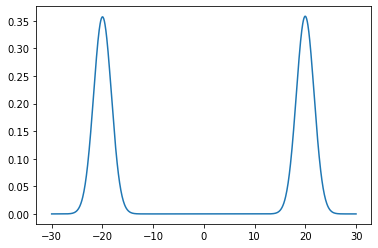

loss b 78.27143930367771


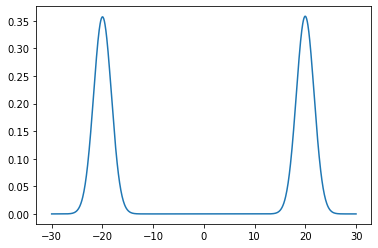

loss b 77.77259576820433


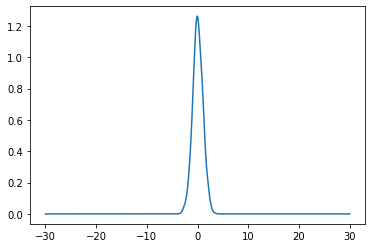

loss f 356.1345416678184


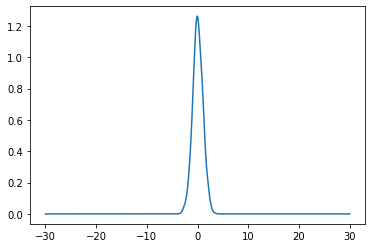

loss f 358.3316008167764


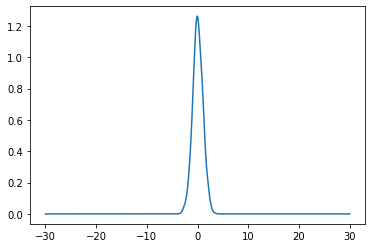

loss f 358.3720654390019


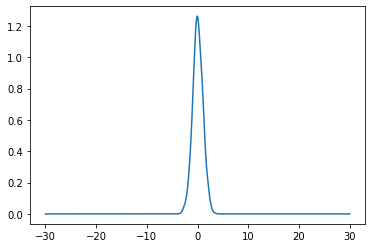

loss f 360.7154006722206


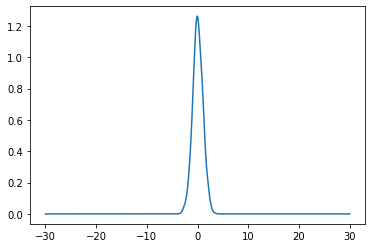

loss f 361.29592455473306


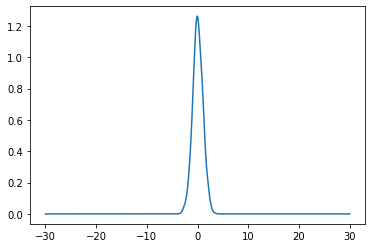

loss f 363.0583804912685


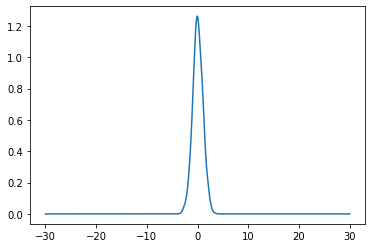

loss f 365.1694183095182


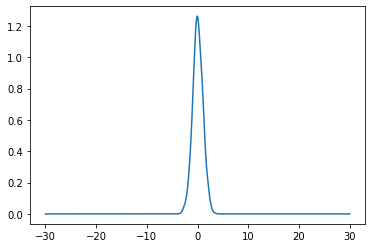

loss f 366.00194310309047


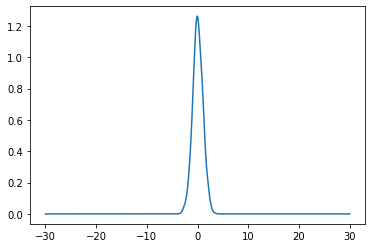

loss f 365.5773193043744


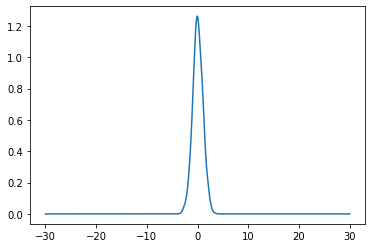

loss f 368.45657990821184


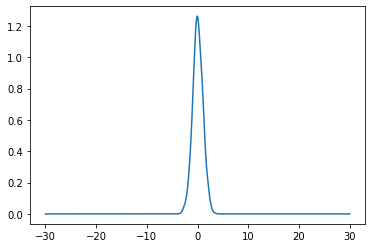

loss f 370.3542045631352


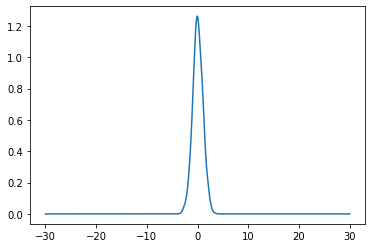

loss f 369.6481823116504


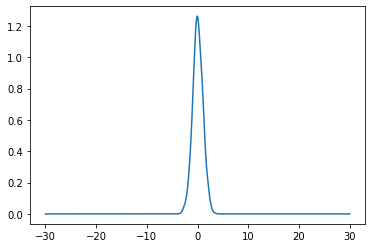

loss f 366.9864629006928


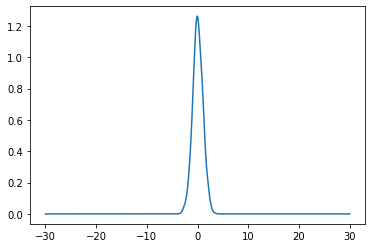

loss f 366.0022799385237


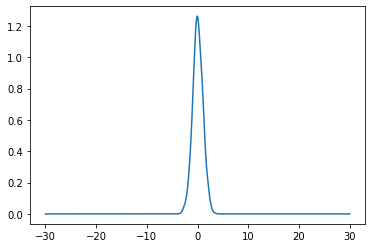

loss f 360.7638682192492


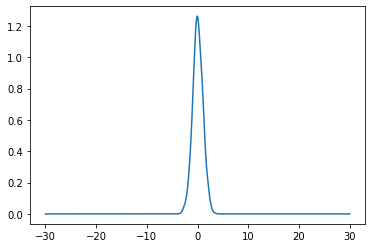

loss f 357.2787843060262


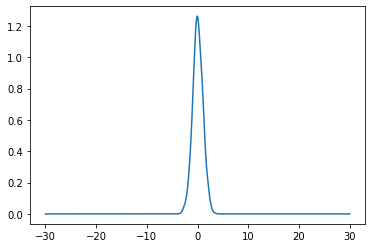

loss f 350.0751907967058


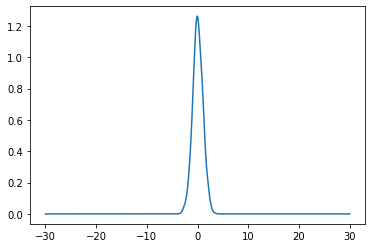

loss f 341.2432782275322


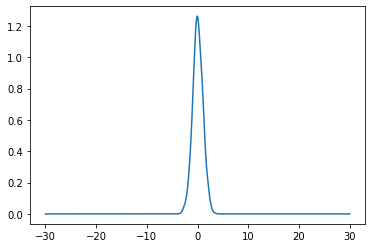

loss f 331.54006818643904


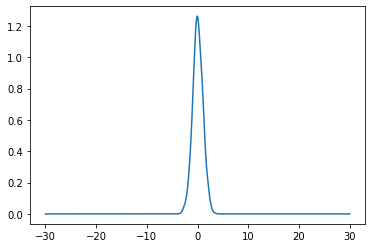

loss f 321.39077588166094


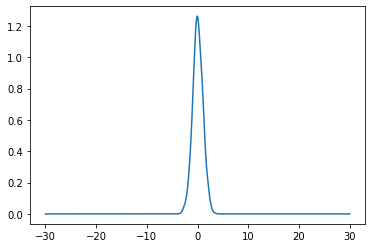

loss f 314.02430702425227


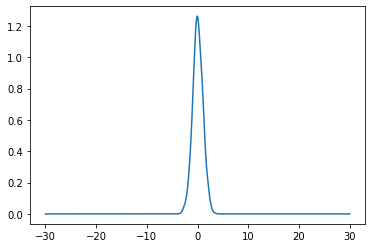

loss f 305.1921558274741


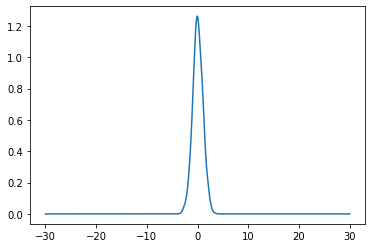

loss f 296.48793103096017


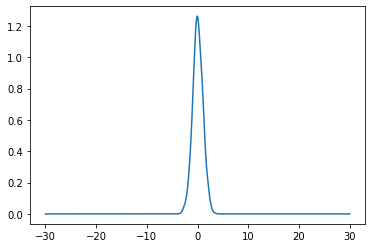

loss f 289.3176499584676


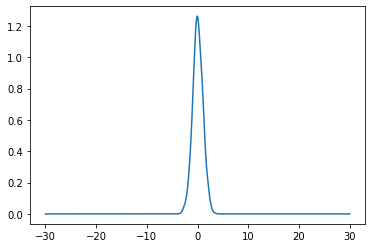

loss f 281.13368103899387


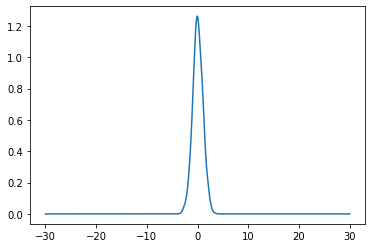

loss f 271.5031147114032


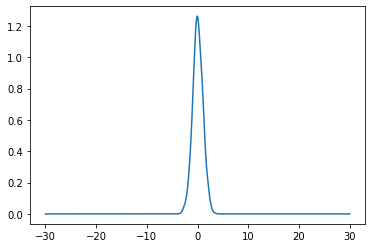

loss f 264.0045884649413


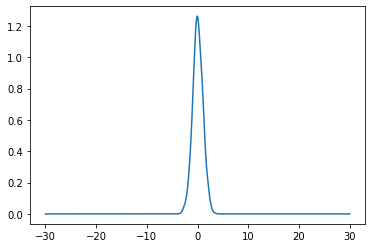

loss f 257.0400503838899


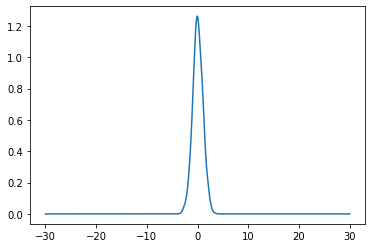

loss f 251.5595222816821


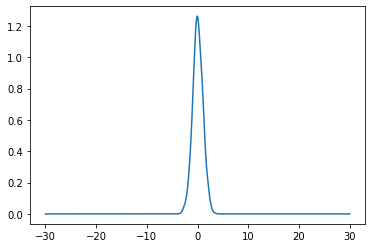

loss f 244.8503304570371


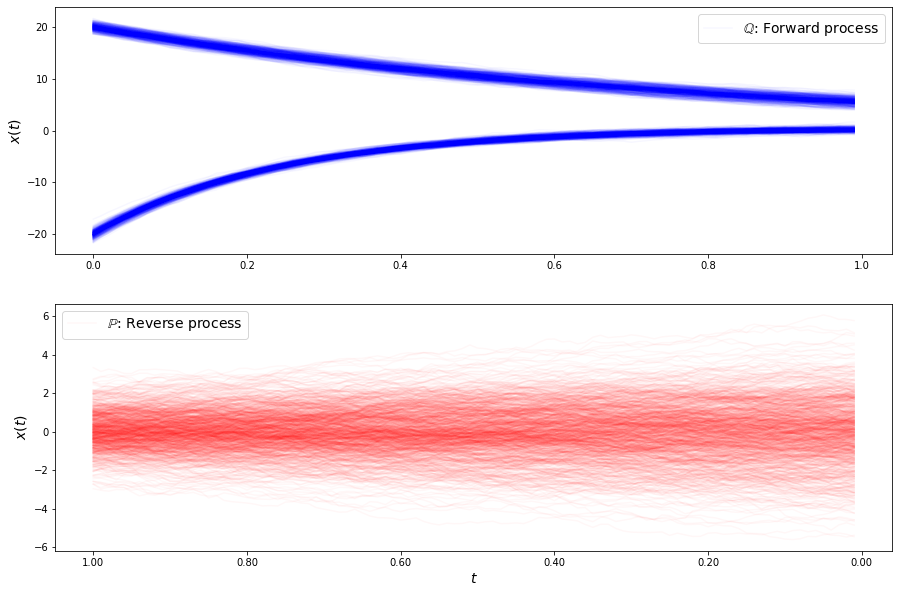

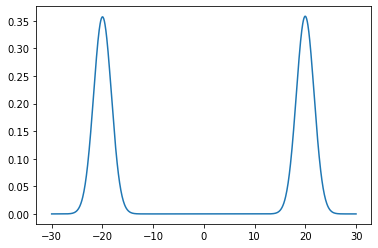

loss b 64.94804277457985


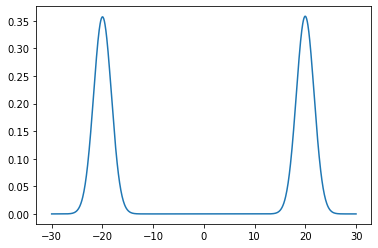

loss b 64.57600037837574


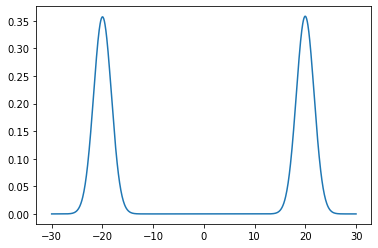

loss b 65.12587693797511


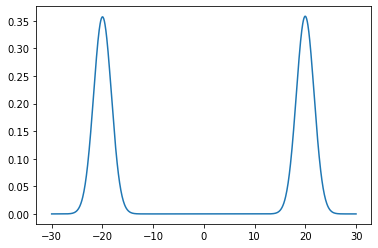

loss b 65.181456858666


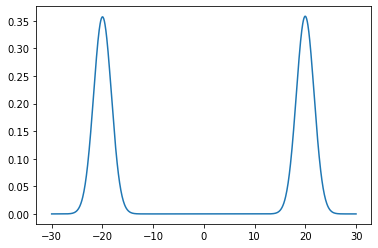

loss b 64.57927015289519


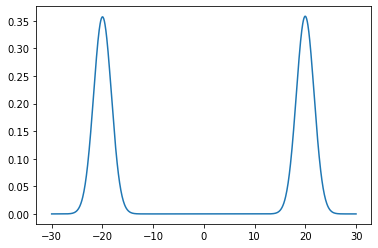

loss b 64.65666258433781


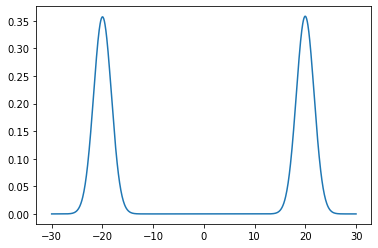

loss b 64.73818729846671


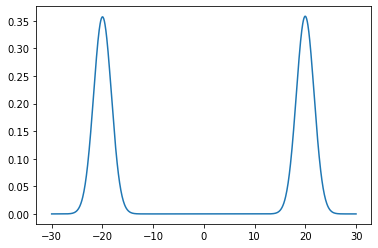

loss b 64.6009209529625


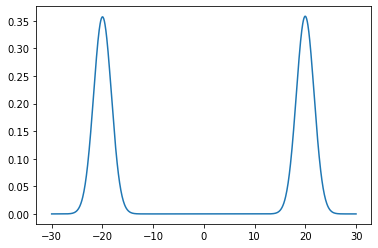

loss b 64.92881686674531


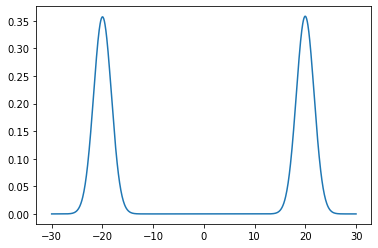

loss b 65.13058831297911


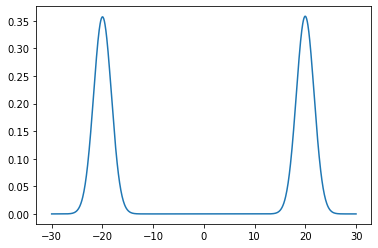

loss b 64.41838612798662


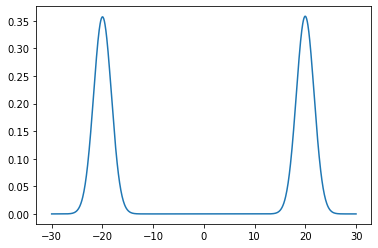

loss b 64.7801700859462


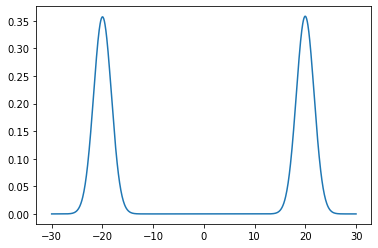

loss b 64.841367646966


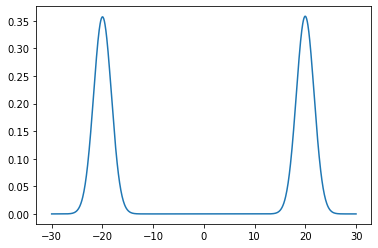

loss b 64.40075766557375


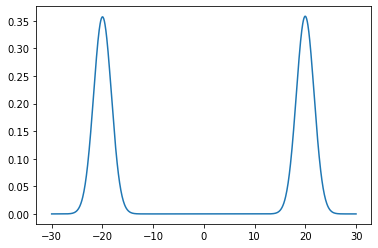

loss b 64.48334666420187


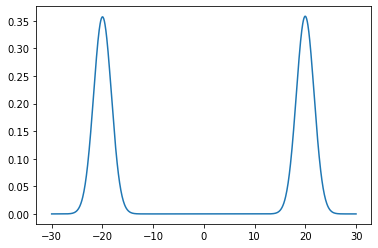

loss b 64.41461360739652


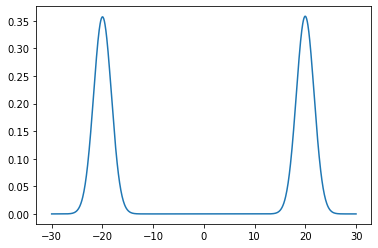

loss b 64.68124042792897


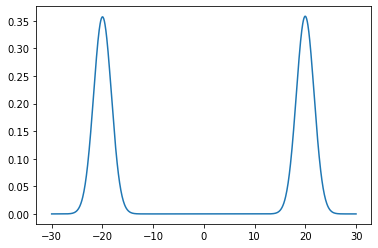

loss b 64.52209904249496


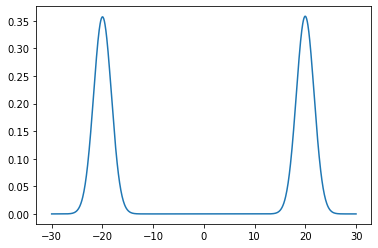

loss b 64.81030647571872


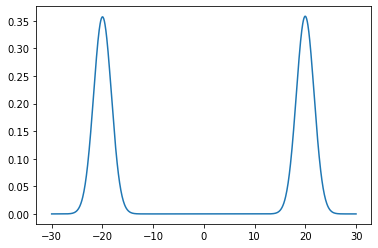

loss b 64.38612963731516


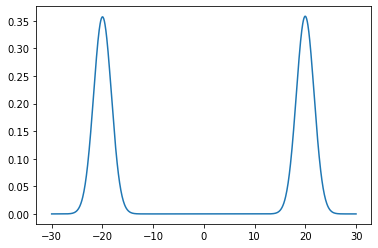

loss b 64.17870395115972


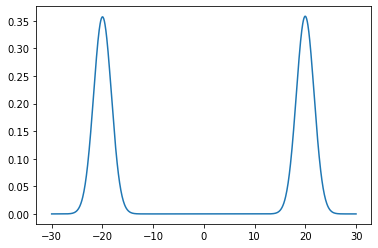

loss b 64.40955848326425


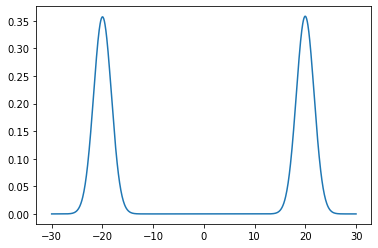

loss b 64.65938540292085


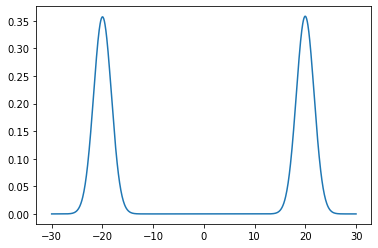

loss b 64.54212937904418


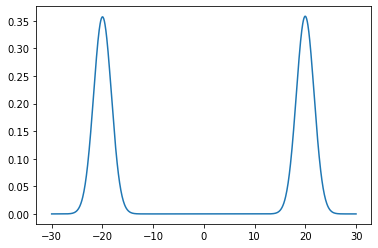

loss b 64.19723202494957


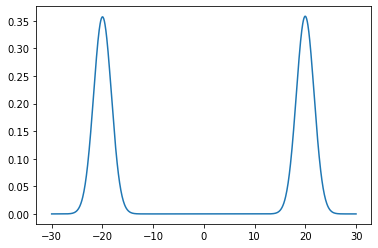

loss b 64.2070840024412


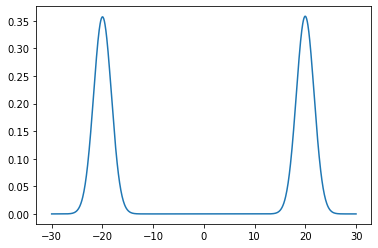

loss b 64.3341904944873


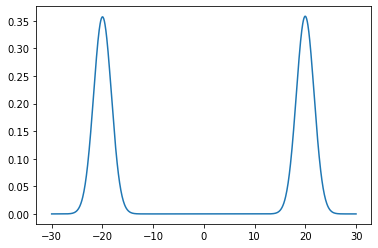

loss b 64.75101621216704


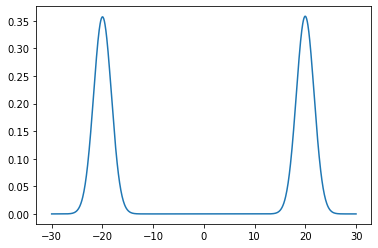

loss b 64.42588028812452


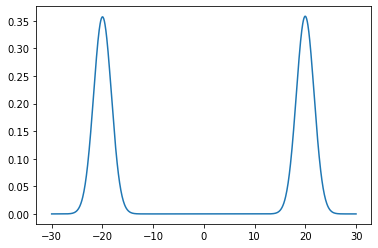

loss b 64.06952263175741


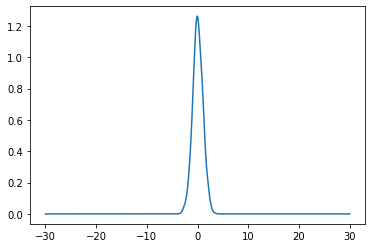

loss f 202.64421860517174


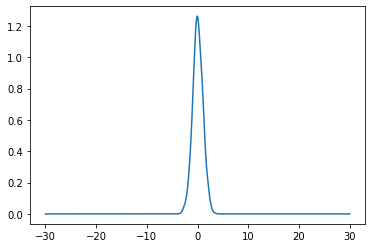

loss f 197.4021245418715


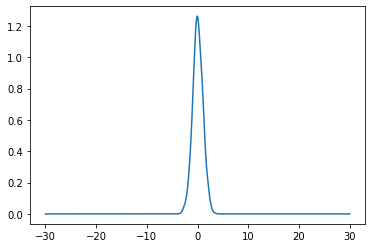

loss f 191.33912456720483


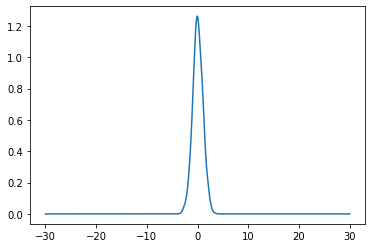

loss f 185.86516739395458


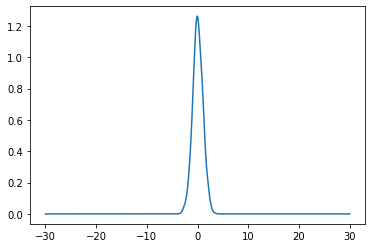

loss f 179.7036629926298


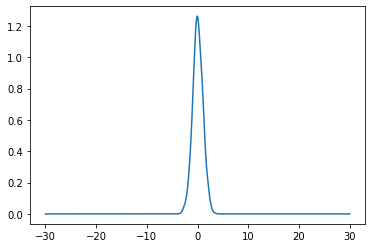

loss f 174.79261376048623


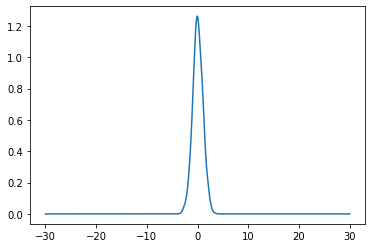

loss f 169.31544050807537


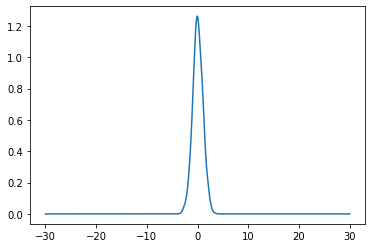

loss f 164.64492228908793


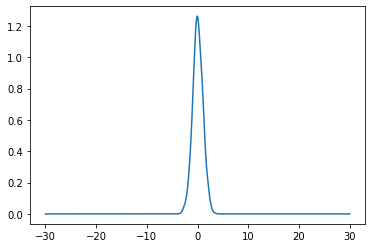

loss f 159.7746759675667


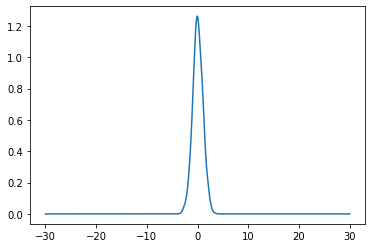

loss f 154.58899383697036


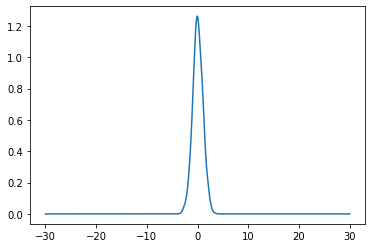

loss f 149.81475858300573


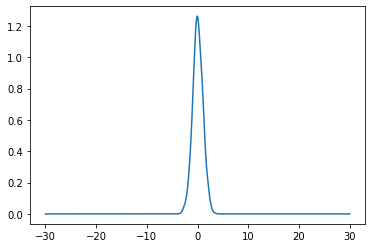

loss f 145.04635392148103


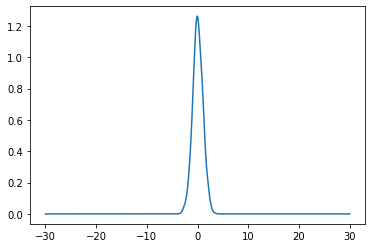

loss f 140.83476744789715


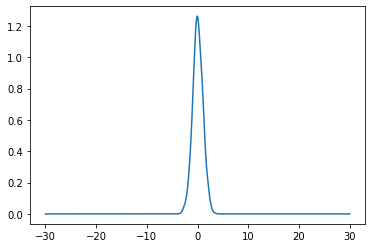

loss f 136.0529261767537


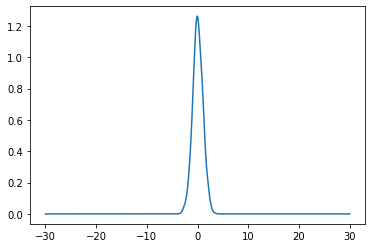

loss f 131.35577264786062


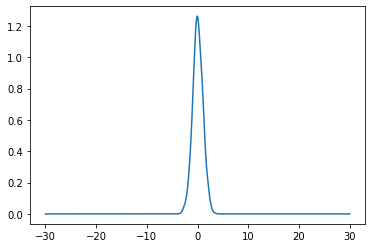

loss f 127.16899991706657


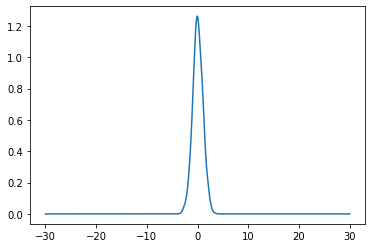

loss f 122.44581652608734


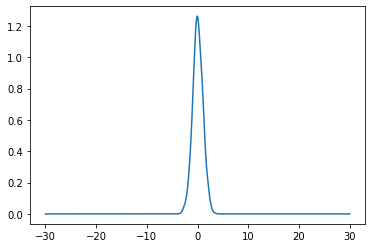

loss f 117.90108796686218


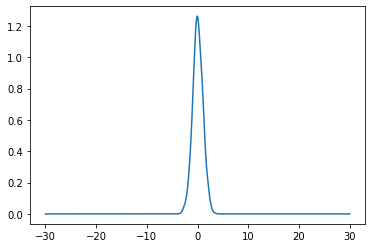

loss f 114.05680039536634


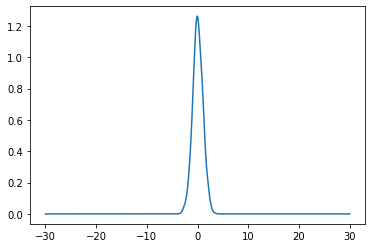

loss f 109.43784889133809


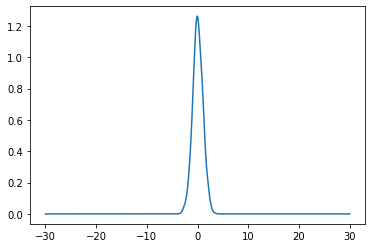

loss f 106.3583579214179


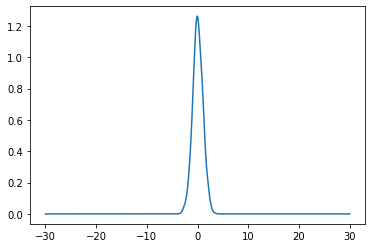

loss f 103.74173958861977


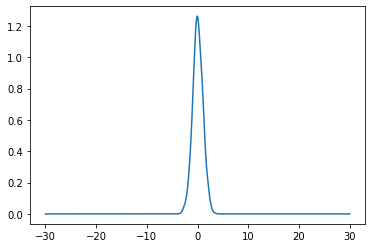

loss f 102.39589924575921


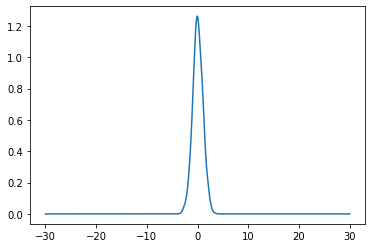

loss f 100.95756218651752


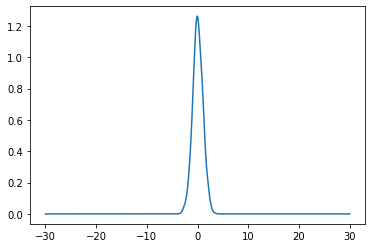

loss f 101.59240398951323


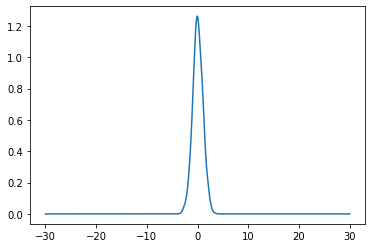

loss f 102.25501042548386


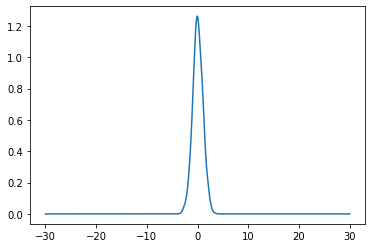

loss f 104.58633739924416


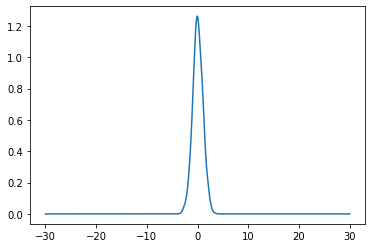

loss f 108.33212070310226


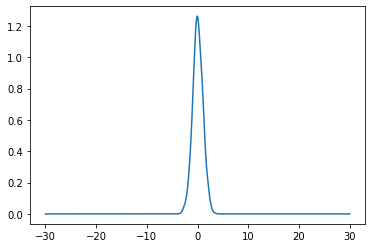

loss f 113.43291964356418


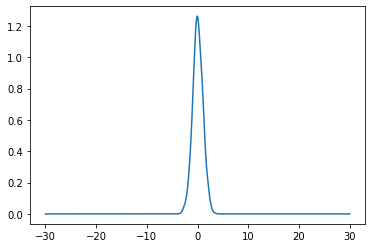

loss f 118.96960529810947


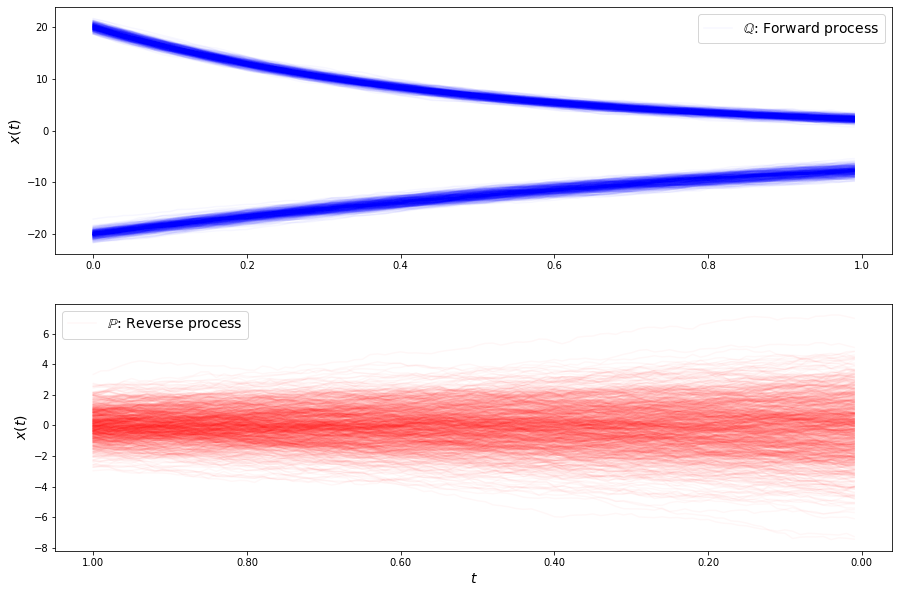

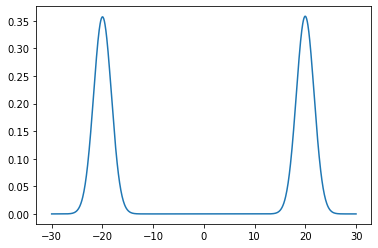

loss b 54.914080099881424


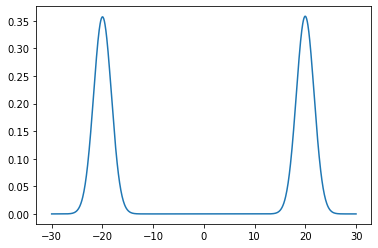

loss b 54.65297017620243


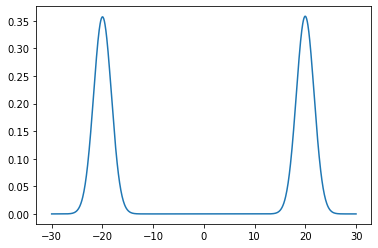

loss b 54.510515961144165


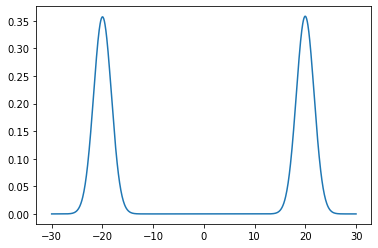

loss b 54.58386242292897


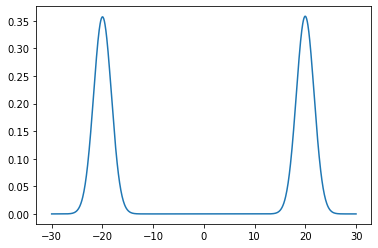

loss b 54.60431599921088


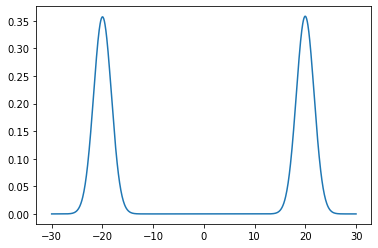

loss b 54.49565474859474


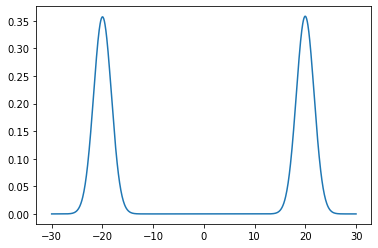

loss b 54.32666893849586


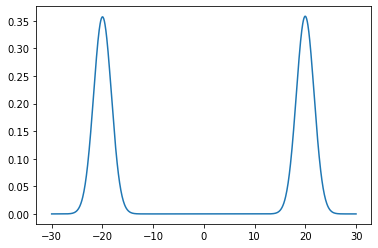

loss b 53.9099019349446


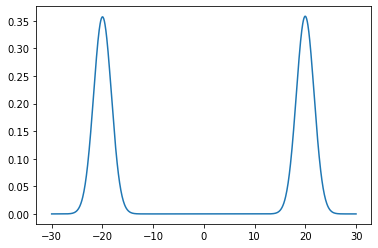

loss b 54.17623982923622


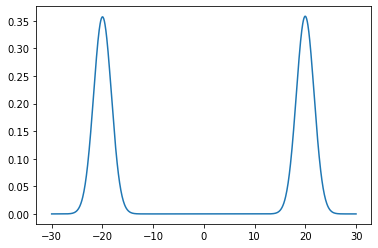

loss b 53.772127934593136


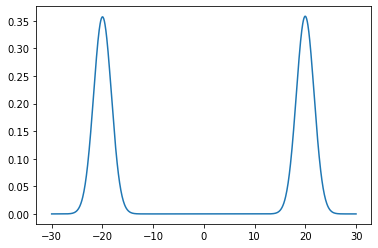

loss b 53.729280446587865


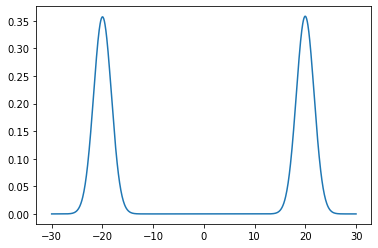

loss b 53.52618697804862


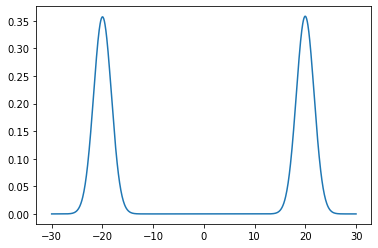

loss b 53.158346098732785


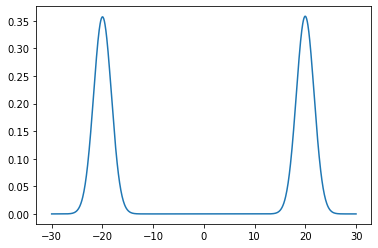

loss b 53.266576396137474


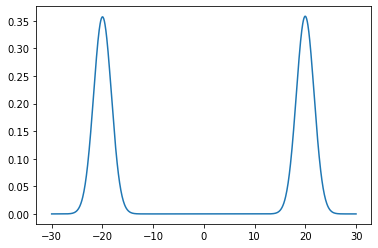

loss b 53.42942628253708


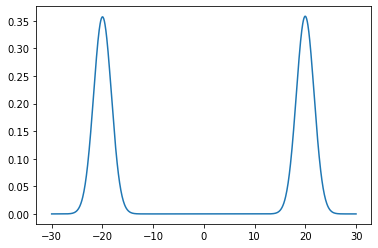

loss b 53.1094140619246


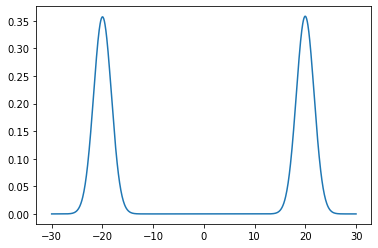

loss b 53.17902445280743


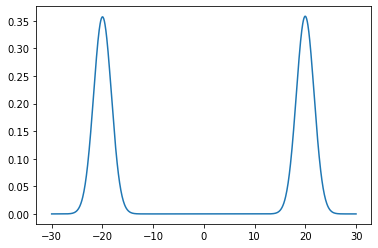

loss b 52.43924624661383


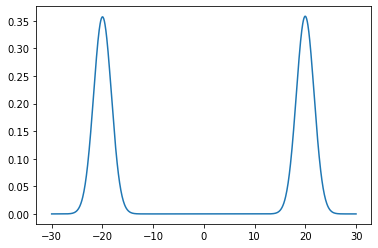

loss b 52.59250315069333


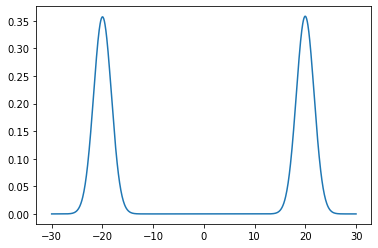

loss b 52.04079237228726


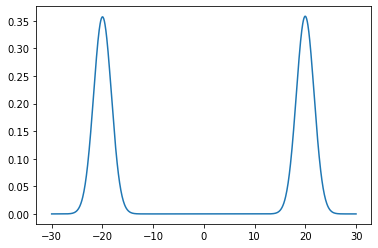

loss b 52.05386745131158


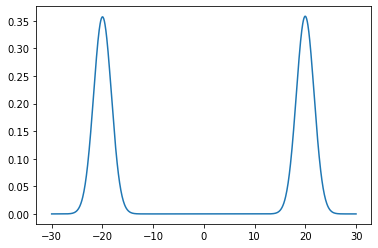

loss b 51.996869487204286


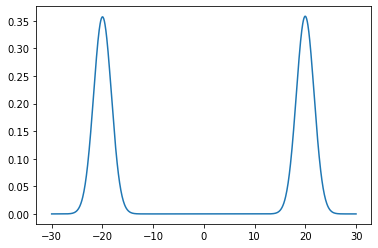

loss b 51.7641702491159


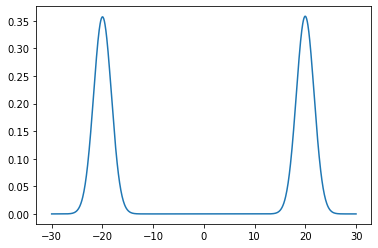

loss b 51.75921014831332


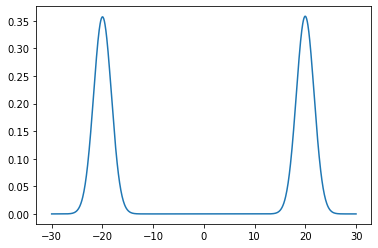

loss b 51.498898415622854


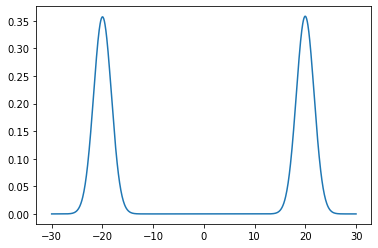

loss b 51.494247910539954


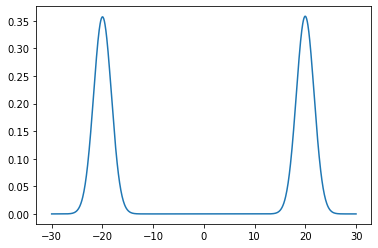

loss b 50.9303667107477


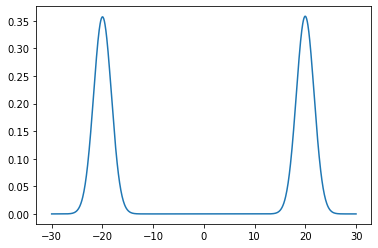

loss b 51.13302545997234


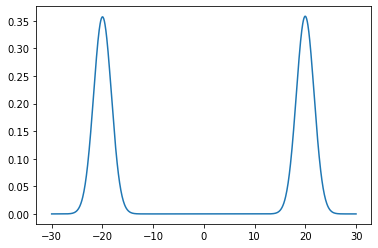

loss b 50.58551656618112


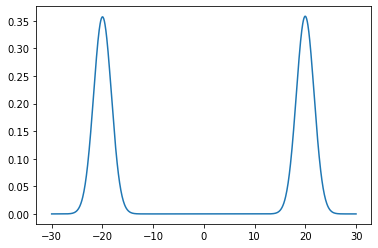

loss b 50.80023077970953


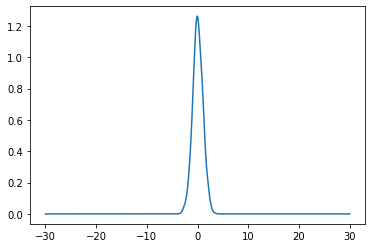

loss f 98.58024994428801


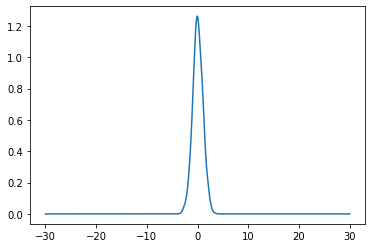

loss f 112.51160859752169


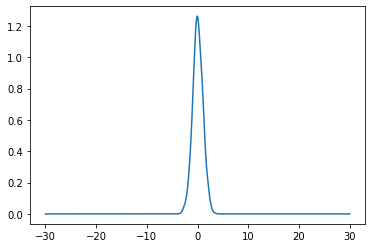

loss f 128.56782446536985


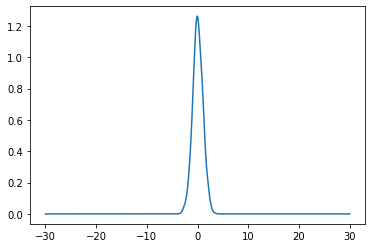

loss f 144.4070859596673


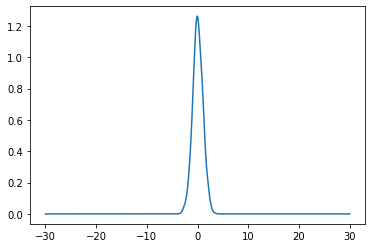

loss f 158.24047152591547


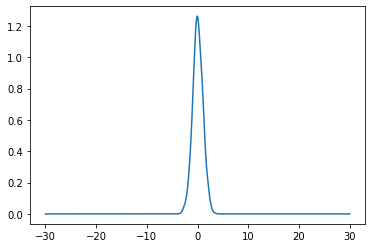

loss f 172.84421445199342


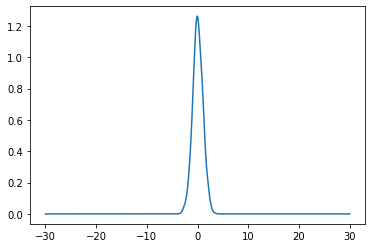

loss f 184.63221968881388


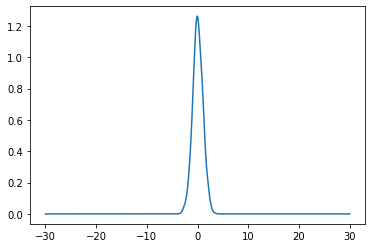

loss f 195.53537497014509


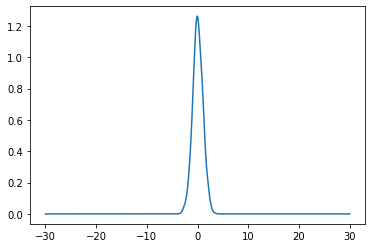

loss f 207.30297406560243


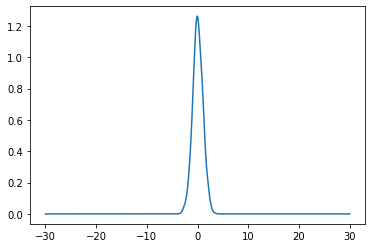

loss f 215.65069215878043


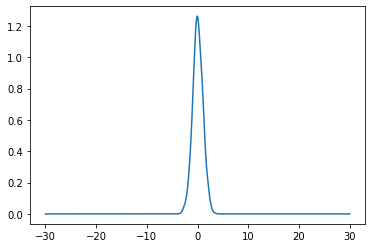

loss f 224.3352736675732


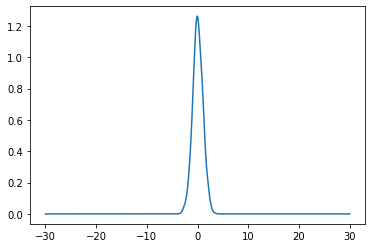

loss f 232.4644845402782


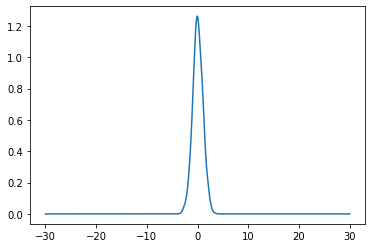

loss f 239.55434480818926


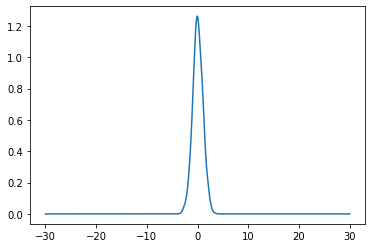

loss f 244.45716800816743


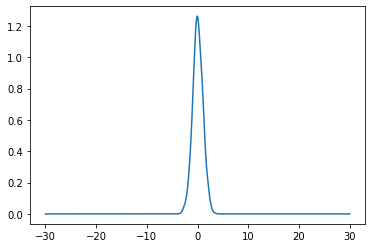

loss f 241.53114042815082


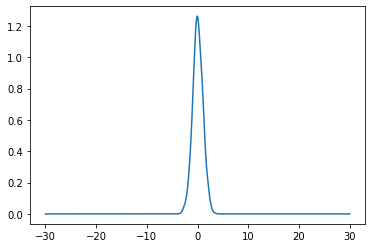

loss f 241.00343905234732


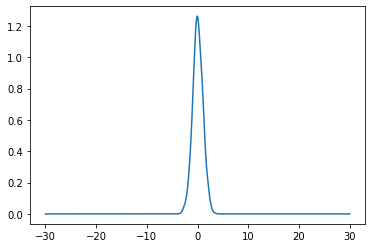

loss f 237.43616307912512


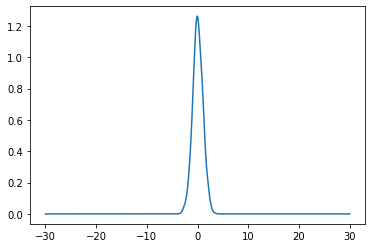

loss f 227.37406246566044


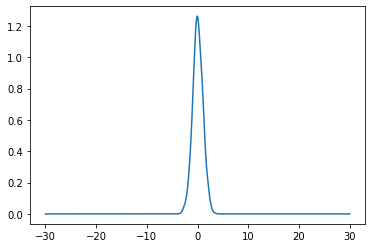

loss f 220.8614420602713


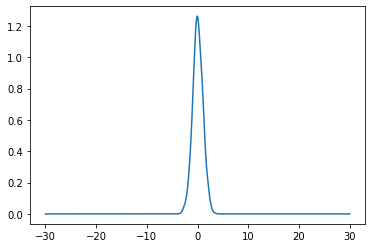

loss f 210.74773130116432


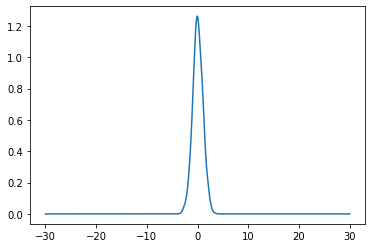

loss f 204.97212588956768


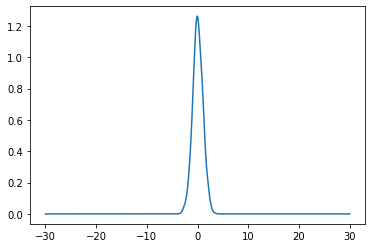

loss f 189.8861624113227


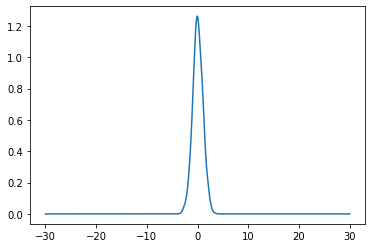

loss f 176.87446600968192


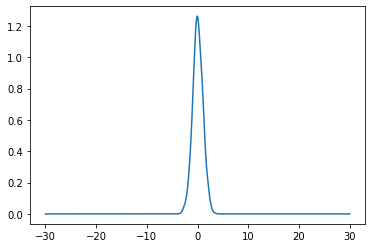

loss f 167.55205766889375


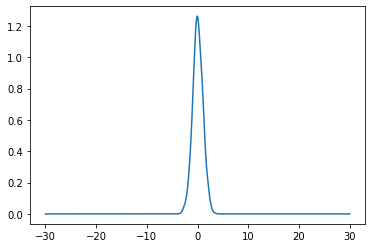

loss f 153.9214401422538


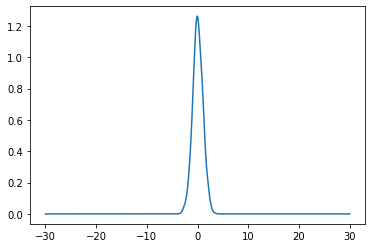

loss f 144.32282150934958


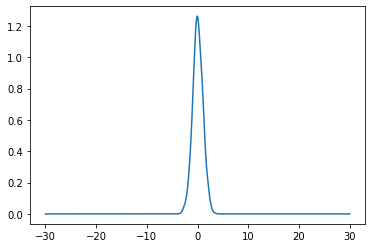

loss f 133.66257695020215


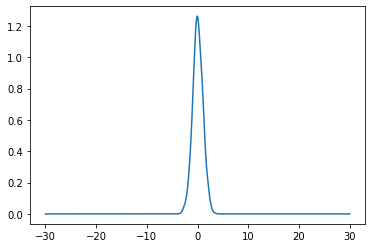

loss f 120.84608560093879


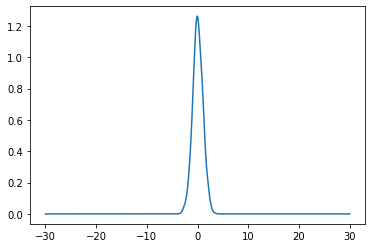

loss f 114.58769393083026


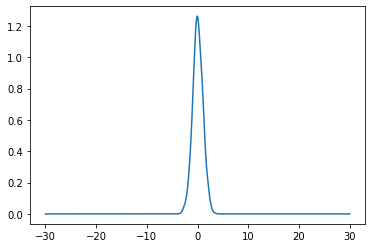

loss f 107.92454554411148


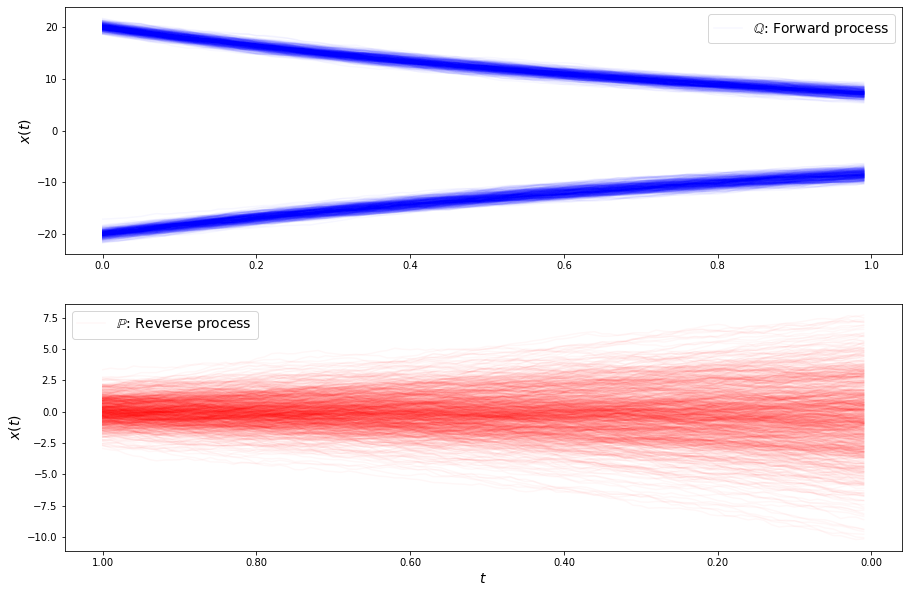

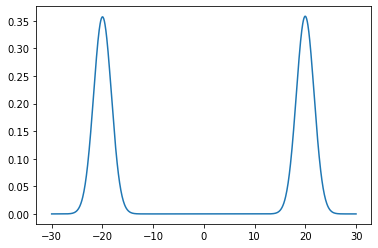

loss b 50.02962780266345


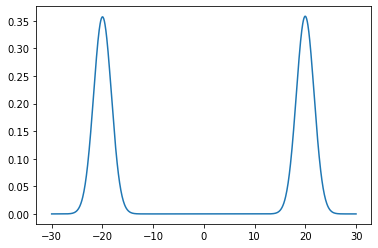

loss b 49.891577234231114


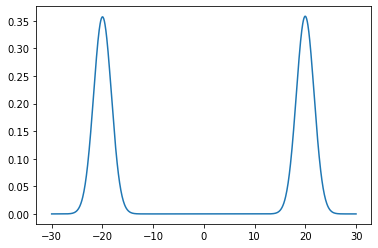

loss b 49.516615351288145


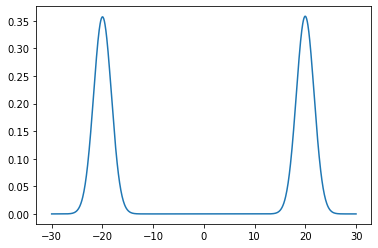

loss b 49.30069459539507


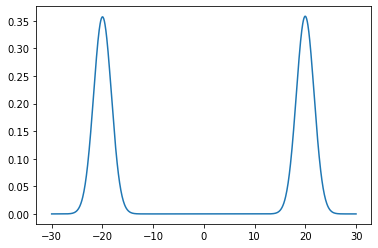

loss b 49.675647883069374


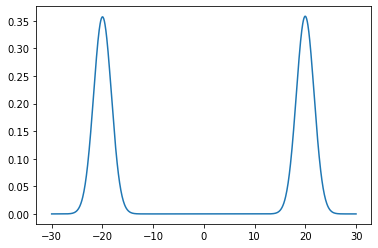

loss b 49.347356400063425


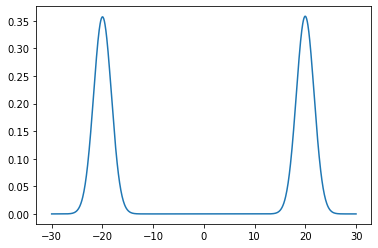

loss b 49.00689489600009


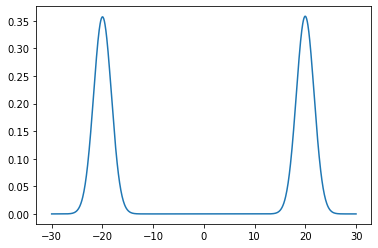

loss b 48.4988028703864


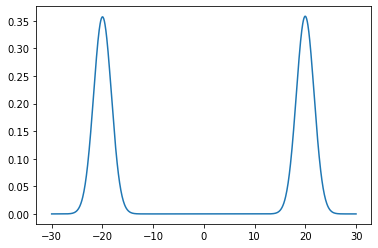

loss b 48.1768584162476


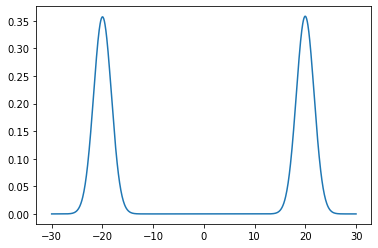

loss b 48.47494149783897


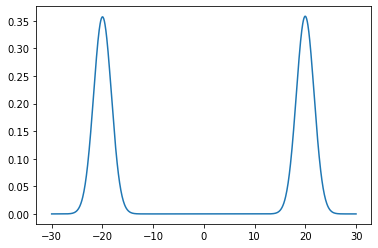

loss b 47.720119803455674


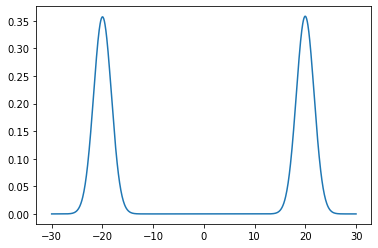

loss b 47.64999543323129


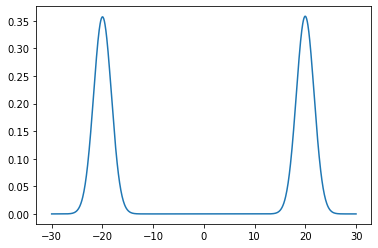

loss b 48.08217381355978


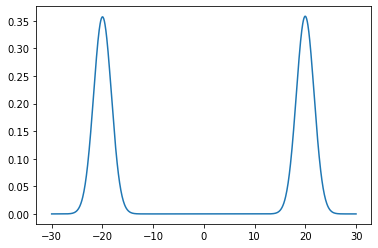

loss b 47.21424893715323


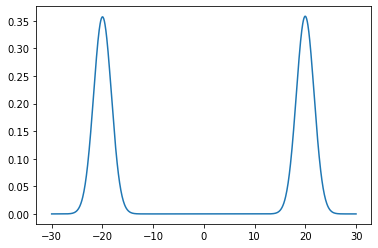

loss b 47.47079143009363


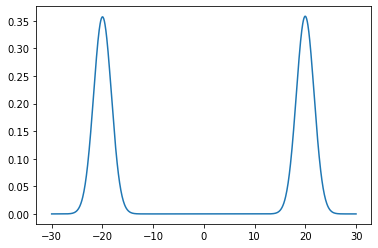

loss b 47.59399628227732


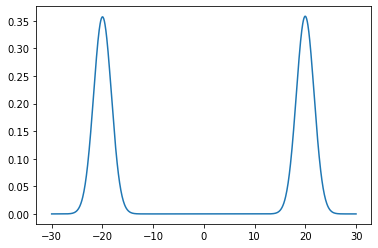

loss b 46.32781325335971


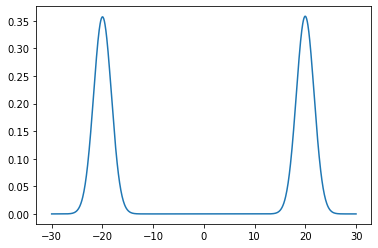

loss b 46.69926972919203


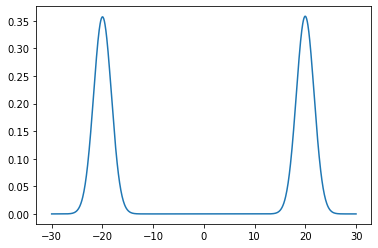

loss b 46.70407220899355


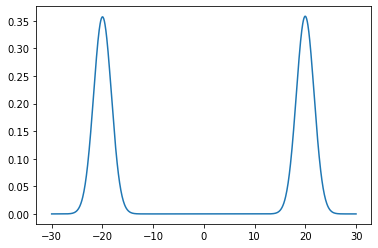

loss b 46.66252681840751


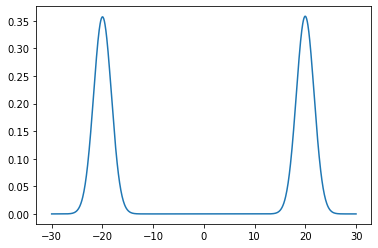

loss b 46.40095248535346


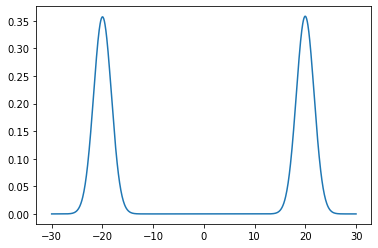

loss b 46.17104864069568


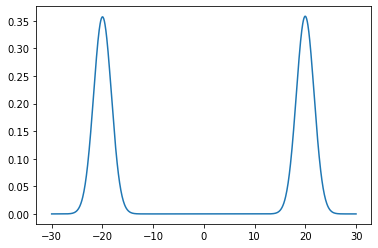

loss b 45.18780627218508


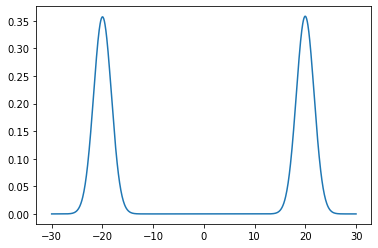

loss b 46.22034027079482


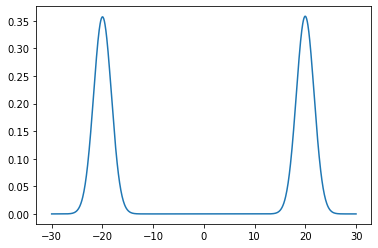

loss b 44.82718556750133


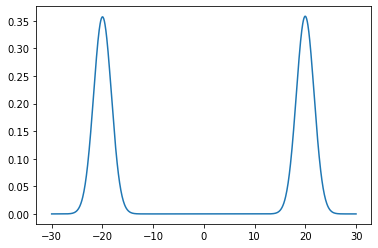

loss b 45.14204456674268


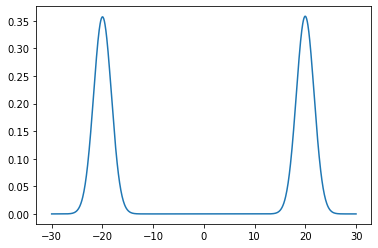

loss b 44.945328931611904


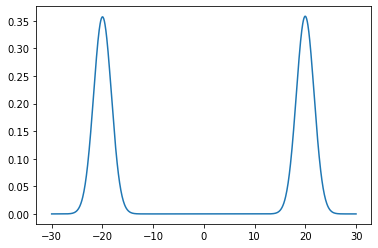

loss b 43.899799342619126


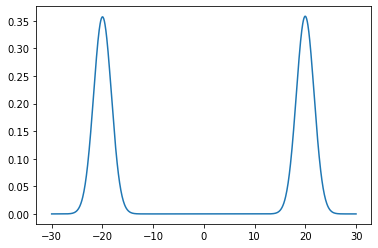

loss b 44.42058503648785


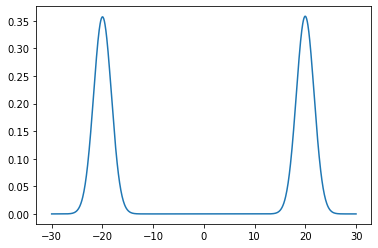

loss b 43.7594357091408


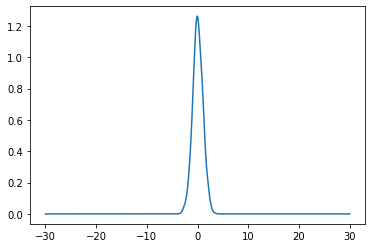

loss f 137.05782931976012


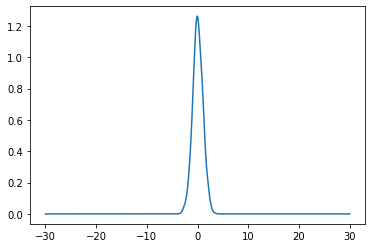

loss f 135.41721139348343


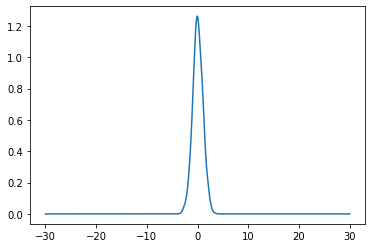

loss f 131.48953871812552


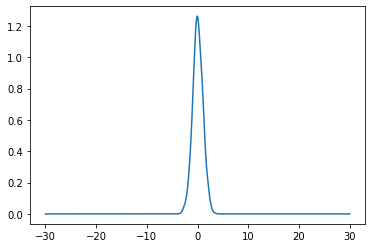

loss f 130.09698292978086


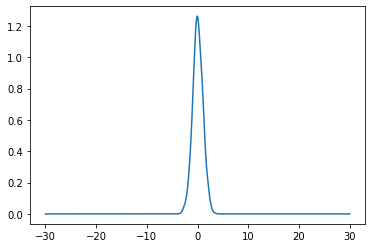

loss f 126.64717963926859


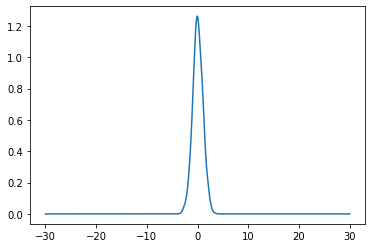

loss f 121.56892959882039


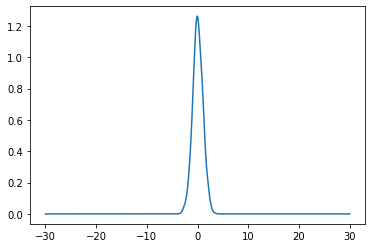

loss f 113.62244437306356


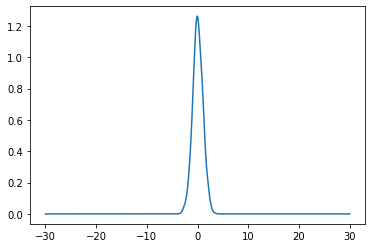

loss f 101.95989813532839


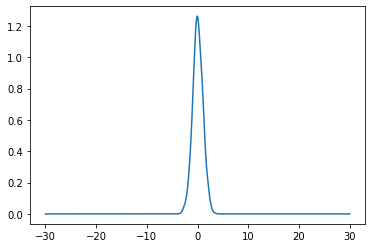

loss f 89.1665179370669


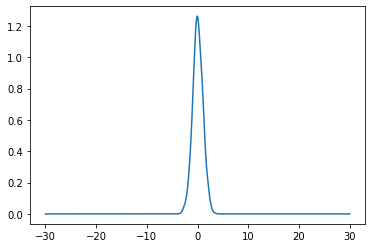

loss f 74.59038752325942


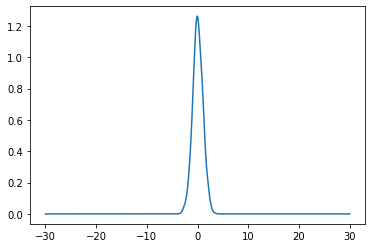

loss f 62.11545019736574


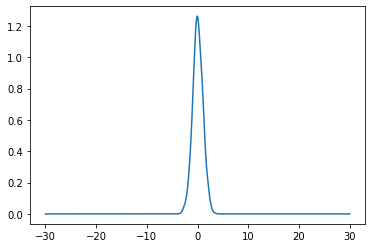

loss f 51.00612024516008


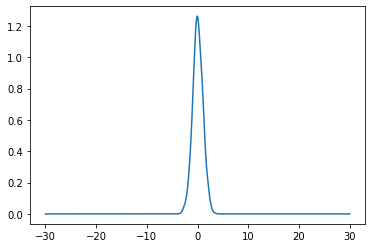

loss f 41.587905763839785


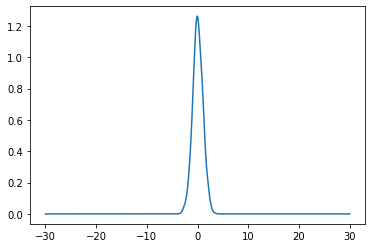

loss f 32.54955997284797


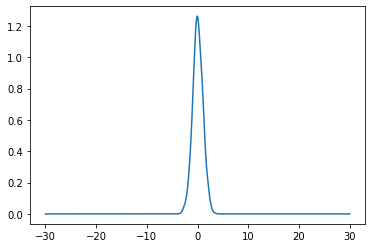

loss f 25.746906970571338


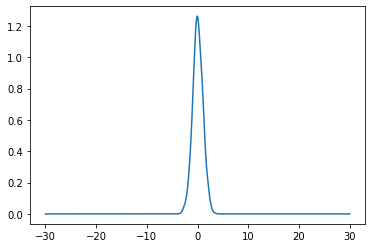

loss f 19.764096141721335


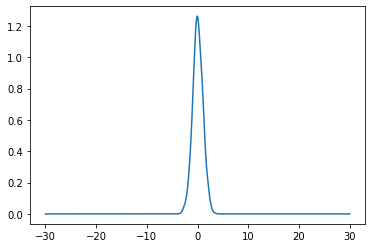

loss f 15.344451435584931


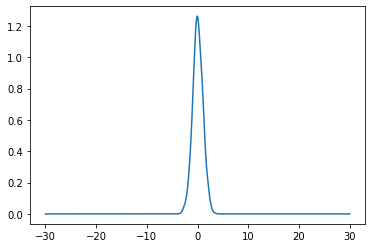

loss f 12.093073968632496


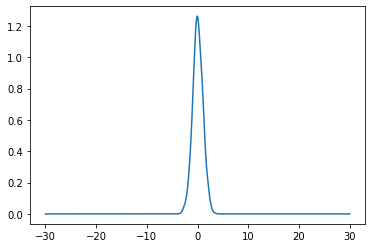

loss f 10.73423857821114


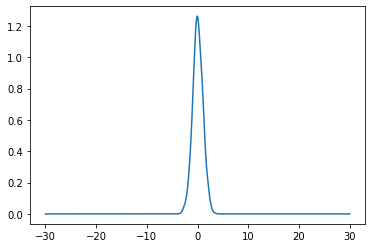

loss f 10.310448135304869


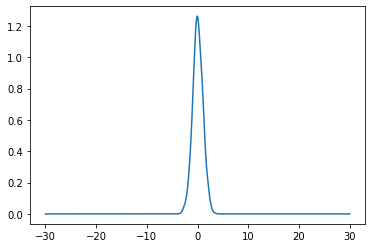

loss f 10.852864080968848


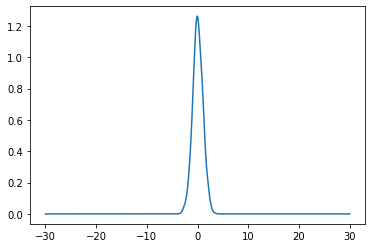

loss f 12.32345809371768


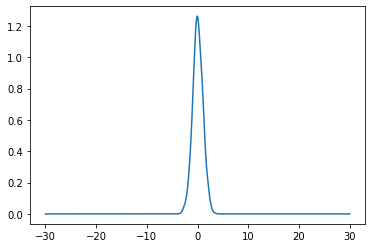

loss f 14.289614714657304


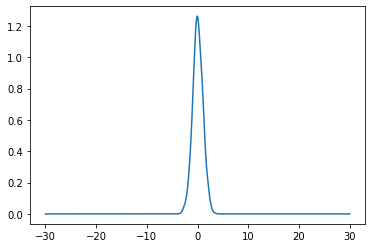

loss f 16.850124704877654


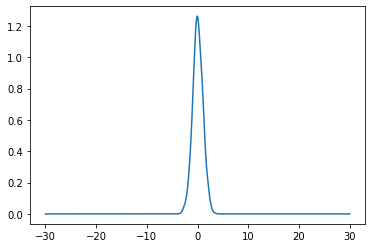

loss f 19.86760568638071


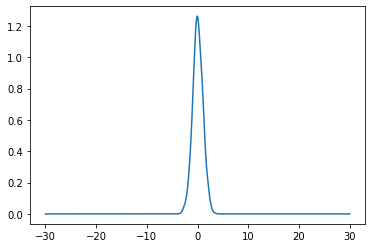

loss f 23.43297413362977


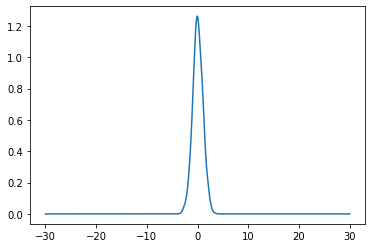

loss f 27.15112645938016


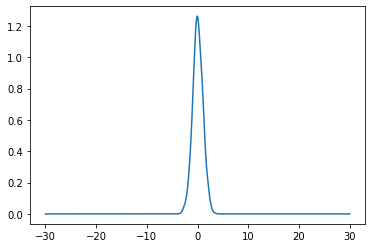

loss f 31.25000365719075


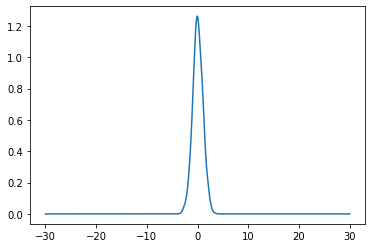

loss f 35.656170516069444


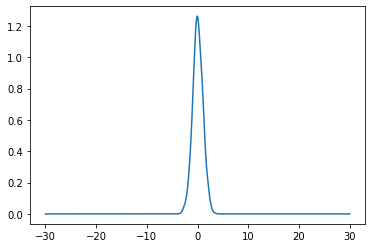

loss f 40.299638462736894


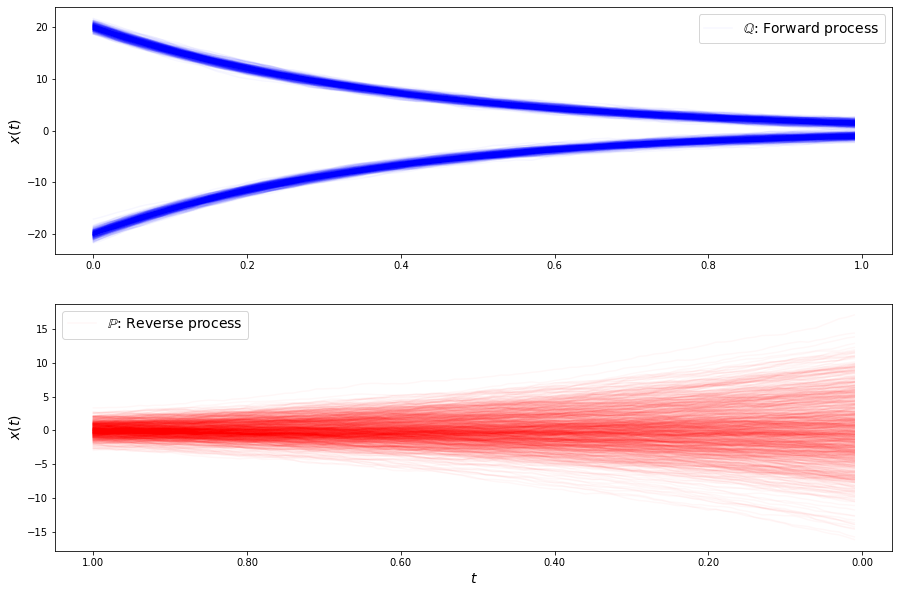

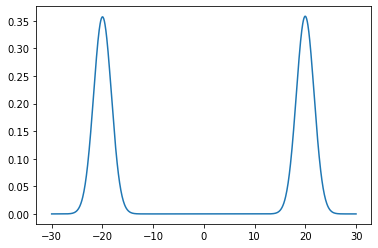

loss b 45.45700971397713


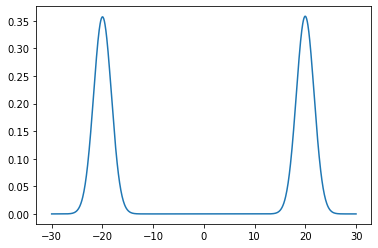

loss b 45.114637076614045


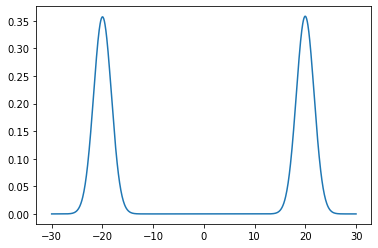

loss b 44.866064444694565


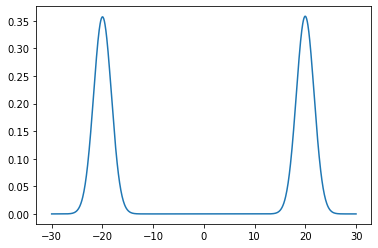

loss b 43.72709905154927


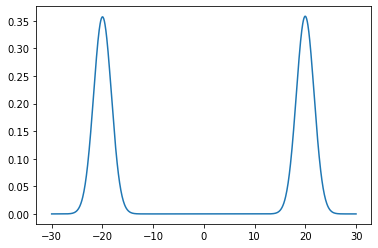

loss b 43.255156241785514


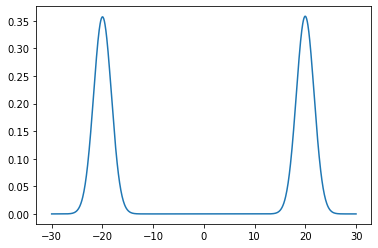

loss b 43.59332251612496


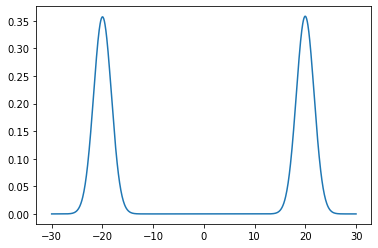

loss b 43.06913920433622


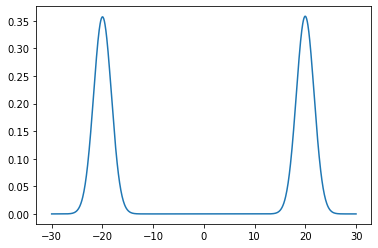

loss b 42.46422060947321


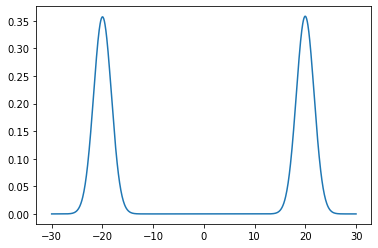

loss b 41.91821177316714


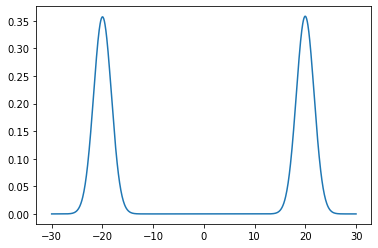

loss b 41.5094776134192


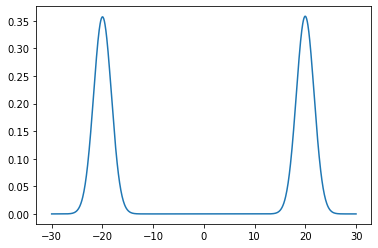

loss b 40.45028156657907


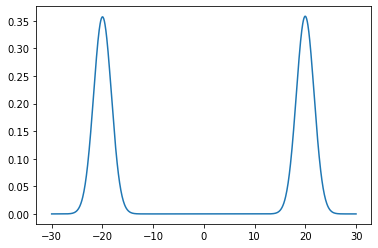

loss b 40.26120678410551


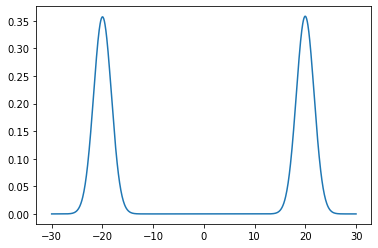

loss b 39.85945528292685


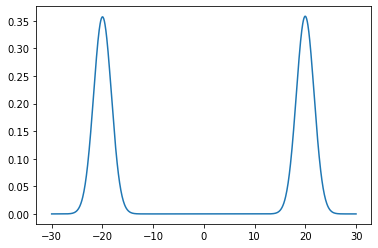

loss b 38.75087105549492


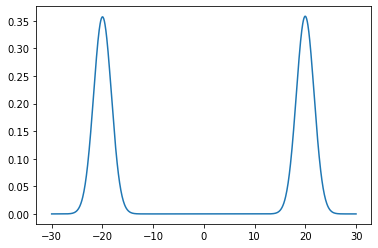

loss b 38.67723265089939


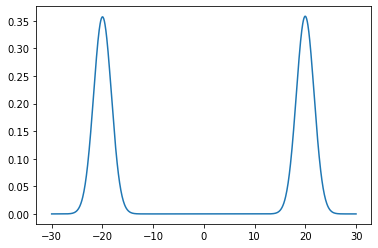

loss b 38.21214043071578


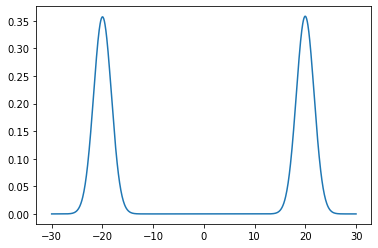

loss b 37.1168694805666


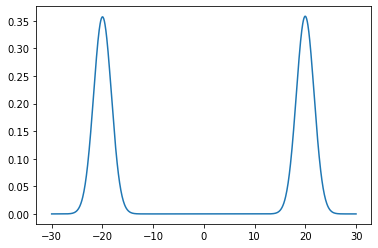

loss b 36.844225637408854


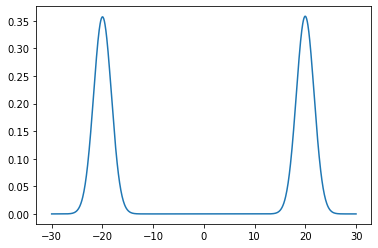

loss b 35.533697664123395


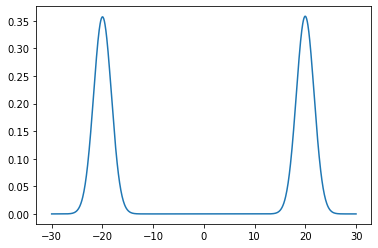

loss b 34.926673497844035


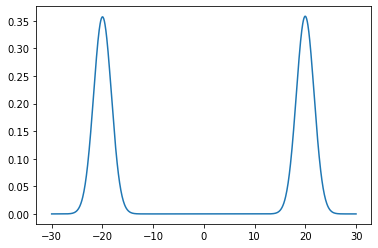

loss b 34.20028268705274


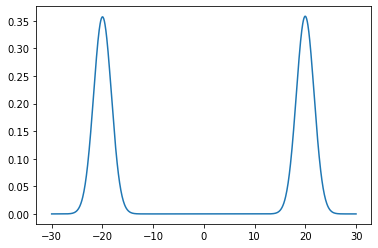

loss b 33.53385466188875


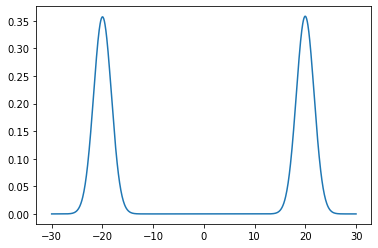

loss b 33.73904857043456


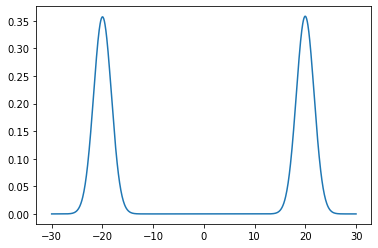

loss b 32.39017279508996


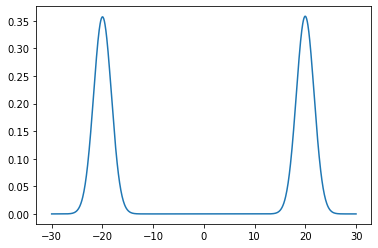

loss b 32.20393257588673


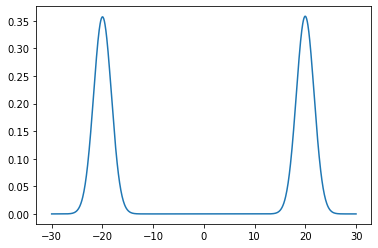

loss b 31.347521419773138


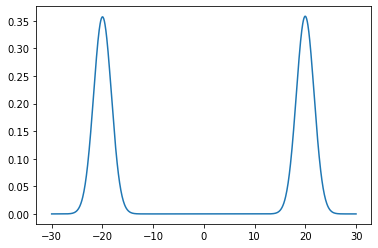

loss b 30.48334412883526


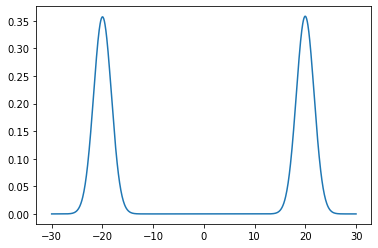

loss b 29.4936035468613


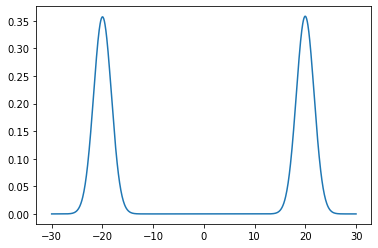

loss b 29.18854458529006


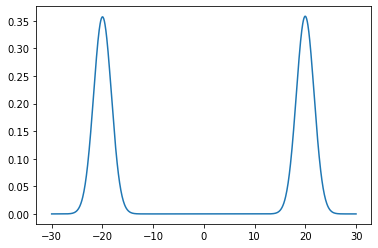

loss b 28.06654064835842


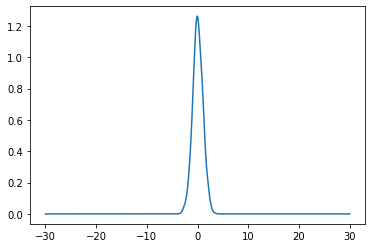

loss f 7.58016163956336


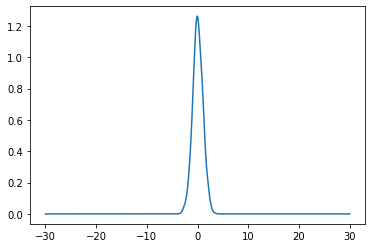

loss f 8.781473964531507


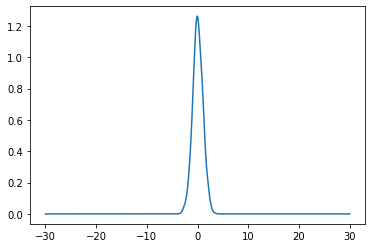

loss f 10.263446717490192


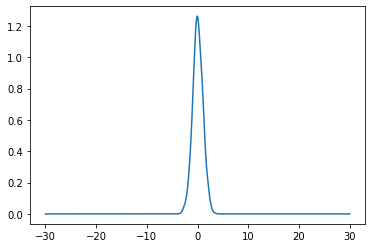

loss f 11.973474290911527


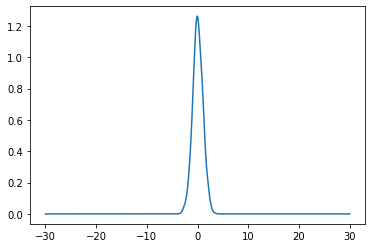

loss f 14.004762815388712


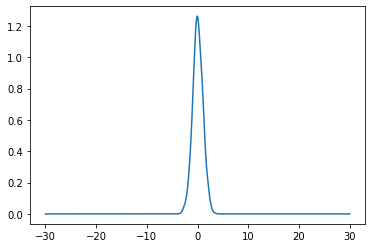

loss f 16.26471268130611


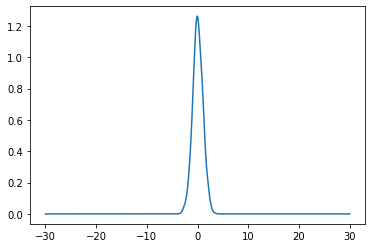

loss f 18.823838076927554


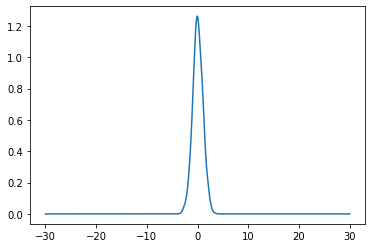

loss f 21.49625753483768


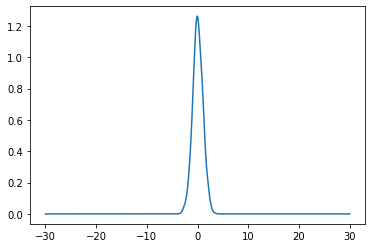

loss f 24.471571154139845


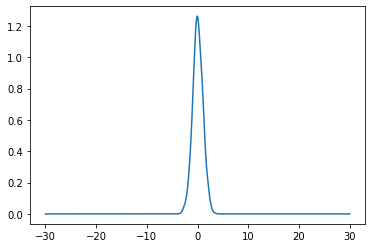

loss f 27.600318128844236


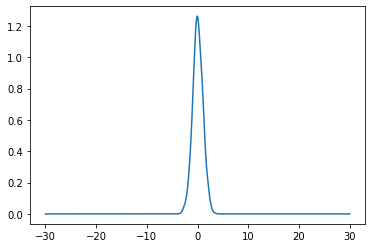

loss f 30.953177852250946


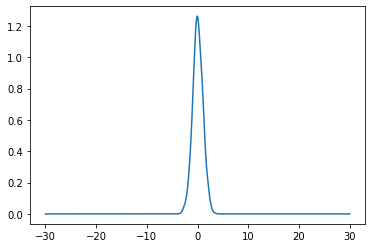

loss f 34.20486976472628


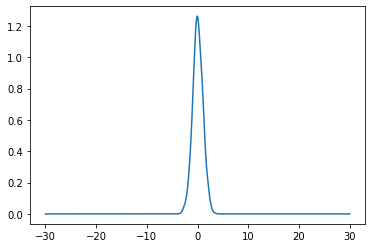

loss f 37.78005065908951


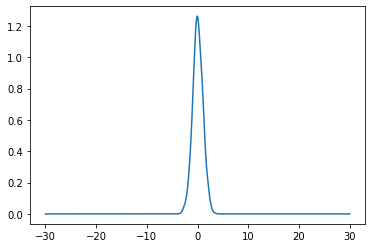

loss f 41.36714888651228


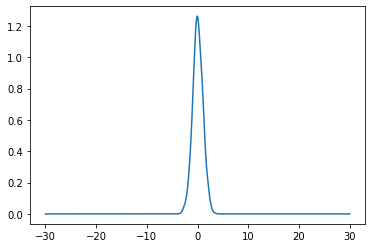

loss f 45.08275996729023


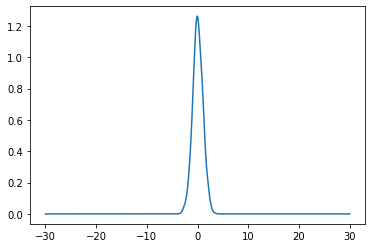

loss f 48.94669021439769


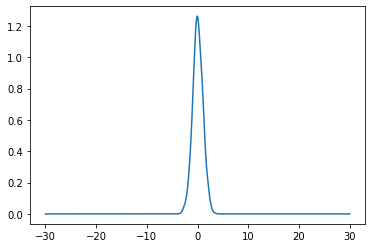

loss f 52.722494078749925


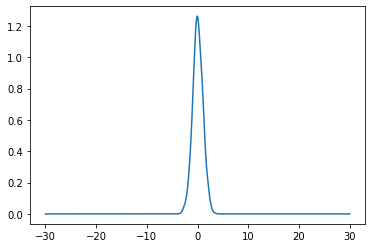

loss f 56.58481417319734


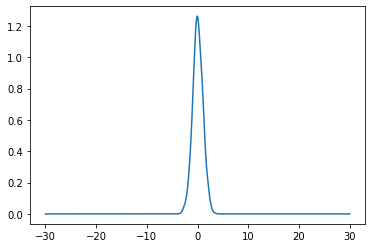

loss f 60.470458360954474


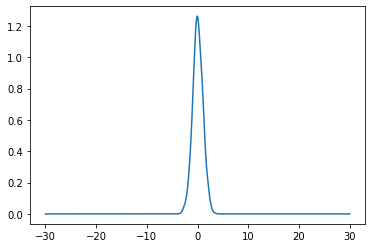

loss f 64.41927996583749


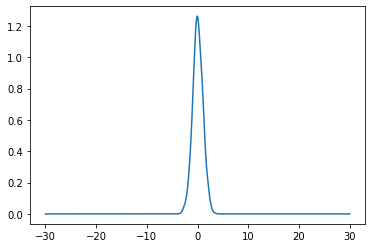

loss f 68.4119165101902


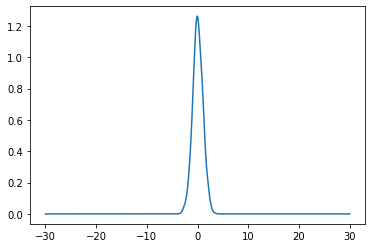

loss f 72.07881516563457


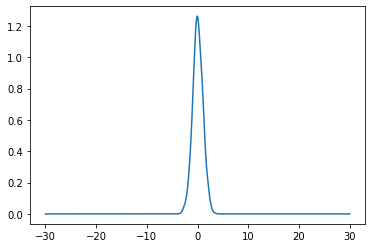

loss f 75.88790326920397


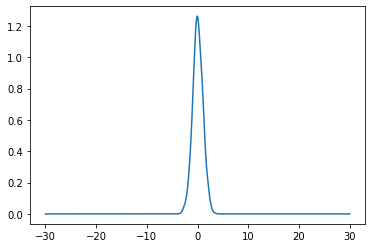

loss f 79.72423375606003


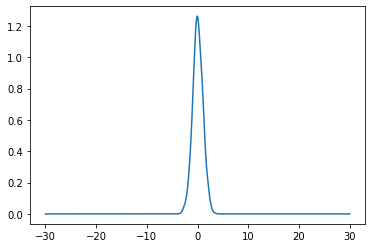

loss f 83.34119344579751


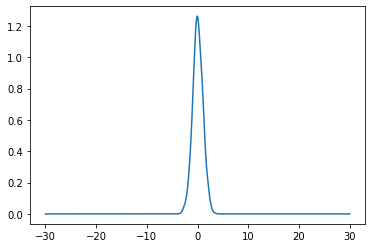

loss f 86.94481136250582


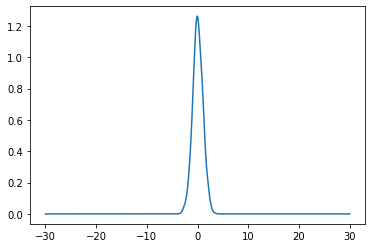

loss f 90.33161482622664


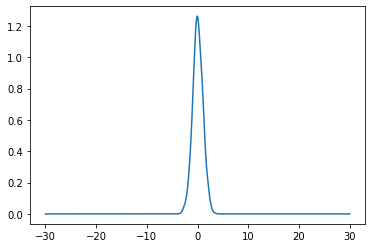

loss f 93.83522344982421


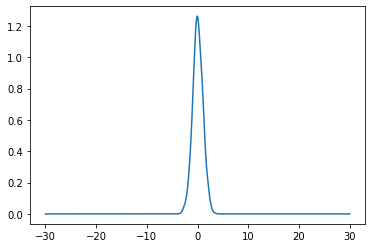

loss f 96.98146202559455


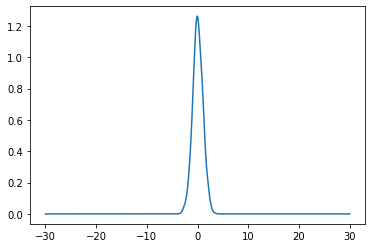

loss f 100.15526134668134


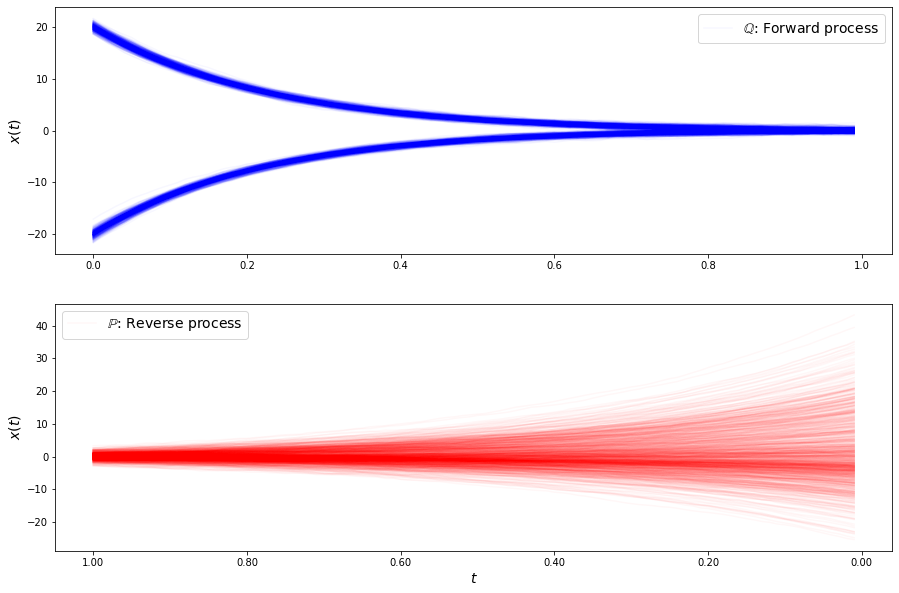

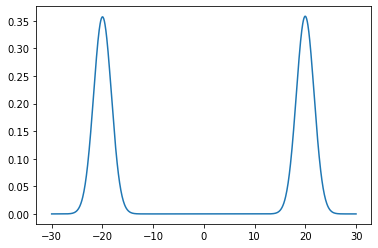

loss b 79.70621082774008


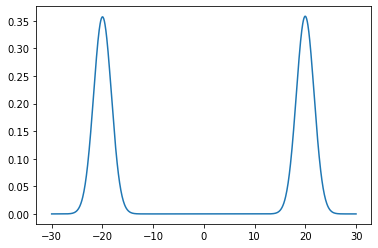

loss b 77.23417738249339


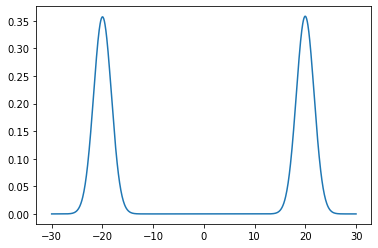

loss b 79.64730330651119


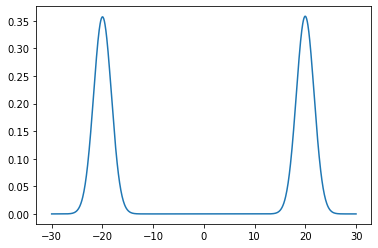

loss b 79.4365377643526


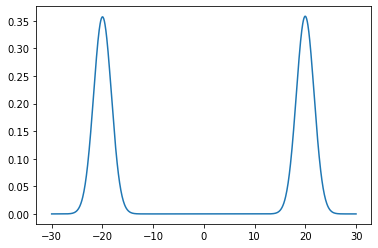

loss b 83.86062822753395


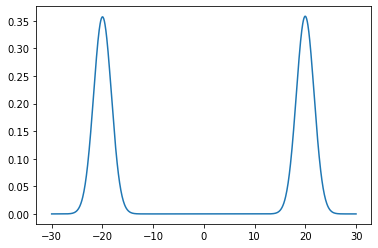

loss b 83.5497620083819


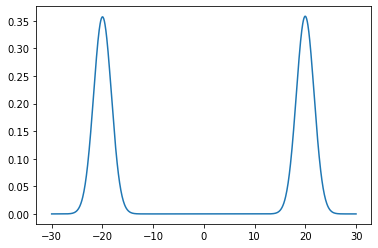

loss b 84.52911632944037


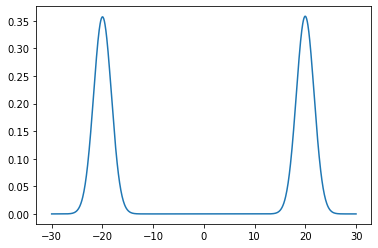

loss b 82.41326994203597


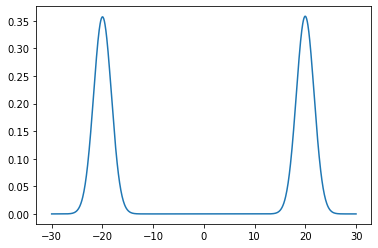

loss b 84.25595001003757


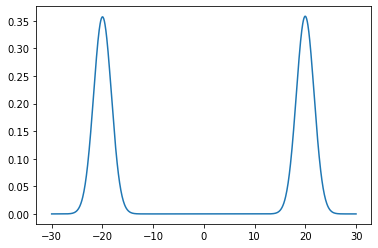

loss b 86.9830408823839


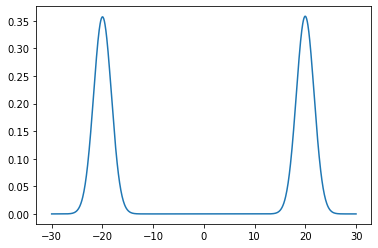

loss b 86.5466997603177


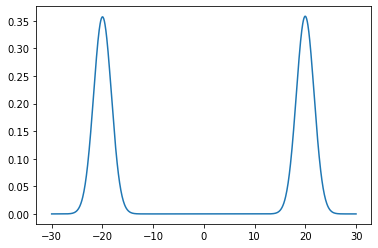

loss b 88.38936219737407


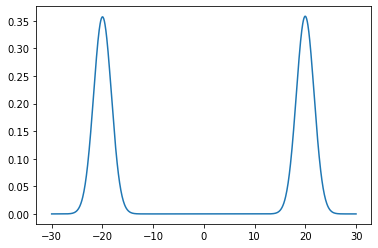

loss b 93.1378914045462


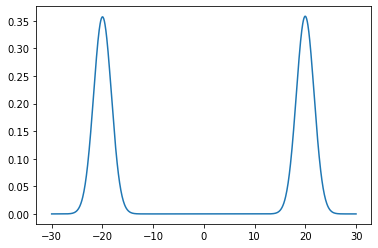

loss b 96.17865067318189


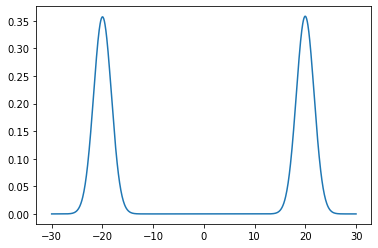

loss b 104.7932554321978


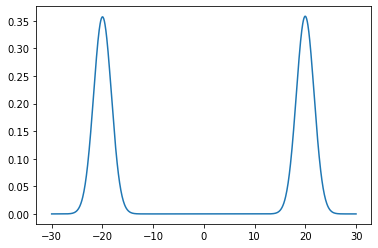

loss b 102.46311593990887


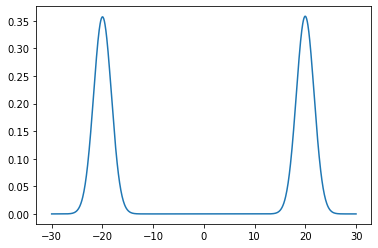

loss b 108.70501569584553


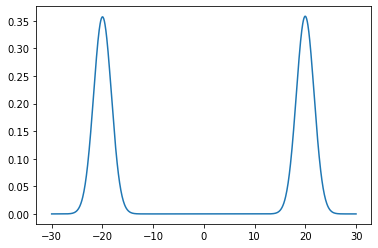

loss b 112.19993678289252


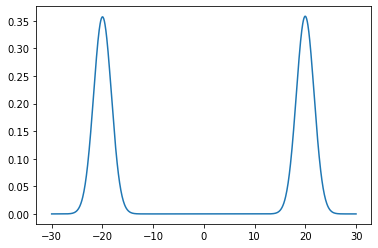

loss b 116.16465477612516


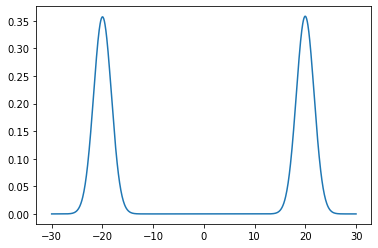

loss b 121.46873730787719


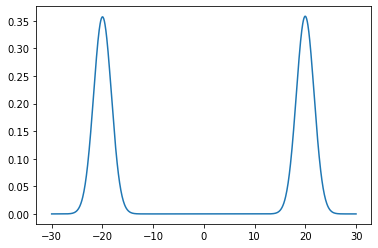

loss b 130.50065760368324


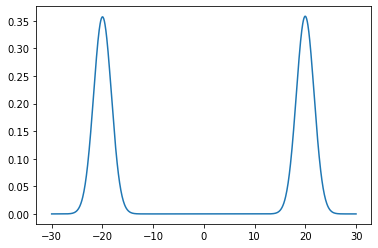

loss b 139.15304542068642


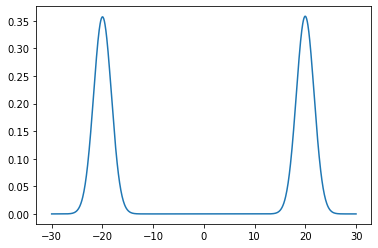

loss b 147.0913546407125


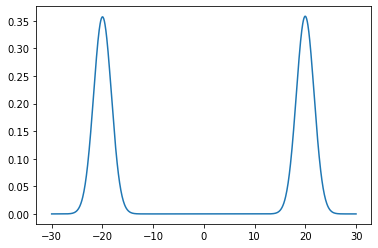

loss b 163.34019739458262


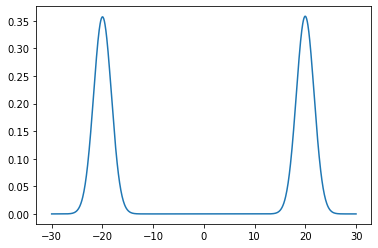

loss b 167.9938911129086


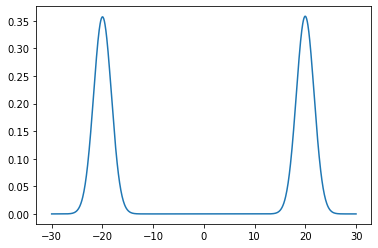

loss b 161.97891775001642


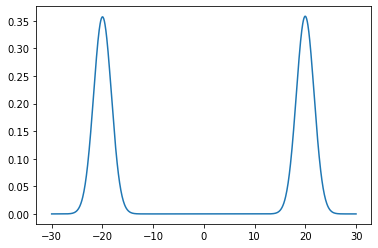

loss b 180.52039102088048


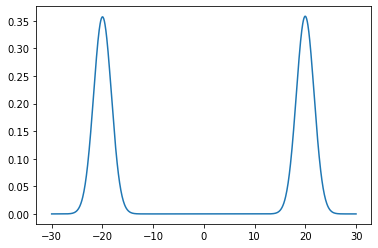

loss b 181.96945540647297


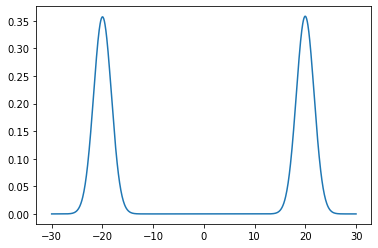

loss b 197.05024086792739


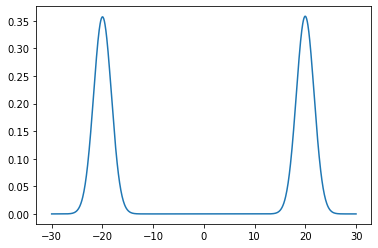

loss b 188.79637147756048


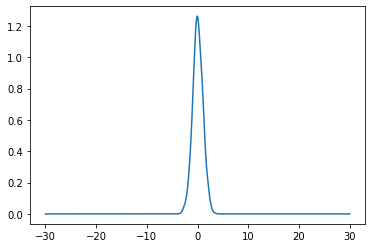

loss f 15.579902655253102


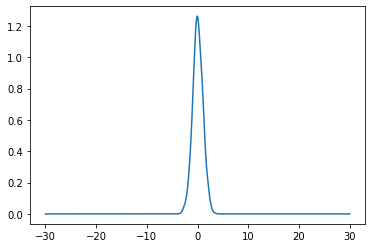

loss f 14.410790209379575


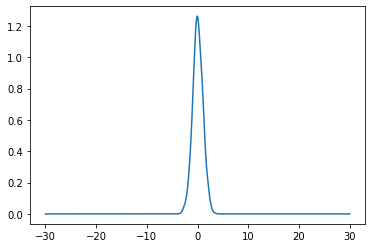

loss f 13.54272148718924


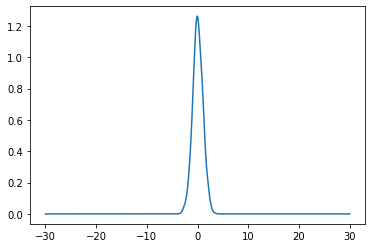

loss f 12.855717114910695


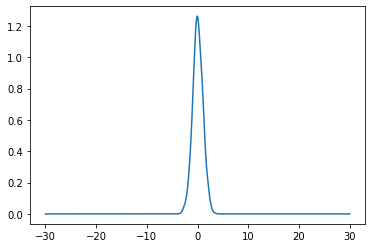

loss f 12.441926240005577


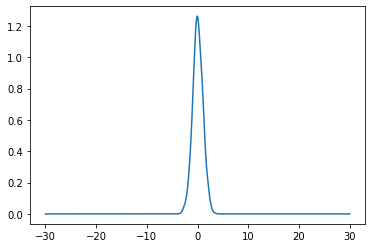

loss f 12.256352238041325


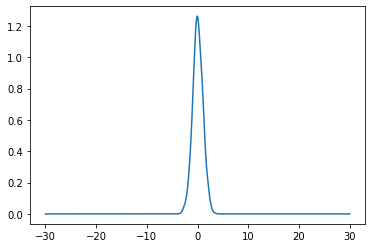

loss f 12.328937840183865


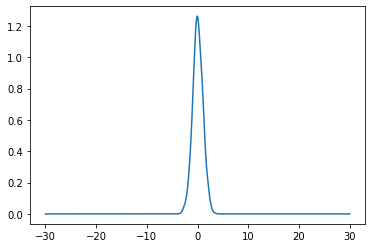

loss f 12.720201887538607


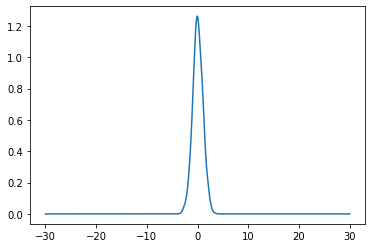

loss f 13.376083850779926


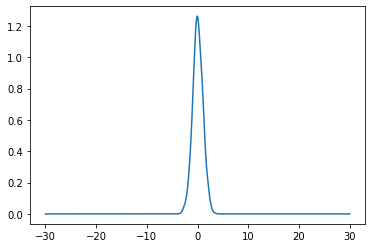

loss f 14.416049500346134


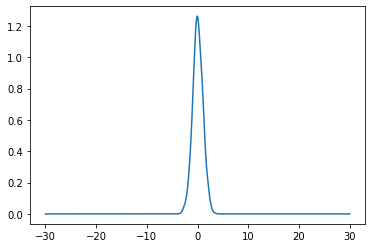

loss f 15.786316635547385


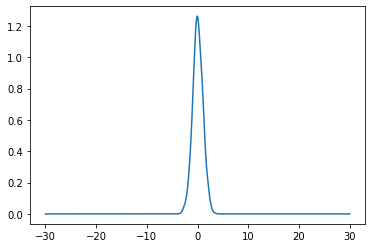

loss f 17.515690228064987


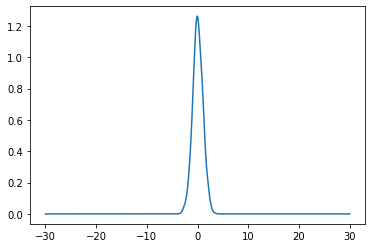

loss f 19.6173264958878


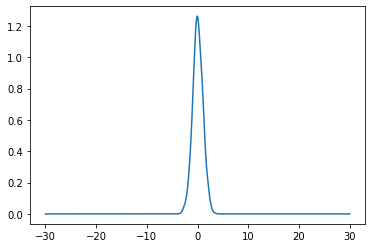

loss f 21.927263262444843


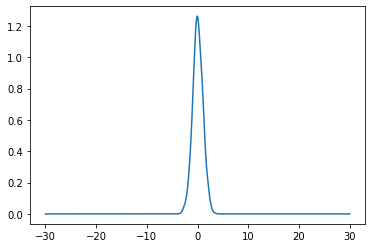

loss f 24.473229484427456


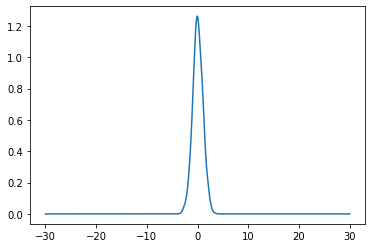

loss f 27.31316261523235


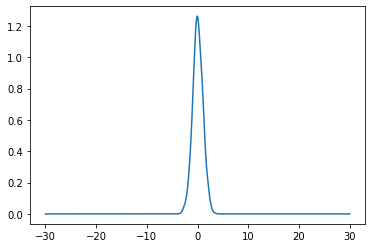

loss f 30.395344104837054


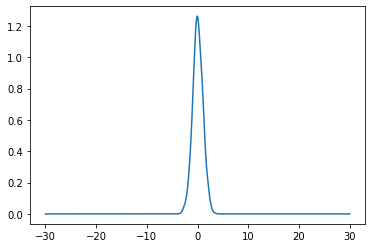

loss f 33.55447159290633


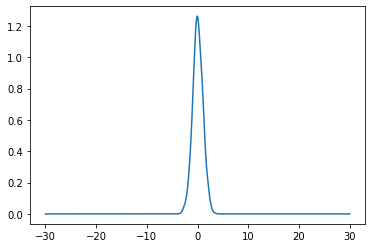

loss f 36.88422047325081


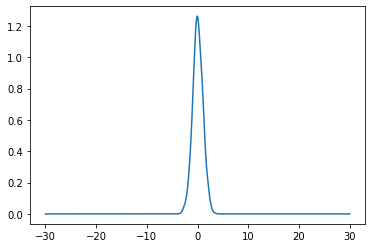

loss f 40.35766498629831


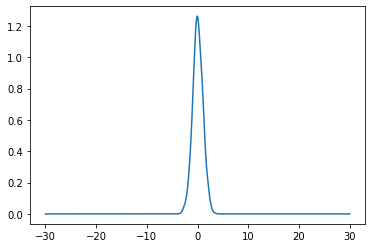

loss f 43.69953997603238


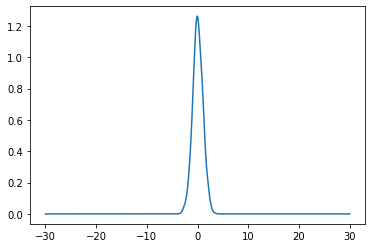

loss f 47.20095520480881


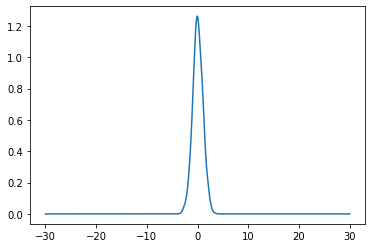

loss f 50.67128544015993


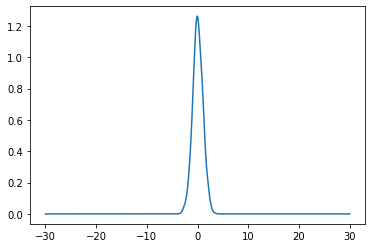

loss f 53.67993725638549


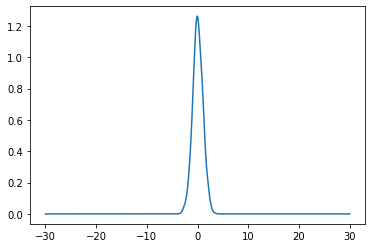

loss f 56.65916502637569


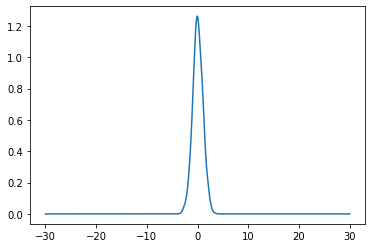

loss f 59.37200558404094


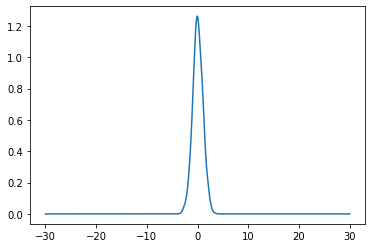

loss f 61.60181532221281


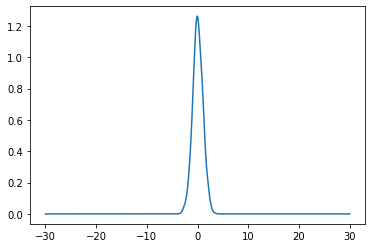

loss f 63.57882541143414


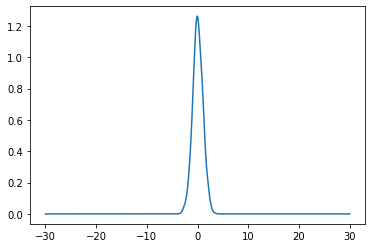

loss f 65.40612157554872


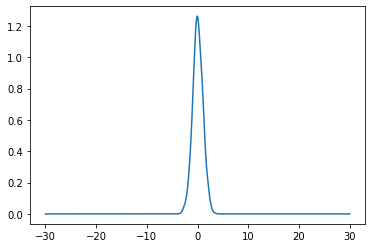

loss f 66.78339657633555


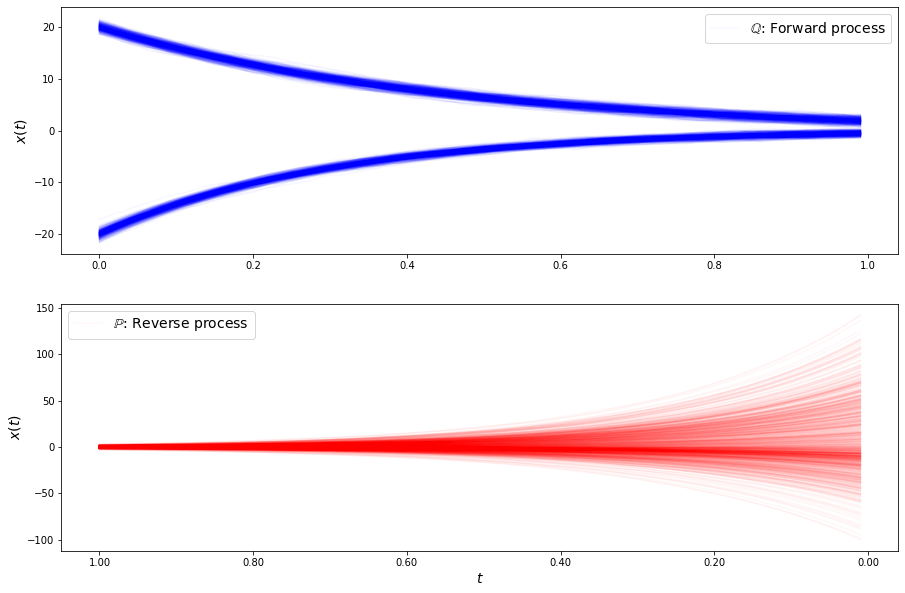

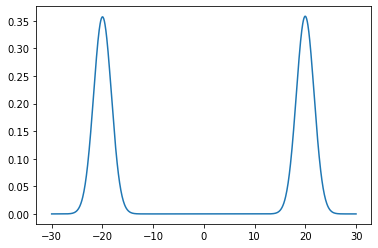

loss b 394.63392887535855


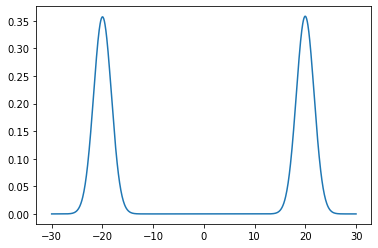

loss b 324.9540597950199


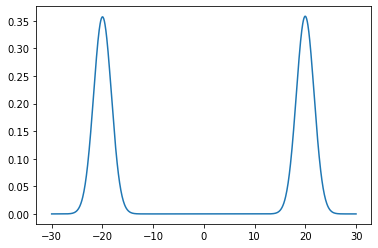

loss b 262.73897706720925


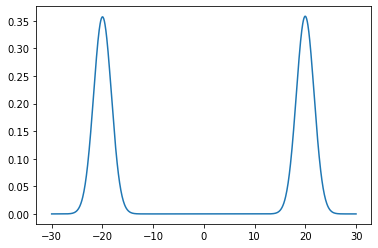

loss b 220.20234056180553


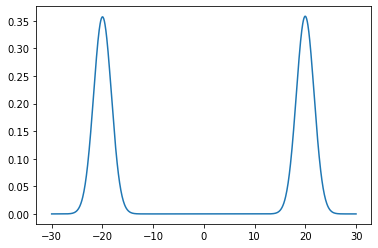

loss b 168.69353393537145


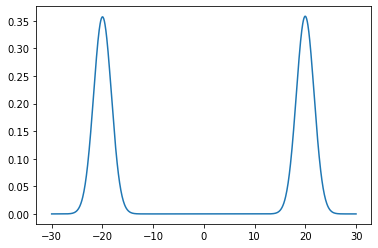

loss b 138.19275561710953


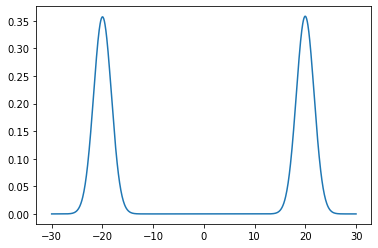

loss b 131.77170120277736


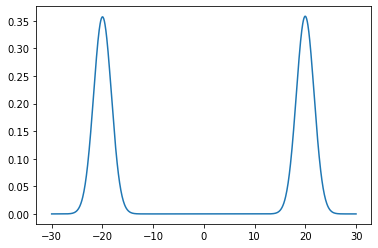

loss b 115.90673754509803


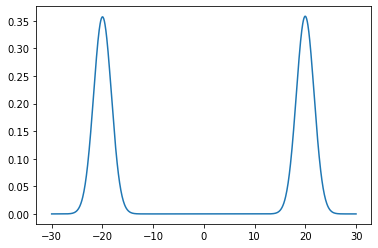

loss b 113.79029729737191


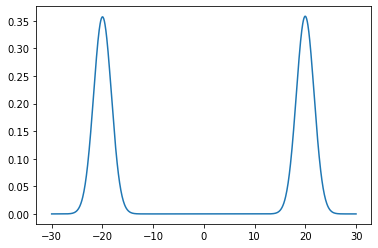

loss b 104.59628424913288


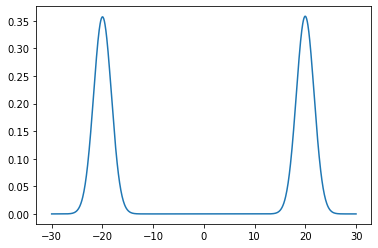

loss b 101.90096831104069


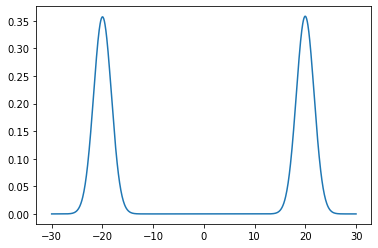

loss b 93.56759940598691


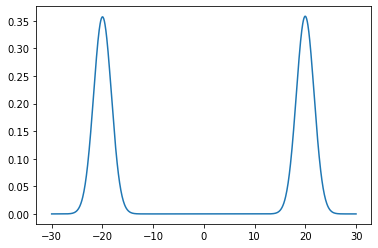

loss b 89.46025526951793


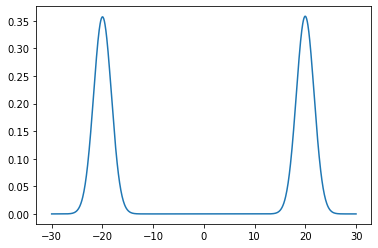

loss b 82.19924701653301


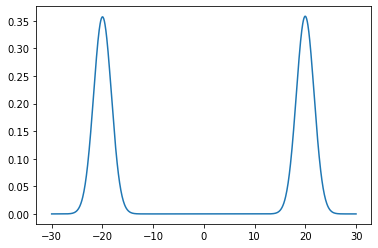

loss b 74.31196499723595


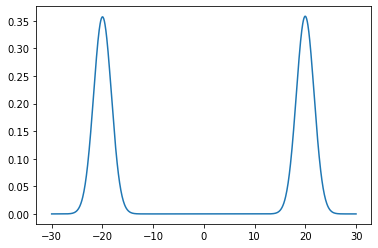

loss b 66.76004239735838


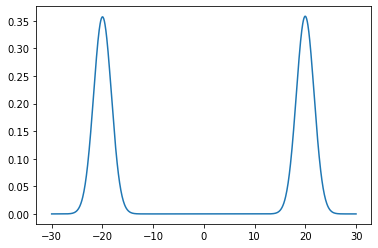

loss b 59.933805801968646


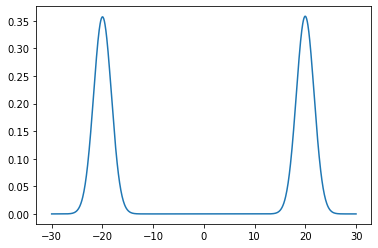

loss b 56.44572012121475


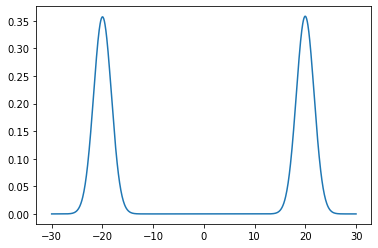

loss b 51.23499497295318


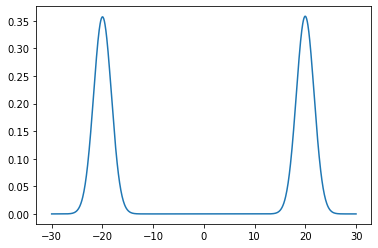

loss b 45.529282738612515


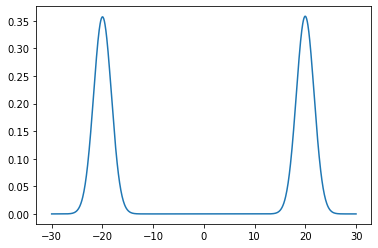

loss b 42.96542512188645


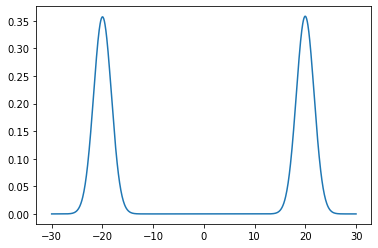

loss b 40.832933710099965


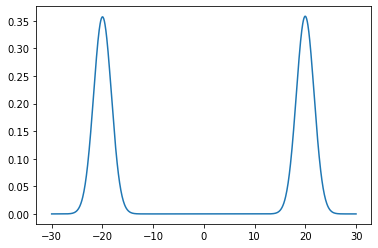

loss b 39.41738943852941


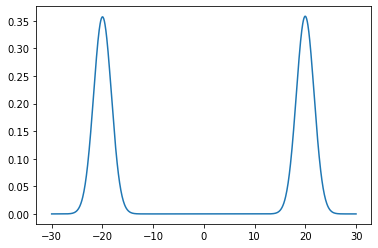

loss b 35.132124786534334


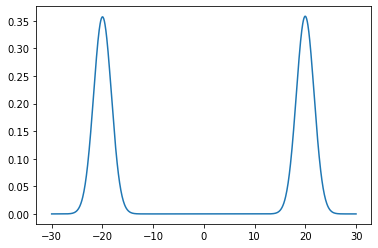

loss b 37.48559817128853


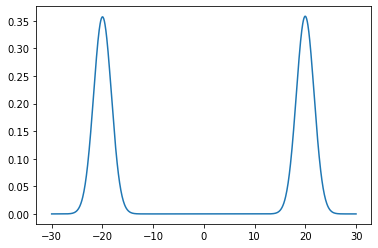

loss b 35.83321998806681


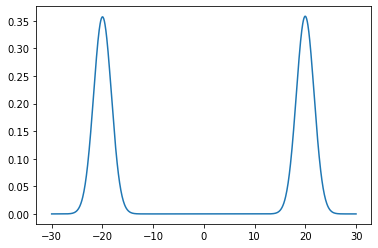

loss b 36.69176912072335


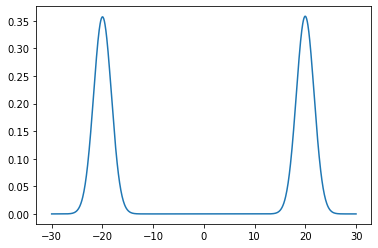

loss b 36.14168807401369


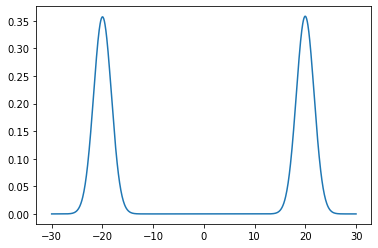

loss b 36.79283408974003


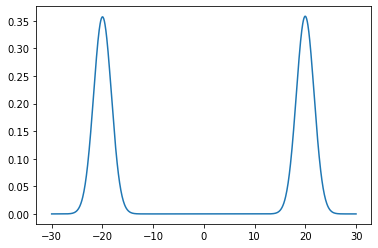

loss b 36.60882092055565


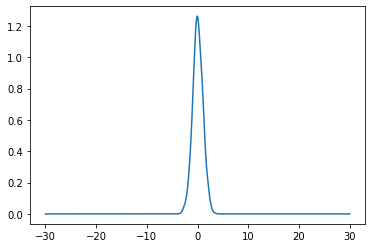

loss f 45.39132286370738


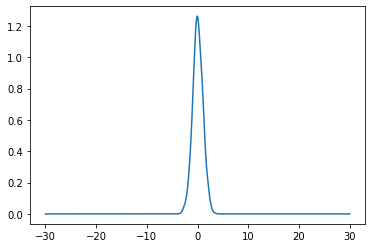

loss f 46.619221323752754


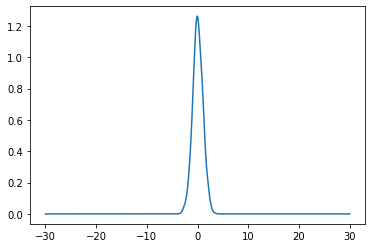

loss f 48.227404126079406


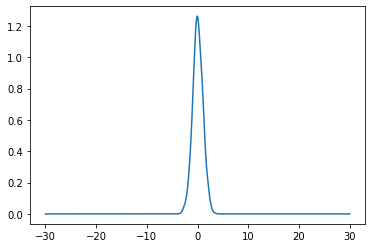

loss f 49.45297073988663


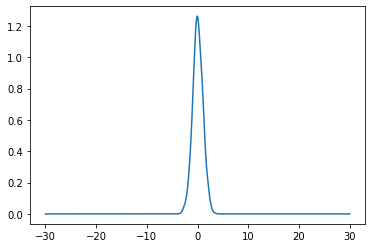

loss f 50.55452572404713


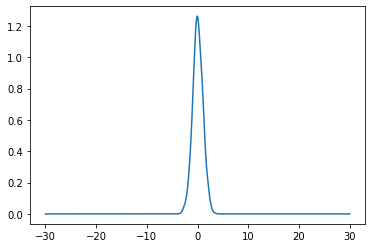

loss f 51.686763004370626


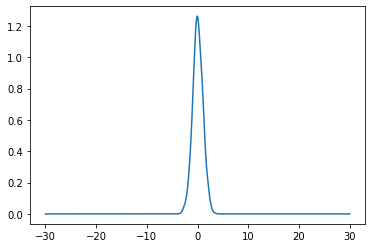

loss f 52.65811168660711


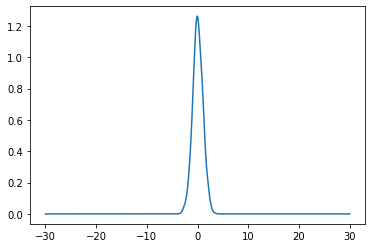

loss f 53.60949128942603


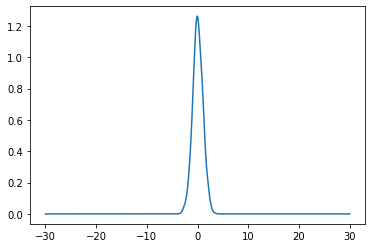

loss f 54.62264692882967


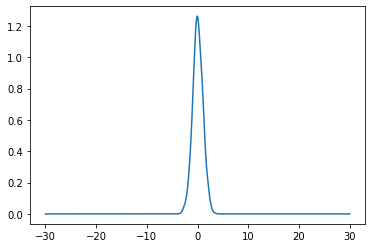

loss f 55.430333871847566


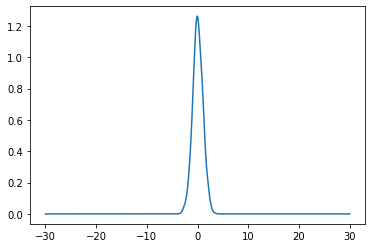

loss f 56.15340616166824


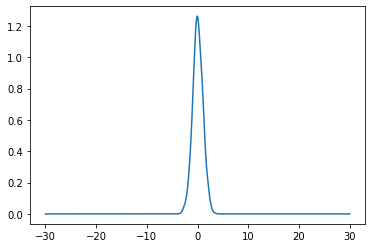

loss f 56.79125209863428


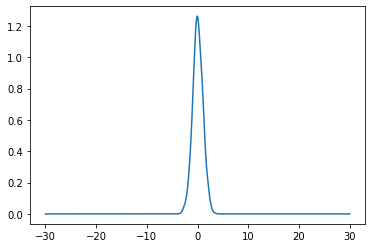

loss f 57.303591894593005


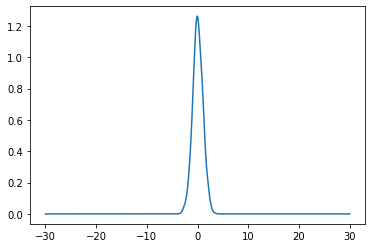

loss f 57.73307100639837


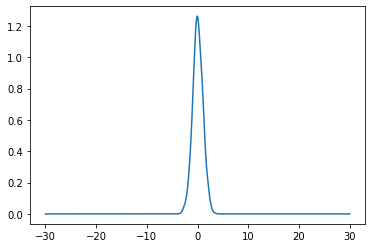

loss f 58.24787786142078


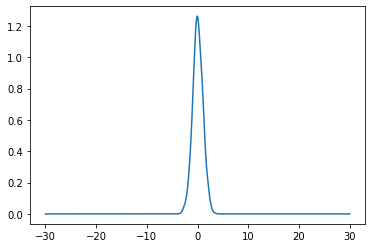

loss f 58.656620149236325


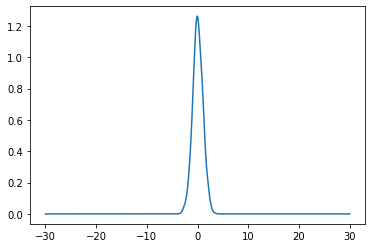

loss f 58.82352728623726


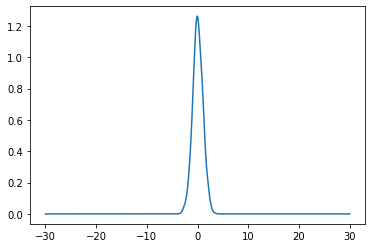

loss f 58.95520640067394


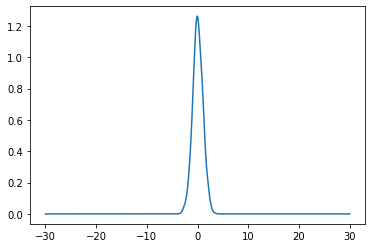

loss f 59.065648653303334


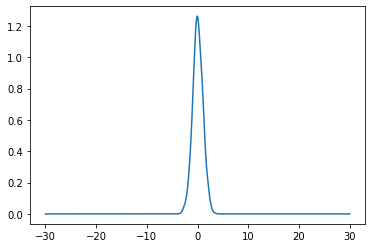

loss f 59.090994364186734


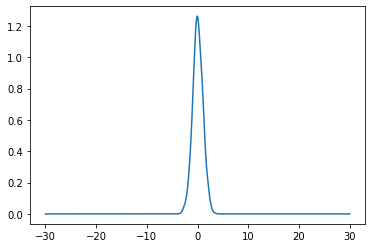

loss f 59.19223634202881


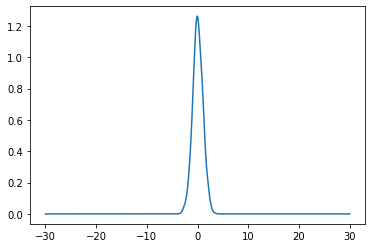

loss f 59.05901410715238


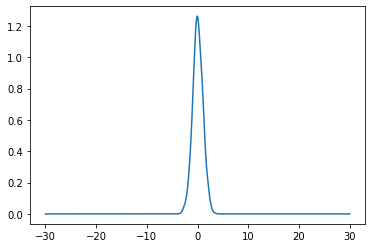

loss f 58.6593956053111


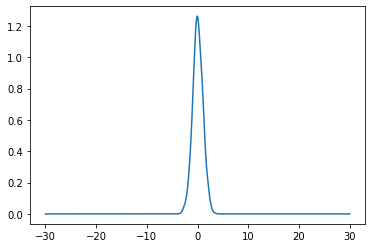

loss f 58.082194267981244


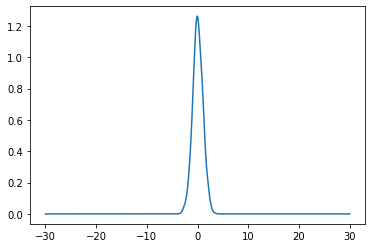

loss f 57.92220218178662


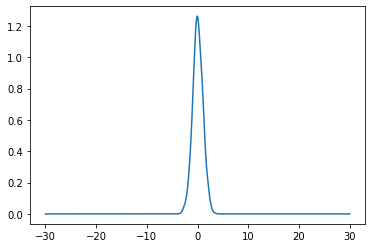

loss f 57.4676120745553


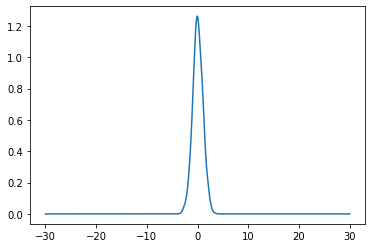

loss f 56.94229656571924


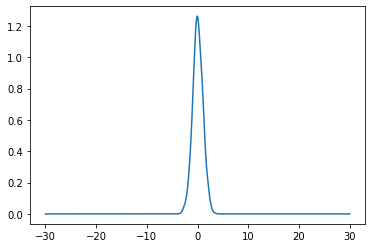

loss f 56.4179365231079


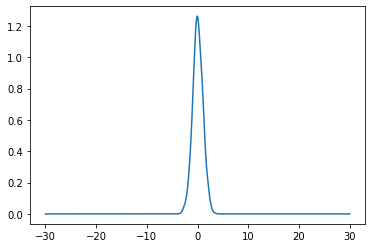

loss f 55.94425961613772


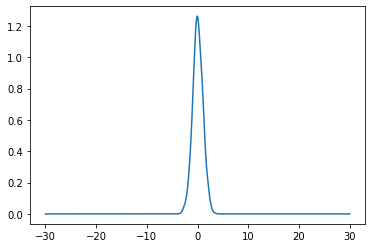

loss f 55.30413698391524


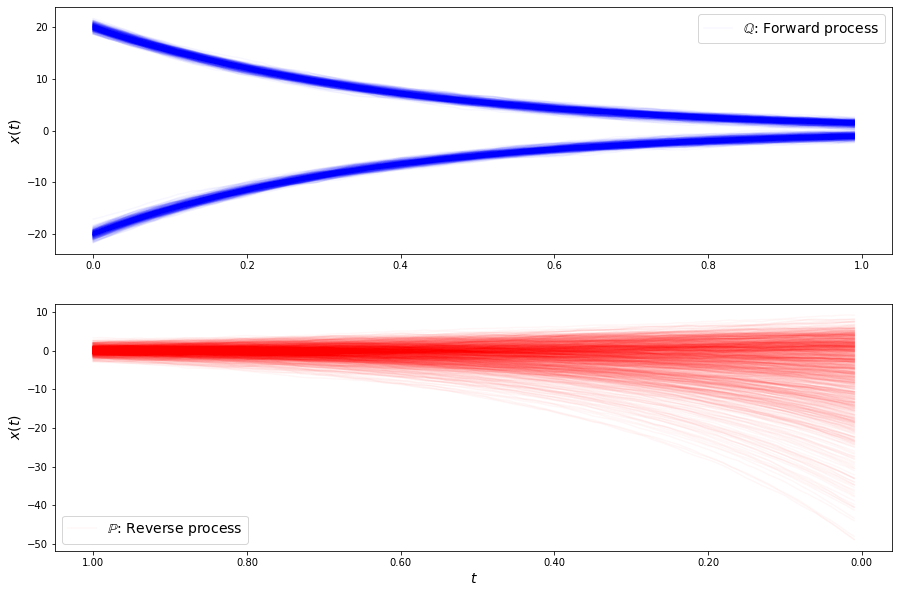

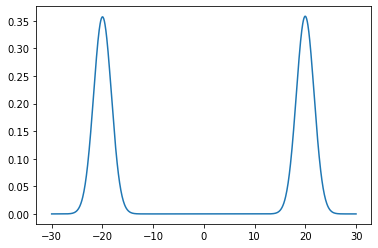

loss b 37.3154331103131


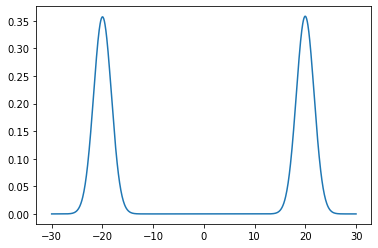

loss b 37.36655419158243


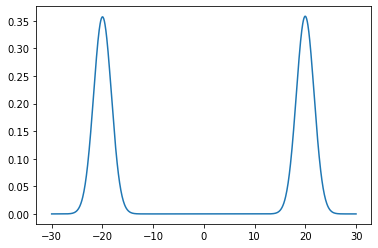

loss b 37.50711460547977


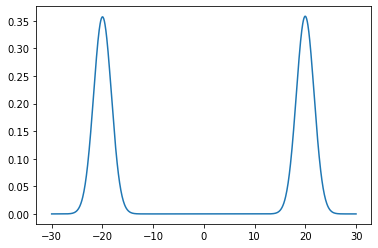

loss b 37.77753817968038


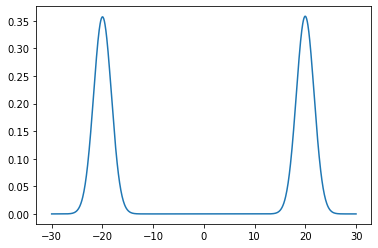

loss b 38.770263890634354


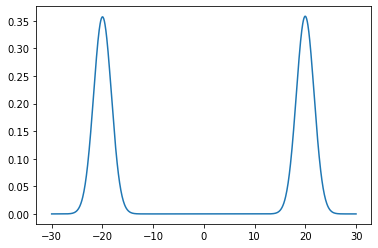

loss b 39.35115691476574


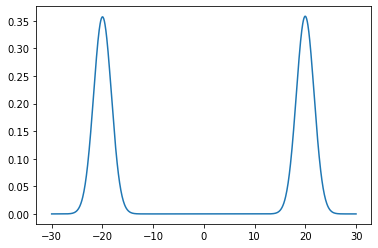

loss b 40.682717738417885


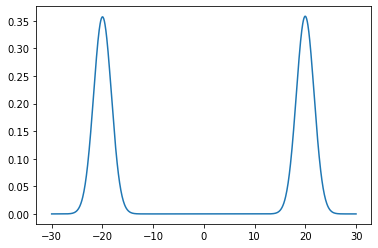

loss b 40.29765227797133


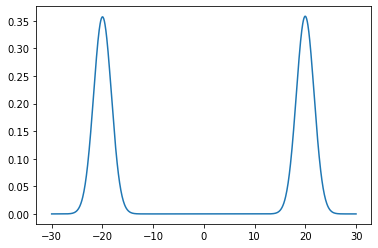

loss b 41.45289830722214


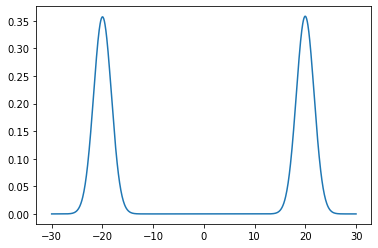

loss b 42.16555041385596


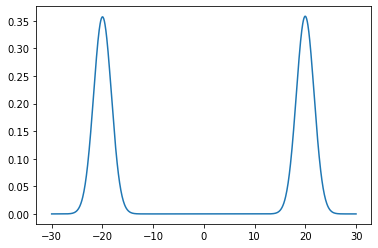

loss b 43.06280205452995


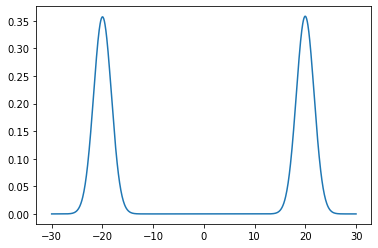

loss b 43.50748455926384


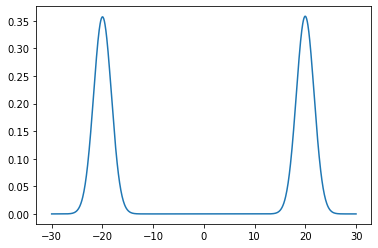

loss b 43.828417838448885


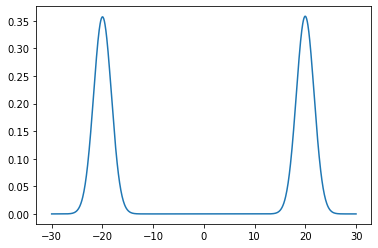

loss b 44.915779527642506


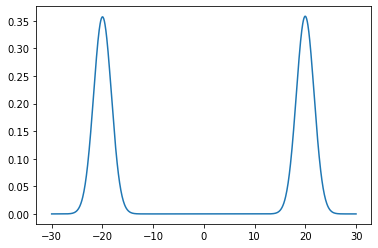

loss b 45.02967824007819


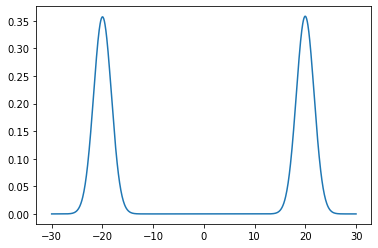

loss b 45.615163151579594


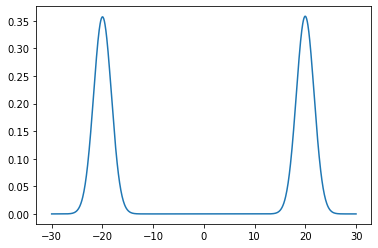

loss b 45.926372734099374


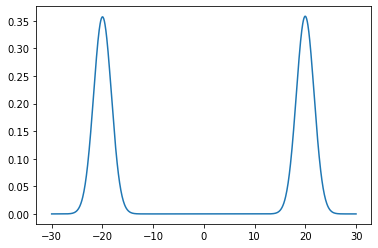

loss b 47.04581914817595


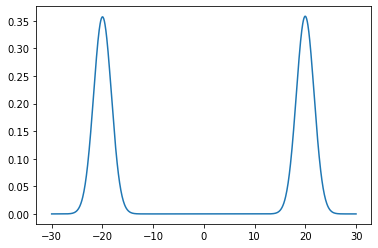

loss b 47.300122579789765


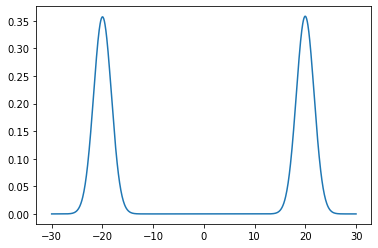

loss b 48.07308090093197


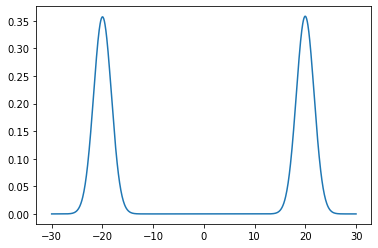

loss b 48.72928491428273


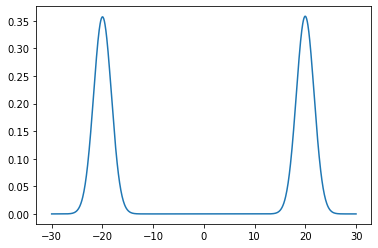

loss b 48.54718363441793


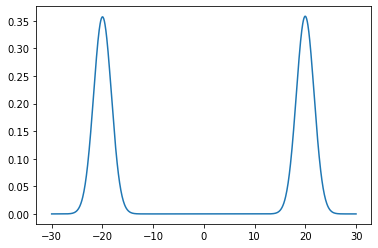

loss b 49.61332371785033


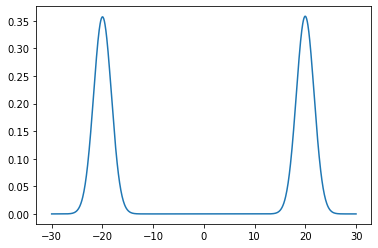

loss b 50.15139226475034


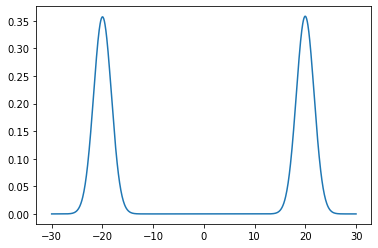

loss b 50.05218564262925


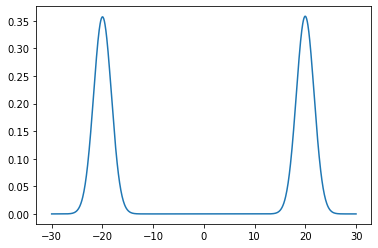

loss b 50.64452756849783


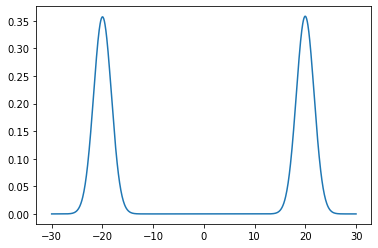

loss b 50.88510087158556


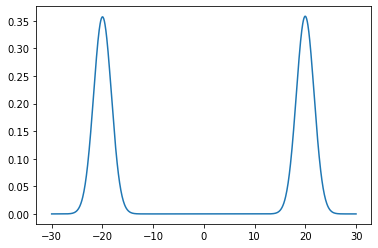

loss b 50.83252195305442


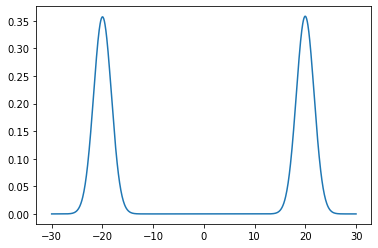

loss b 51.69061291860761


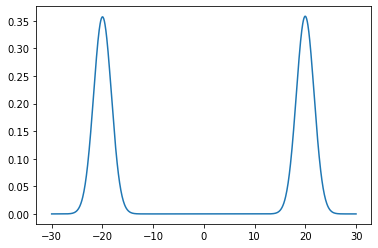

loss b 51.95776009527621


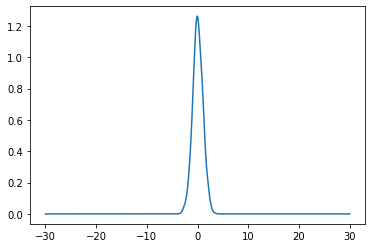

loss f 153.5435741586049


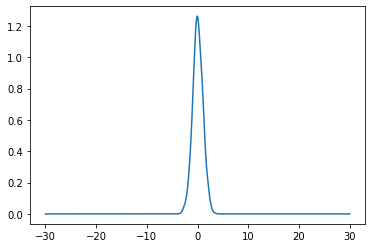

loss f 151.526488292857


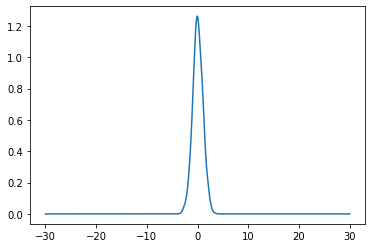

loss f 148.3206092617649


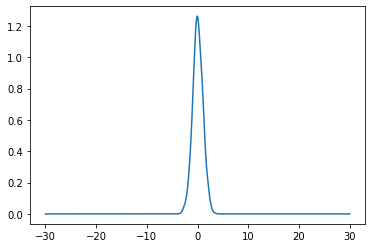

loss f 145.28506848620972


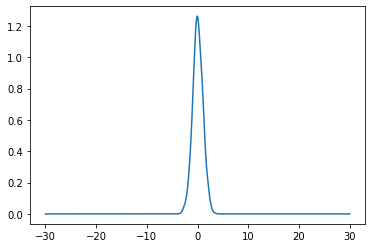

loss f 142.3329139076312


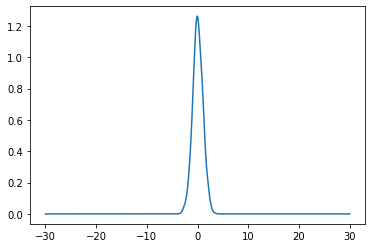

loss f 140.09398454961257


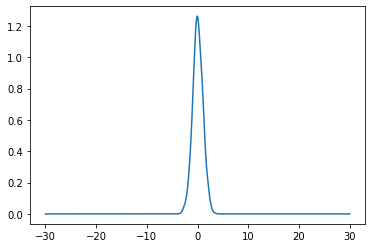

loss f 135.67715887926798


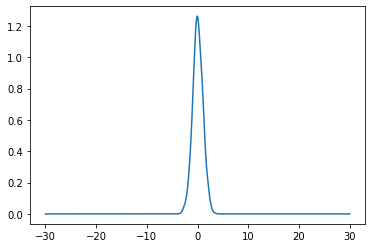

loss f 132.86195129736248


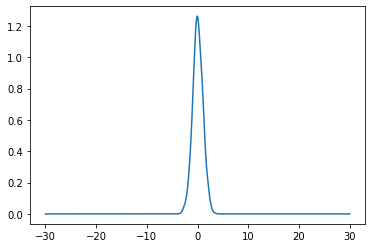

loss f 129.62334513795815


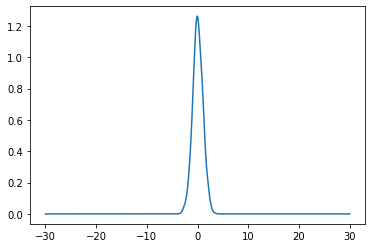

loss f 125.77945030507155


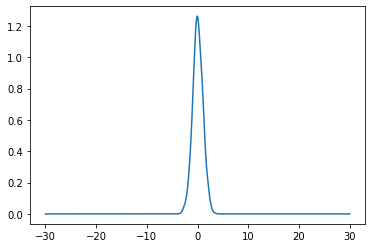

loss f 122.25390179460274


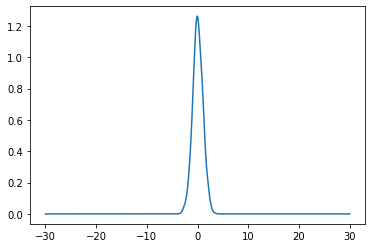

loss f 119.17609472295345


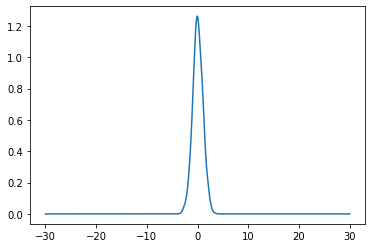

loss f 114.85303056963862


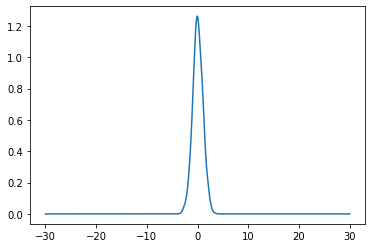

loss f 111.98224810271614


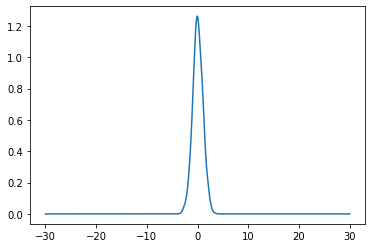

loss f 108.64154762636866


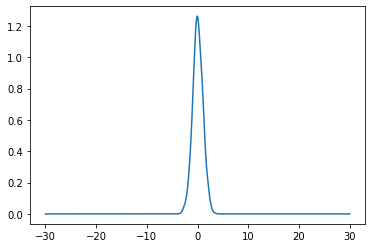

loss f 105.65885795602404


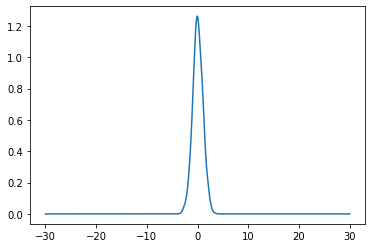

loss f 103.56716521607736


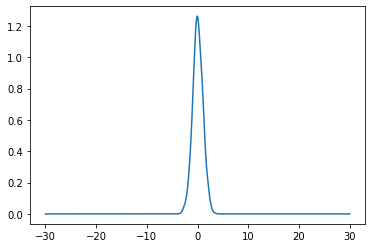

loss f 101.61095904047505


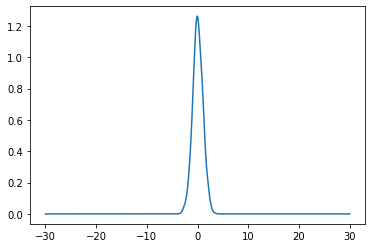

loss f 100.15650459077119


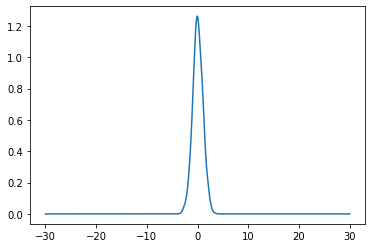

loss f 99.72556206528053


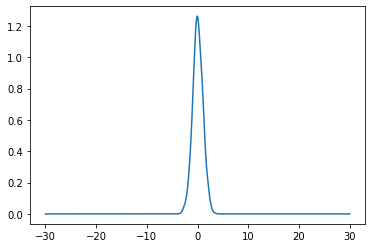

loss f 100.15192789571753


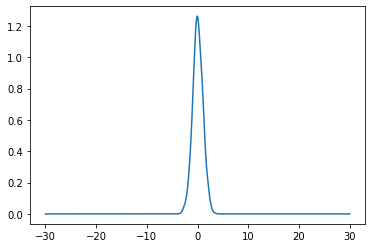

loss f 100.30636337713908


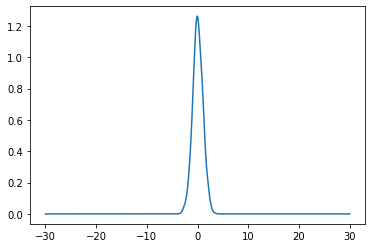

loss f 101.39478552263394


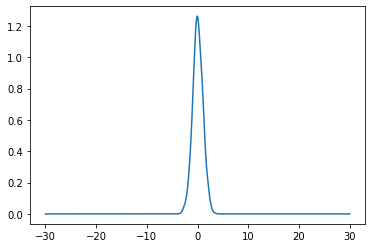

loss f 103.23960494925014


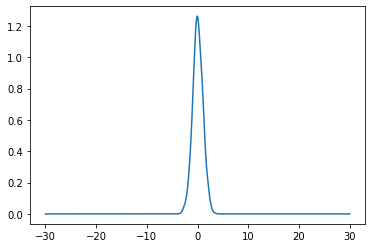

loss f 103.95625919007166


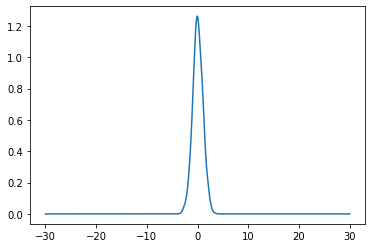

loss f 103.30215678060372


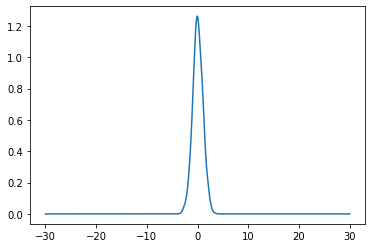

loss f 101.00135522704672


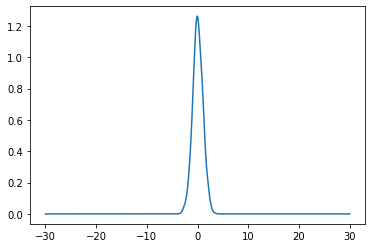

loss f 97.27694382205401


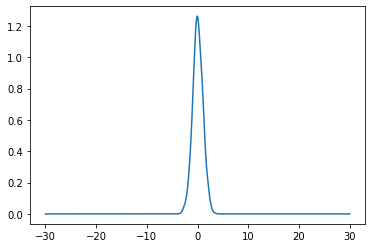

loss f 94.37911989023235


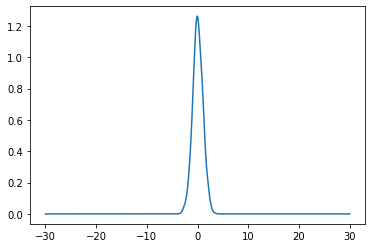

loss f 89.73342774759139


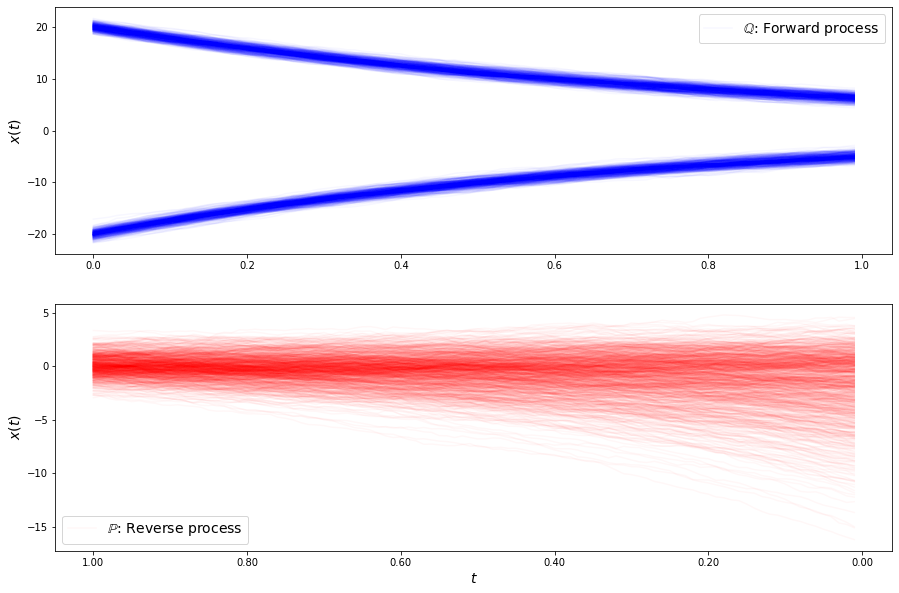

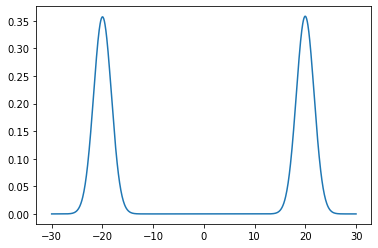

loss b 48.71853416244066


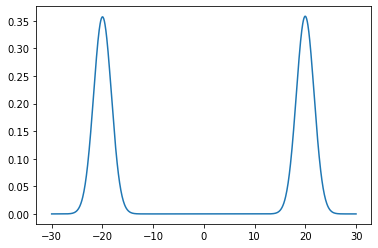

loss b 48.75608141728524


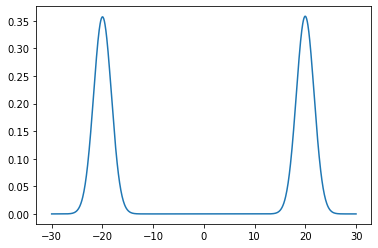

loss b 48.862462093788224


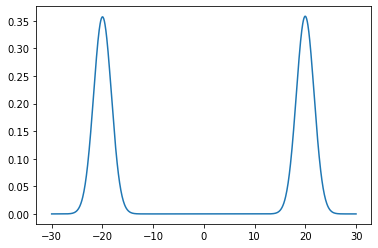

loss b 49.7232065022412


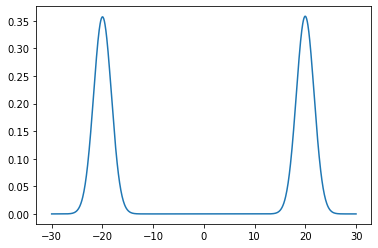

loss b 49.67890934490618


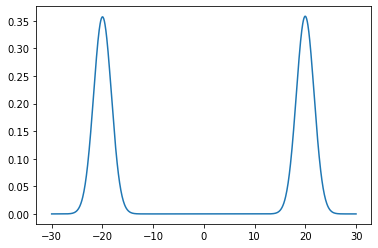

loss b 49.809408164410485


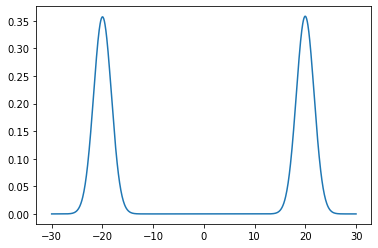

loss b 49.827221425381914


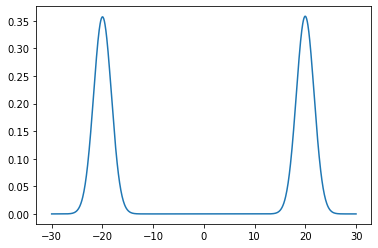

loss b 49.84233755077162


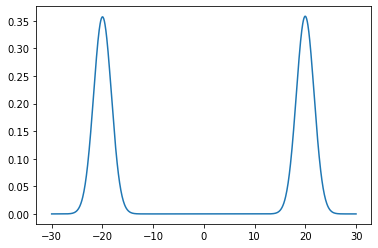

loss b 50.38955570476676


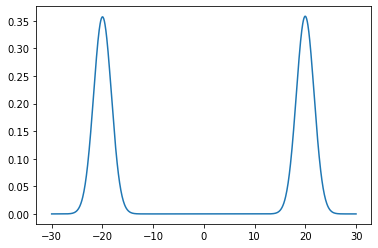

loss b 50.78092064538873


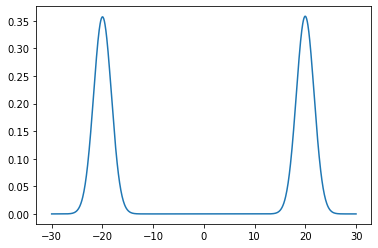

loss b 50.47360779986494


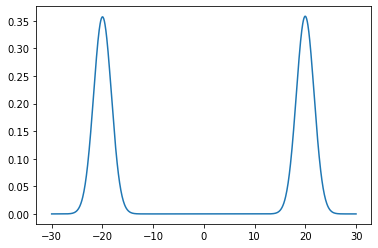

loss b 50.97525171778765


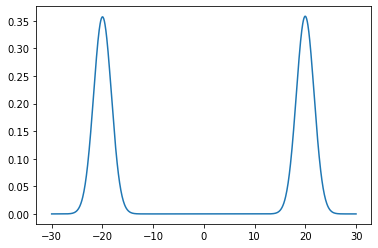

loss b 51.08056904098548


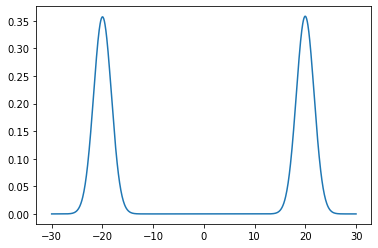

loss b 51.218454828651254


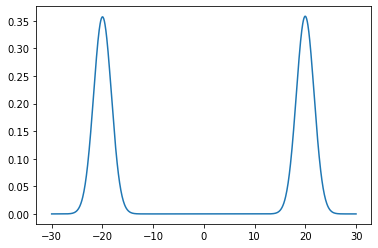

loss b 51.63029091938929


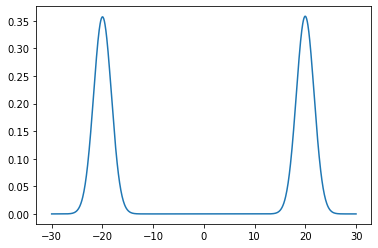

loss b 51.8231018168255


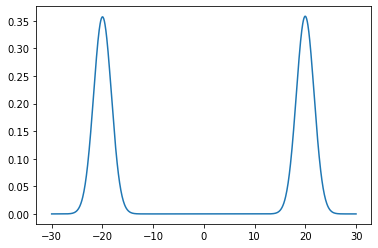

loss b 51.668218283577914


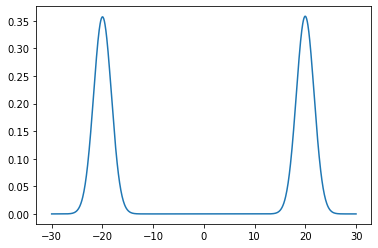

loss b 52.06726564994616


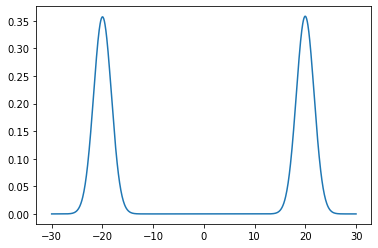

loss b 52.1762174454833


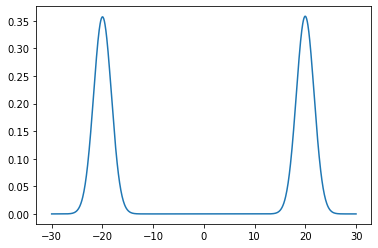

loss b 52.25114534156758


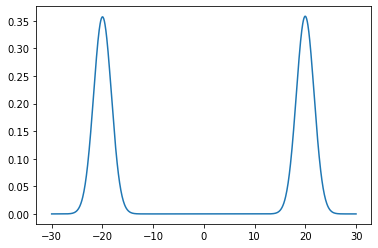

loss b 52.63268374796521


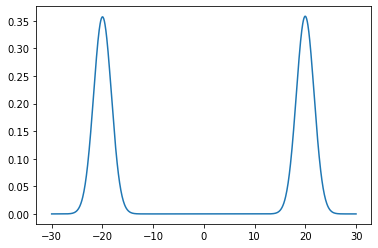

loss b 52.14824936968388


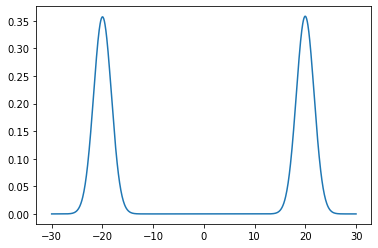

loss b 52.724696052141084


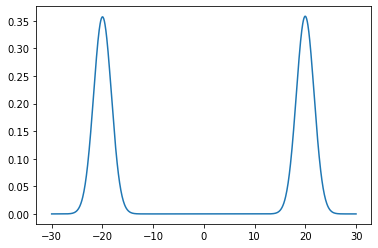

loss b 53.10997990674328


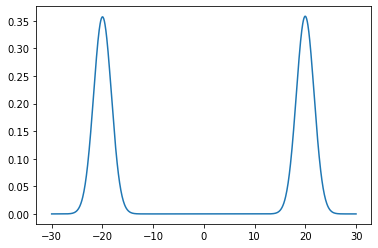

loss b 53.0489662941591


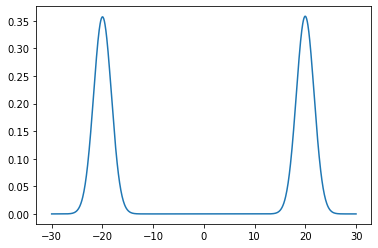

loss b 52.869787269679485


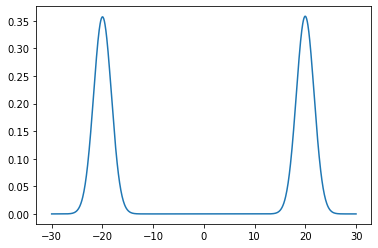

loss b 53.273609577601825


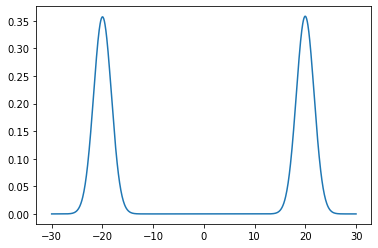

loss b 53.55132615686638


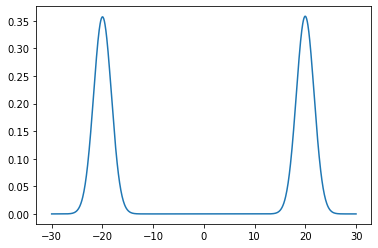

loss b 53.39522098656564


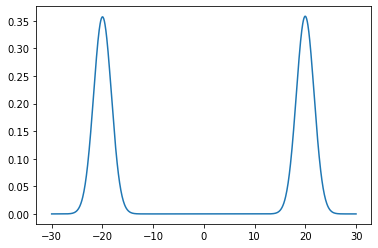

loss b 53.61985261643545


In [ ]:
torch.autograd.set_detect_anomaly(True)
c.fit(1900, 30, burn_iterations=0, plot=True)

In [ ]:
plt.plot(c.loss_f)
plt.show()
plt.plot(c.loss_b)

In [267]:
Xt = torch.linspace(-10, 10, 200).reshape(10, 10, 2).cuda().double().requires_grad_()
# t = torch.ones(100).reshape(100, 1)
# Xt = torch.cat((X,t), dim=1).cuda().double().requires_grad_()
print(Xt.shape)

torch.autograd.functional.jacobian(c.b_forward.forward, Xt).shape

torch.Size([10, 10, 2])


torch.Size([10, 10, 1, 10, 10, 2])

In [268]:
B = c.b_forward.forward(Xt)

In [290]:
Xt.shape

torch.Size([10, 10, 2])

In [291]:
test.shape

torch.Size([10, 10, 2])

In [292]:
c.b_forward.forward

test = torch.autograd.grad(B, Xt, torch.ones_like(B), retain_graph=True, create_graph=True)[0]

In [273]:
xx = Xt[0,0,:].reshape(1,-1).double().cuda().requires_grad_()
print(xx.shape)
# nnnn
test2 = c.b_forward.forward(xx)
test2

torch.Size([1, 2])


tensor([[3.7144]], device='cuda:0', dtype=torch.float64,
       grad_fn=<AddmmBackward>)

In [282]:
test

tensor([[[-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1786, -0.1739],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569]],

        [[-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569]],

        [[-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1891, -0.1569],
         [-0.1800, -0.1560],
         [-0.1947, -0.1443],
         [-0.1947, -0.1443],
         [-0.1947, -0.1443],
         [-0.1947, -0.1443]],

        [[-0.1947, -0.1443],
         [-0.1947, -0.1443],
         [-0.1955, -0.1415],
         [-0.1765, -0.1430],
        

In [278]:
# x
# test3 = 

print(torch.autograd.grad(test2[0], xx, torch.ones_like(test2[0]), retain_graph=True, create_graph=True))

(tensor([[-0.1786, -0.1739]], device='cuda:0', dtype=torch.float64,
       grad_fn=<MmBackward>),)


In [293]:
for i, xx_ in enumerate(Xt):
    for j, x in enumerate(xx_):
        pug = (torch.squeeze(torch.autograd.functional.jacobian(c.b_forward.forward, x))).detach().cpu().numpy()
        pug2 = test[i,j].detach().cpu().numpy()
        print(np.abs(pug - pug2).max())              

2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
5.551115123125783e-17
5.551115123125783e-17
5.551115123125783e-17
5.551115123125783e-17
5.551115123125783e-17
5.551115123125783e-17
5.551115123125783e-17
2.7755575615628914e-17
0.0
0.0
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
2.7755575615628914e-17
5.551115123125783e-17
5.551115123125783e-17
5.551115123125783e-17
2.7755575615628914e-17
5.551115123125783e-17
5.551115123125783e-17
5.5511151231257

In [ ]:
def compute_jacobian(f, x, output_dims):
    '''
    Normal:
        f: input_dims -> output_dims
    Jacobian mode:
        f: output_dims x input_dims -> output_dims x output_dims
    '''
    repeat_dims = tuple(output_dims) + (1,) * len(x.shape)
    jac_x = x.detach().repeat(*repeat_dims)
    jac_x.requires_grad_()
    jac_y = f(jac_x)
    
    ml = torch.meshgrid([torch.arange(dim) for dim in output_dims])
    index = [m.flatten() for m in ml]
    gradient = torch.zeros(output_dims + output_dims)
    gradient.__setitem__(tuple(index)*2, 1)
    
    jac_y.backward(gradient)
        
    return jac_x.grad.data